# Task

Vanilla GAN
- Implement a basic GAN pipeline consisting of a generator and discriminator.
- Train the GAN on MNIST and Fashion-MNIST datasets.
- Monitor training stability by plotting generator and discriminator losses over time.
- Evaluate the quality of generated samples and check for mode collapse by visualizing generated batches during training.

Conditional and Advanced GAN Variants
- Implement a Class-Conditional GAN (cGAN) where the generator is conditioned on class labels.
- Extend the discriminator by experimenting with: PatchGAN architecture, Feature Matching Loss
- Compare the visual quality and diversity of generated samples before and after these modifications.

Bonus (optional): Progressive Growing GAN - 2pt.
- Implement a Progressive GAN and train it on the CIFAR-10 dataset.
- Gradually increase image resolution during training to improve stability and generation quality.
- Visualize the evolution of generated images as the model grows.

# Disclaimer

All analytics on the results with the main plots are in the final report. This notebook contains only the training results.

# Imports

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from typing import Tuple, Dict, List
import matplotlib.pyplot as plt
from pathlib import Path

import math
import random
from typing import Tuple, Dict, List, Optional, Callable

import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.distributions import Normal
from torch.utils.data import DataLoader, random_split

import torchvision
from torchvision import datasets, transforms

# Data Preparing

In [31]:
def get_mnist_loaders(dataset: str = "mnist", data_root: str = "./data", batch_size: int = 128, val_split: float = 0.1):
  if dataset == "mnist":
      DatasetClass = datasets.MNIST
  else:
      DatasetClass = datasets.FashionMNIST

  transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])  # (x - 0.5) / 0.5 -> [-1, 1]
    ])

  full_train = DatasetClass(
      root=data_root,
      train=True,
      download=True,
      transform=transform)

  test_ds = DatasetClass(
      root=data_root,
      train=False,
      download=True,
      transform=transform)

  n_total = len(full_train)
  n_val = int(n_total * val_split)
  n_train = n_total - n_val

  print(f"\n--- {dataset.upper()} DATASET ---")
  print(f"Total train images: {n_total}")
  print(f"  Train split:      {n_train}")
  print(f"  Validation split: {n_val}")
  print(f"Test set size:      {len(test_ds)}\n")

  train_ds, val_ds = random_split(
      full_train,
      [n_train, n_val],
      generator=torch.Generator().manual_seed(42))

  train_loader = DataLoader(
      train_ds,
      batch_size=batch_size,
      shuffle=True)

  val_loader = DataLoader(
      val_ds,
      batch_size=batch_size,
      shuffle=False)

  test_loader = DataLoader(
      test_ds,
      batch_size=batch_size,
      shuffle=False)

  return train_loader, val_loader, test_loader

def show_samples(loader, title: str):
  x, y = next(iter(loader))
  x = x[:4]
  y = y[:4]

  fig, axes = plt.subplots(1, 4, figsize=(8, 2))
  fig.suptitle(title)

  for i in range(4):
    img = x[i].squeeze(0)
    axes[i].imshow(img, cmap="gray")
    axes[i].set_title(f"label: {y[i].item()}")
    axes[i].axis("off")

  plt.tight_layout()
  plt.show()


--- MNIST DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000



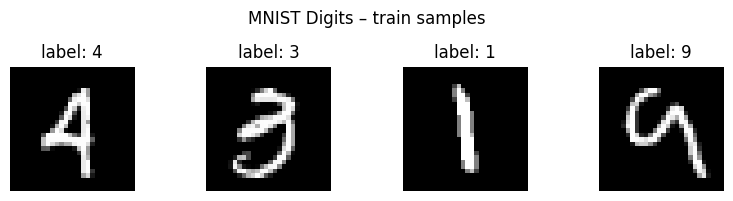


--- FASHION DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000



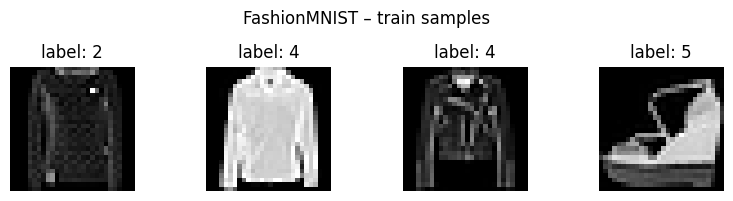

In [32]:
train_digits, val_digits, test_digits = get_mnist_loaders(
    dataset="mnist",
    batch_size=128)
show_samples(train_digits, "MNIST Digits – train samples")

train_fashion, val_fashion, test_fashion = get_mnist_loaders(
    dataset="fashion",
    batch_size=128)
show_samples(train_fashion, "FashionMNIST – train samples")

# General Helpers

## Model Base

In [4]:
class Generator(nn.Module):
  def __init__(self, latent_dim: int, img_shape: Tuple[int, int, int]):
    super().__init__()
    self.latent_dim = latent_dim
    self.img_shape = img_shape

  def sample_noise(self, batch_size: int, device: str = "cuda") -> torch.Tensor:
    return torch.randn(batch_size, self.latent_dim, device=device)

class Discriminator(nn.Module):
  def __init__(self, img_shape: Tuple[int, int, int]):
    super().__init__()
    self.img_shape = img_shape

## Loss Function

In [5]:
def generator_loss(fake_preds: torch.Tensor) -> torch.Tensor:
  """Standard -log(D(G(z)))"""
  return nn.BCELoss()(fake_preds, torch.ones_like(fake_preds))

def discriminator_loss(real_preds: torch.Tensor, fake_preds: torch.Tensor) -> torch.Tensor:
  """Standard discriminator loss"""
  real_loss = nn.BCELoss()(real_preds, torch.ones_like(real_preds))
  fake_loss = nn.BCELoss()(fake_preds, torch.zeros_like(fake_preds))
  return real_loss + fake_loss

## Training

In [6]:
def train_step(generator: nn.Module, discriminator: nn.Module, real_imgs: torch.Tensor,
               g_optimizer: optim.Optimizer, d_optimizer: optim.Optimizer, device: str = "cuda") -> Dict[str, float]:
  batch_size = real_imgs.size(0)
  real_imgs = real_imgs.to(device)

  # discriminator
  discriminator.zero_grad()

  real_preds = discriminator(real_imgs)
  noise = generator.sample_noise(batch_size, device)
  fake_imgs = generator(noise).detach()
  fake_preds = discriminator(fake_imgs)

  d_loss = discriminator_loss(real_preds, fake_preds)
  d_loss.backward()
  d_optimizer.step()

  # generator
  generator.zero_grad()

  noise = generator.sample_noise(batch_size, device)
  fake_imgs = generator(noise)
  fake_preds = discriminator(fake_imgs)

  g_loss = generator_loss(fake_preds)
  g_loss.backward()
  g_optimizer.step()

  return {"g_loss": g_loss.item(),
          "d_loss": d_loss.item(),
          "d_real": real_preds.mean().item(),
          "d_fake": fake_preds.mean().item()}

def train_epoch(generator: nn.Module, discriminator: nn.Module, dataloader: torch.utils.data.DataLoader,
                g_optimizer: optim.Optimizer, d_optimizer: optim.Optimizer, device: str = "cuda") -> Dict[str, float]:
  generator.train()
  discriminator.train()

  metrics = {"g_loss": 0, "d_loss": 0, "d_real": 0, "d_fake": 0}

  for real_imgs, _ in dataloader:
    step_metrics = train_step(generator, discriminator, real_imgs, g_optimizer, d_optimizer, device)
    for k, v in step_metrics.items():
      metrics[k] += v

  n_batches = len(dataloader)
  return {k: v / n_batches for k, v in metrics.items()}

def train_gan(generator: nn.Module, discriminator: nn.Module, train_loader: torch.utils.data.DataLoader,
              val_loader: torch.utils.data.DataLoader, n_epochs: int, lr_g: float = 2e-4, lr_d: float = 2e-4,
              device: str = "cuda") -> Dict[str, List[float]]:
  generator = generator.to(device)
  discriminator = discriminator.to(device)

  g_optimizer = optim.Adam(generator.parameters(), lr=lr_g, betas=(0.5, 0.999))
  d_optimizer = optim.Adam(discriminator.parameters(), lr=lr_d, betas=(0.5, 0.999))

  history = {"g_loss": [], "d_loss": [], "d_real": [], "d_fake": []}

  for epoch in range(1, n_epochs + 1):
    metrics = train_epoch(generator, discriminator, train_loader, g_optimizer, d_optimizer, device)

    for k, v in metrics.items():
      history[k].append(v)

    print(f"Epoch {epoch}/{n_epochs} | "
          f"G_loss: {metrics['g_loss']:.4f} | "
          f"D_loss: {metrics['d_loss']:.4f} | "
          f"D(x): {metrics['d_real']:.3f} | "
          f"D(G(z)): {metrics['d_fake']:.3f}")

  return history

In [7]:
def save_checkpoint(generator: nn.Module, discriminator: nn.Module, g_optimizer: optim.Optimizer,
                    d_optimizer: optim.Optimizer, epoch: int, path: str):
  torch.save({
      "epoch": epoch,
      "generator": generator.state_dict(),
      "discriminator": discriminator.state_dict(),
      "g_optimizer": g_optimizer.state_dict(),
      "d_optimizer": d_optimizer.state_dict()}, path)

def load_checkpoint(generator: nn.Module, discriminator: nn.Module, g_optimizer: optim.Optimizer,
                    d_optimizer: optim.Optimizer, path: str, device: str = "cuda") -> int:
  checkpoint = torch.load(path, map_location=device)
  generator.load_state_dict(checkpoint["generator"])
  discriminator.load_state_dict(checkpoint["discriminator"])
  g_optimizer.load_state_dict(checkpoint["g_optimizer"])
  d_optimizer.load_state_dict(checkpoint["d_optimizer"])
  return checkpoint["epoch"]

## Evaluation & Visualization

In [9]:
@torch.no_grad()
def generate_samples(generator: nn.Module, n_samples: int = 64, device: str = "cuda") -> torch.Tensor:
  generator.eval()
  noise = generator.sample_noise(n_samples, device)
  return generator(noise).cpu()

def visualize_samples(imgs: torch.Tensor, n_rows: int = 8, title: str = "Generated Samples", figsize: Tuple[int, int] = (10, 10)):
  n_samples = imgs.size(0)
  n_cols = (n_samples + n_rows - 1) // n_rows

  fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
  axes = axes.flatten() if n_rows * n_cols > 1 else [axes]

  for i, ax in enumerate(axes):
    if i < n_samples:
      img = imgs[i].squeeze(0)
      ax.imshow(img, cmap="gray", vmin=0, vmax=1)
    ax.axis("off")

  fig.suptitle(title, fontsize=16)
  plt.tight_layout()
  plt.show()

def plot_training_history(history: Dict[str, List[float]]):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

  epochs = range(1, len(history["g_loss"]) + 1)

  ax1.plot(epochs, history["g_loss"], label="Generator", linewidth=2)
  ax1.plot(epochs, history["d_loss"], label="Discriminator", linewidth=2)
  ax1.set_xlabel("Epoch")
  ax1.set_ylabel("Loss")
  ax1.set_title("Training Losses")
  ax1.legend()
  ax1.grid(alpha=0.3)

  ax2.plot(epochs, history["d_real"], label="D(x) - Real", linewidth=2)
  ax2.plot(epochs, history["d_fake"], label="D(G(z)) - Fake", linewidth=2)
  ax2.axhline(0.5, color="red", linestyle="--", alpha=0.5, label="Optimal")
  ax2.set_xlabel("Epoch")
  ax2.set_ylabel("Discriminator Output")
  ax2.set_title("Discriminator Predictions")
  ax2.legend()
  ax2.grid(alpha=0.3)

  plt.tight_layout()
  plt.show()

@torch.no_grad()
def evaluate_gan(generator: nn.Module, discriminator: nn.Module, val_loader: torch.utils.data.DataLoader,
                 device: str = "cuda") -> Dict[str, float]:
  generator.eval()
  discriminator.eval()

  metrics = {"g_loss": 0, "d_loss": 0, "d_real": 0, "d_fake": 0}

  for real_imgs, _ in val_loader:
    real_imgs = real_imgs.to(device)
    batch_size = real_imgs.size(0)

    real_preds = discriminator(real_imgs)
    noise = generator.sample_noise(batch_size, device)
    fake_imgs = generator(noise)
    fake_preds = discriminator(fake_imgs)

    metrics["g_loss"] += generator_loss(fake_preds).item()
    metrics["d_loss"] += discriminator_loss(real_preds, fake_preds).item()
    metrics["d_real"] += real_preds.mean().item()
    metrics["d_fake"] += fake_preds.mean().item()

  n_batches = len(val_loader)
  return {k: v / n_batches for k, v in metrics.items()}

# Vanilla GAN

## Architecture

In [10]:
class VanillaGenerator(Generator):
  def __init__(self, latent_dim: int = 100, img_shape: Tuple[int, int, int] = (1, 28, 28)):
    super().__init__(latent_dim, img_shape)

    img_size = img_shape[1] * img_shape[2] * img_shape[0]

    self.model = nn.Sequential(
        nn.Linear(latent_dim, 256),
        nn.LeakyReLU(0.2),
        nn.BatchNorm1d(256),

        nn.Linear(256, 512),
        nn.LeakyReLU(0.2),
        nn.BatchNorm1d(512),

        nn.Linear(512, 1024),
        nn.LeakyReLU(0.2),
        nn.BatchNorm1d(1024),

        nn.Linear(1024, img_size),
        nn.Tanh())

  def forward(self, z: torch.Tensor) -> torch.Tensor:
    img = self.model(z)
    return img.view(img.size(0), *self.img_shape)


class VanillaDiscriminator(Discriminator):
  def __init__(self, img_shape: Tuple[int, int, int] = (1, 28, 28)):
    super().__init__(img_shape)

    img_size = img_shape[1] * img_shape[2] * img_shape[0]

    self.model = nn.Sequential(
        nn.Flatten(),

        nn.Linear(img_size, 512),
        nn.LeakyReLU(0.2),
        nn.Dropout(0.3),

        nn.Linear(512, 256),
        nn.LeakyReLU(0.2),
        nn.Dropout(0.3),

        nn.Linear(256, 1),
        nn.Sigmoid())

  def forward(self, img: torch.Tensor) -> torch.Tensor:
    return self.model(img)

## Helpers

### Training

In [11]:
def train_gan_with_monitoring(generator: nn.Module, discriminator: nn.Module, train_loader: torch.utils.data.DataLoader,
                              val_loader: torch.utils.data.DataLoader, n_epochs: int, lr_g: float = 2e-4, lr_d: float = 2e-4,
                              device: str = "cuda", sample_interval: int = 5, n_sample_imgs: int = 64) -> Dict[str, List[float]]:
  generator = generator.to(device)
  discriminator = discriminator.to(device)

  g_optimizer = optim.Adam(generator.parameters(), lr=lr_g, betas=(0.5, 0.999))
  d_optimizer = optim.Adam(discriminator.parameters(), lr=lr_d, betas=(0.5, 0.999))

  history = {"g_loss": [], "d_loss": [], "d_real": [], "d_fake": []}

  # generate fixed noise for consistent visualization
  fixed_noise = generator.sample_noise(n_sample_imgs, device)

  for epoch in range(1, n_epochs + 1):
    metrics = train_epoch(
        generator, discriminator, train_loader,
        g_optimizer, d_optimizer, device)

    for k, v in metrics.items():
      history[k].append(v)

    print(f"Epoch {epoch}/{n_epochs} | "
          f"G_loss: {metrics['g_loss']:.4f} | "
          f"D_loss: {metrics['d_loss']:.4f} | "
          f"D(x): {metrics['d_real']:.3f} | "
          f"D(G(z)): {metrics['d_fake']:.3f}")

    if epoch % sample_interval == 0 or epoch == 1:
      generator.eval()
      with torch.no_grad():
        fake_imgs = generator(fixed_noise).cpu()
      visualize_samples(
          fake_imgs,
          n_rows=8,
          title=f"Generated Samples - Epoch {epoch}",
          figsize=(10, 10))
      generator.train()

  return history

### Mode Colapse Detection

In [12]:
@torch.no_grad()
def analyze_mode_collapse(generator: nn.Module, n_samples: int = 1000, device: str = "cuda") -> Dict[str, float]:
  generator.eval()

  samples = generate_samples(generator, n_samples, device)
  samples_flat = samples.view(n_samples, -1)

  # Compute pairwise distances
  dists = torch.cdist(samples_flat, samples_flat)

  # Remove diagonal (self-distances)
  mask = ~torch.eye(n_samples, dtype=torch.bool)
  dists = dists[mask].view(n_samples, n_samples - 1)

  min_dists = dists.min(dim=1)[0]

  return {"mean_min_distance": min_dists.mean().item(),
          "std_min_distance": min_dists.std().item(),
          "mean_pairwise_distance": dists.mean().item()}


def visualize_diversity_grid(generator: nn.Module, n_grids: int = 4, samples_per_grid: int = 25, device: str = "cuda"):
  generator.eval()

  fig, axes = plt.subplots(2, 2, figsize=(12, 12))
  axes = axes.flatten()

  for idx in range(n_grids):
    samples = generate_samples(generator, samples_per_grid, device)

    # Create grid for this subplot
    grid_size = int(samples_per_grid ** 0.5)
    ax = axes[idx]

    grid_img = torch.zeros(grid_size * 28, grid_size * 28)
    for i in range(grid_size):
      for j in range(grid_size):
        sample_idx = i * grid_size + j
        if sample_idx < samples_per_grid:
          grid_img[i*28:(i+1)*28, j*28:(j+1)*28] = samples[sample_idx].squeeze()

    ax.imshow(grid_img, cmap="gray", vmin=0, vmax=1)
    ax.set_title(f"Batch {idx + 1}")
    ax.axis("off")

  plt.suptitle("Mode Collapse Check - Different Random Batches", fontsize=16)
  plt.tight_layout()
  plt.show()

### Pipeline

In [15]:
def run_vanilla_gan_experiment(dataset_name: str = "mnist", latent_dim: int = 100, n_epochs: int = 50,
                               batch_size: int = 128, lr_g: float = 2e-4, lr_d: float = 2e-4,
                               device: str = "cuda", sample_interval: int = 5):
  print(f"\nVannila GAN Training - {dataset_name.upper()}")
  print(f"{'-'*70}\n")

  train_loader, val_loader, test_loader = get_mnist_loaders(dataset=dataset_name, batch_size=batch_size)

  img_shape = (1, 28, 28)
  generator = VanillaGenerator(latent_dim=latent_dim, img_shape=img_shape)
  discriminator = VanillaDiscriminator(img_shape=img_shape)

  print(f"Generator parameters: {sum(p.numel() for p in generator.parameters()):,}")
  print(f"Discriminator parameters: {sum(p.numel() for p in discriminator.parameters()):,}\n")

  print("Starting training...\n")
  history = train_gan_with_monitoring(
      generator=generator,
      discriminator=discriminator,
      train_loader=train_loader,
      val_loader=val_loader,
      n_epochs=n_epochs,
      lr_g=lr_g,
      lr_d=lr_d,
      device=device,
      sample_interval=sample_interval)

  print("\nTraining completed! Plotting results...\n")
  plot_training_history(history)

  val_metrics = evaluate_gan(generator, discriminator, val_loader, device)
  print(f"\nValidation Metrics:")
  print(f"  G_loss: {val_metrics['g_loss']:.4f}")
  print(f"  D_loss: {val_metrics['d_loss']:.4f}")
  print(f"  D(x): {val_metrics['d_real']:.3f}")
  print(f"  D(G(z)): {val_metrics['d_fake']:.3f}\n")

  print("Analyzing mode collapse...")
  collapse_metrics = analyze_mode_collapse(generator, n_samples=1000, device=device)
  print(f"  Mean min distance: {collapse_metrics['mean_min_distance']:.4f}")
  print(f"  Std min distance: {collapse_metrics['std_min_distance']:.4f}")
  print(f"  Mean pairwise distance: {collapse_metrics['mean_pairwise_distance']:.4f}\n")

  print("Visualizing sample diversity...\n")
  visualize_diversity_grid(generator, n_grids=4, samples_per_grid=25, device=device)

  final_samples = generate_samples(generator, n_samples=64, device=device)
  visualize_samples(final_samples, n_rows=8, title="Final Generated Samples", figsize=(10, 10))

  return generator, discriminator, history

## Experiments


Vannila GAN Training - MNIST
----------------------------------------------------------------------


--- MNIST DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000

Generator parameters: 1,489,936
Discriminator parameters: 533,505

Starting training...

Epoch 1/50 | G_loss: 1.1864 | D_loss: 0.8118 | D(x): 0.817 | D(G(z)): 0.369


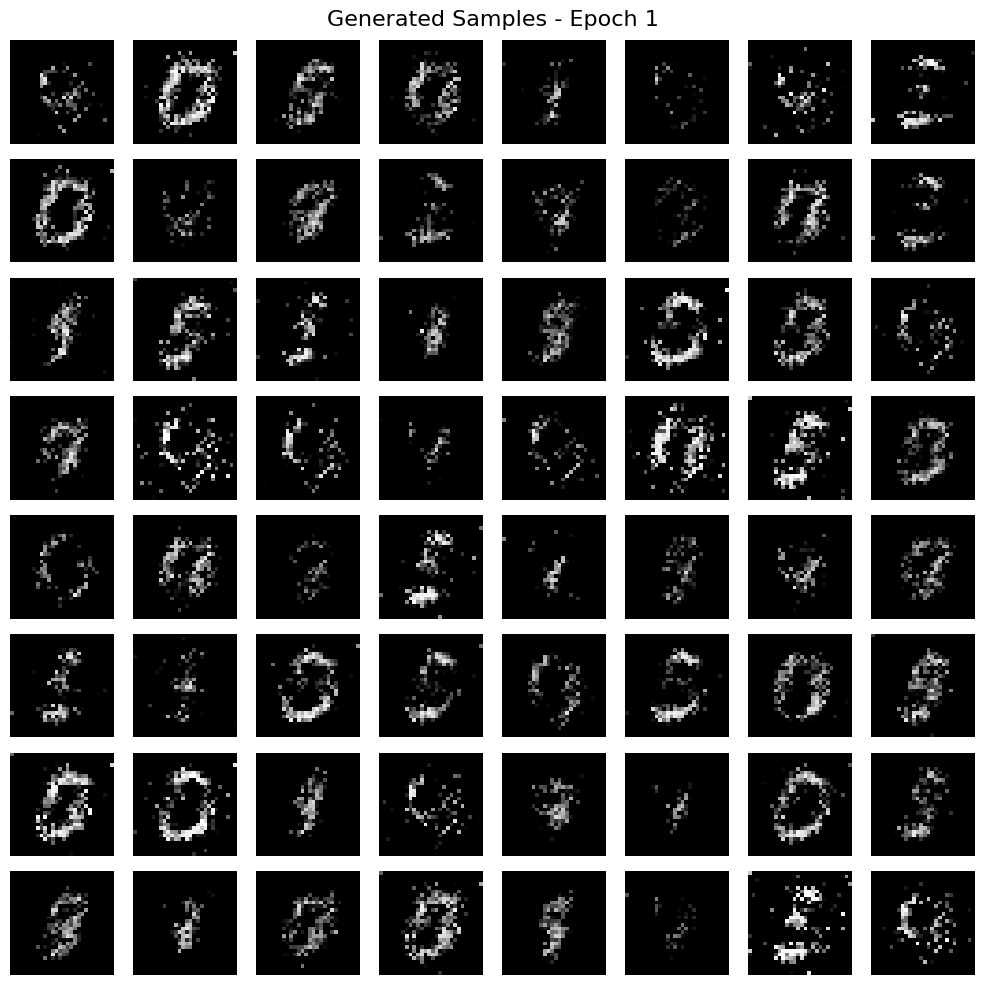

Epoch 2/50 | G_loss: 0.8436 | D_loss: 1.2400 | D(x): 0.591 | D(G(z)): 0.450
Epoch 3/50 | G_loss: 0.8497 | D_loss: 1.2596 | D(x): 0.565 | D(G(z)): 0.446
Epoch 4/50 | G_loss: 0.8621 | D_loss: 1.2567 | D(x): 0.565 | D(G(z)): 0.443
Epoch 5/50 | G_loss: 0.8634 | D_loss: 1.2666 | D(x): 0.560 | D(G(z)): 0.442


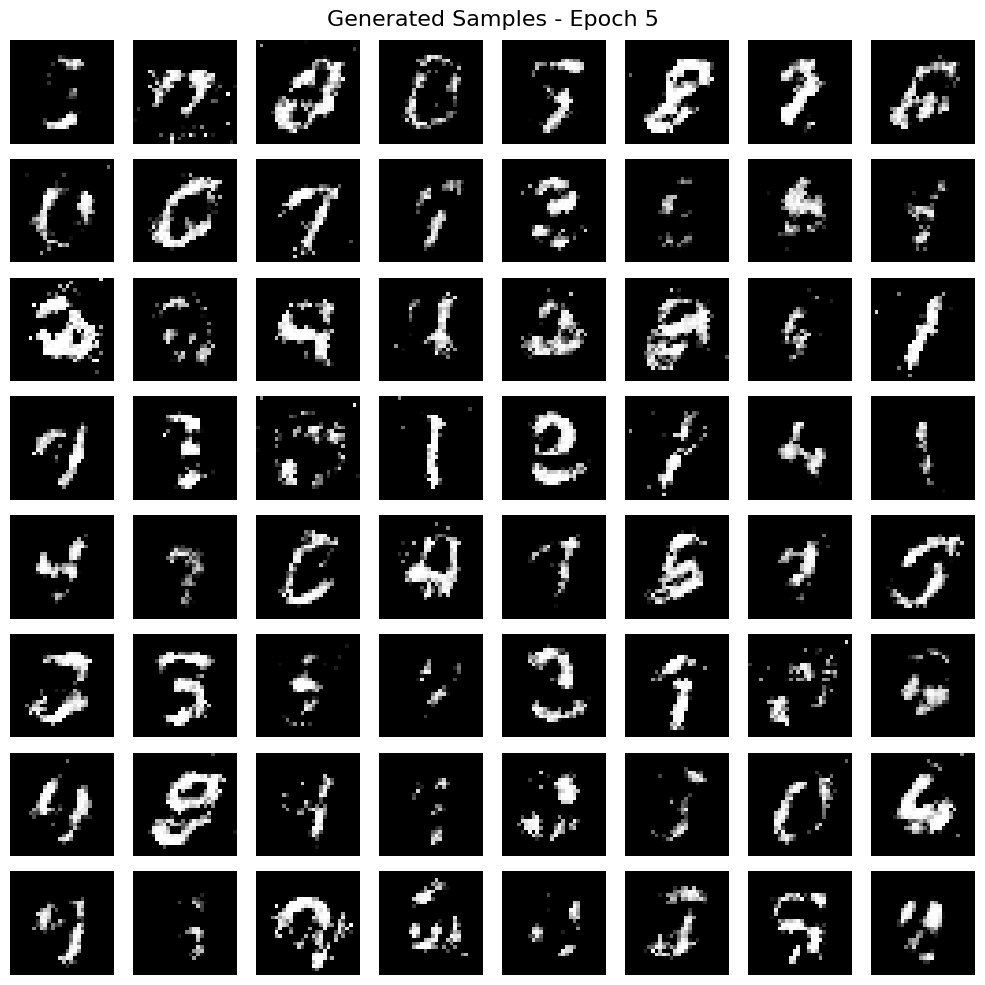

Epoch 6/50 | G_loss: 0.8447 | D_loss: 1.2769 | D(x): 0.555 | D(G(z)): 0.448
Epoch 7/50 | G_loss: 0.8092 | D_loss: 1.3059 | D(x): 0.542 | D(G(z)): 0.460
Epoch 8/50 | G_loss: 0.7735 | D_loss: 1.3315 | D(x): 0.531 | D(G(z)): 0.472
Epoch 9/50 | G_loss: 0.7644 | D_loss: 1.3358 | D(x): 0.528 | D(G(z)): 0.475
Epoch 10/50 | G_loss: 0.7612 | D_loss: 1.3390 | D(x): 0.525 | D(G(z)): 0.476


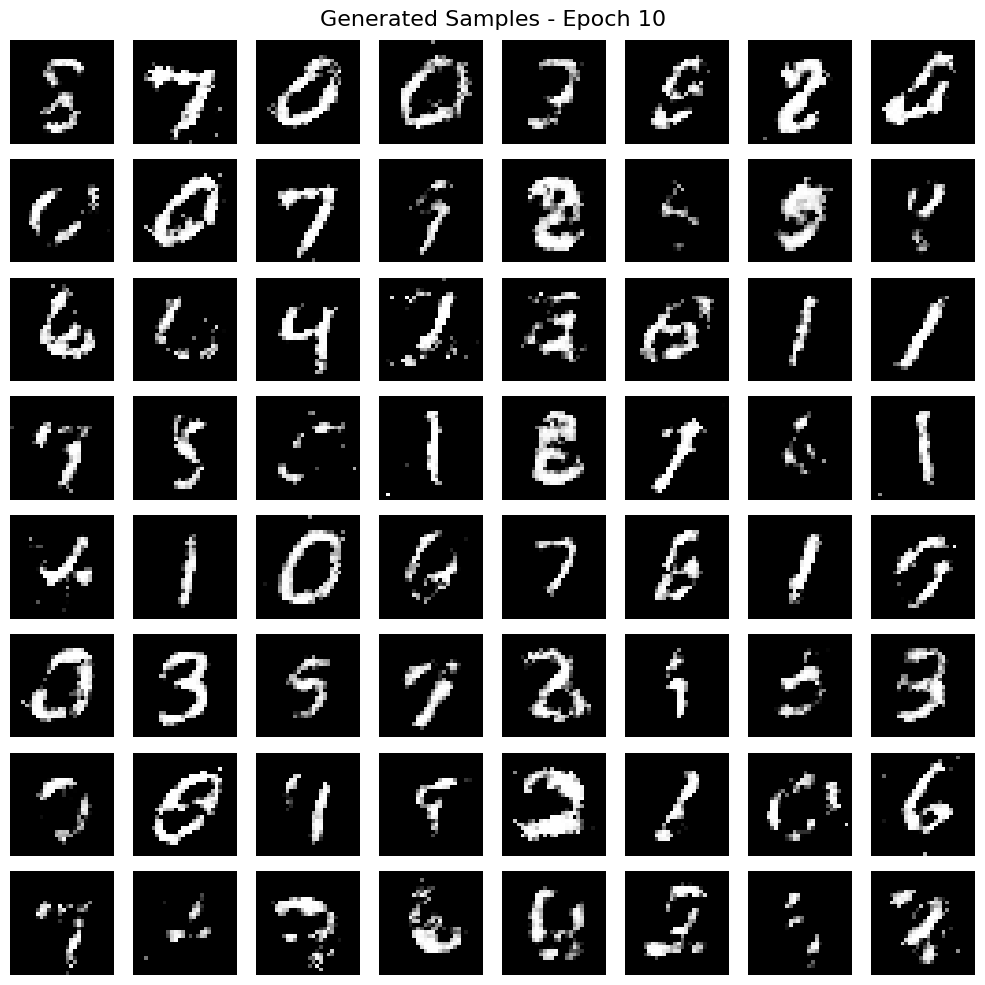

Epoch 11/50 | G_loss: 0.7574 | D_loss: 1.3447 | D(x): 0.523 | D(G(z)): 0.477
Epoch 12/50 | G_loss: 0.7522 | D_loss: 1.3496 | D(x): 0.520 | D(G(z)): 0.479
Epoch 13/50 | G_loss: 0.7518 | D_loss: 1.3497 | D(x): 0.519 | D(G(z)): 0.479
Epoch 14/50 | G_loss: 0.7510 | D_loss: 1.3501 | D(x): 0.519 | D(G(z)): 0.479
Epoch 15/50 | G_loss: 0.7486 | D_loss: 1.3541 | D(x): 0.517 | D(G(z)): 0.480


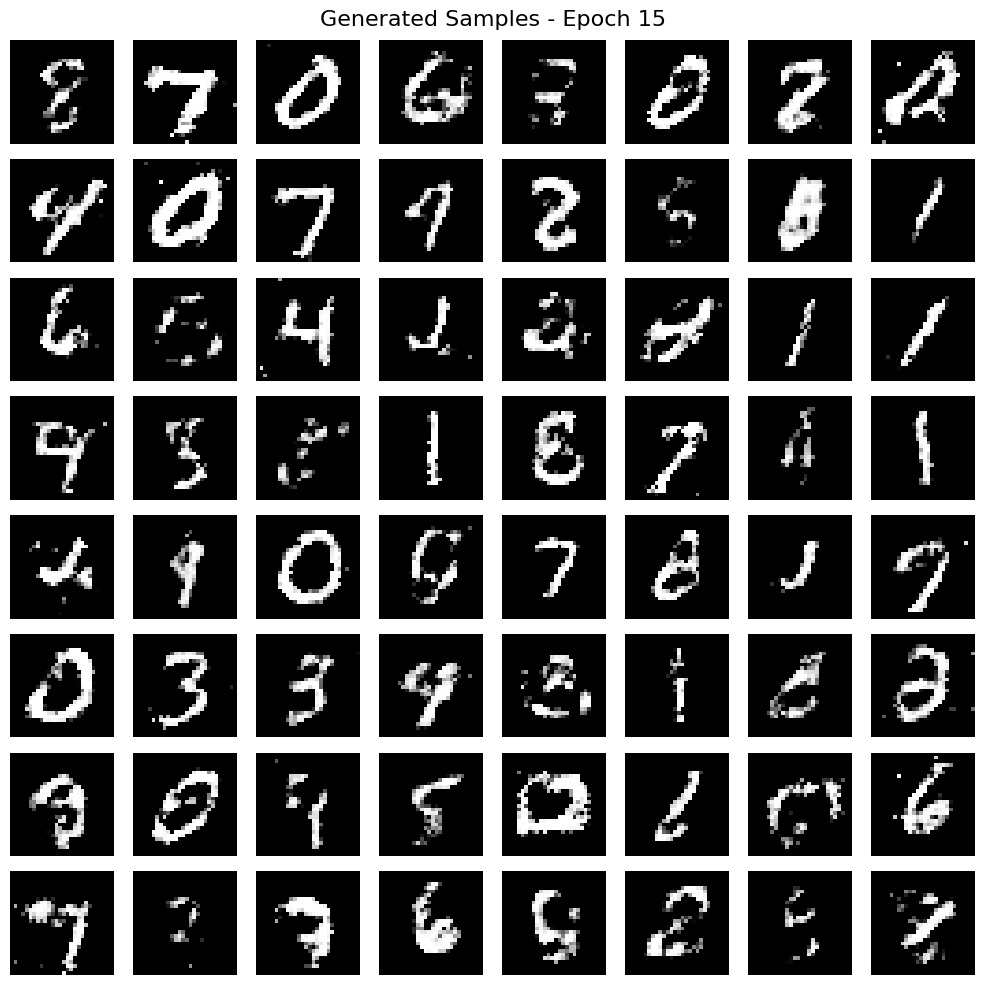

Epoch 16/50 | G_loss: 0.7473 | D_loss: 1.3566 | D(x): 0.516 | D(G(z)): 0.480
Epoch 17/50 | G_loss: 0.7475 | D_loss: 1.3567 | D(x): 0.516 | D(G(z)): 0.480
Epoch 18/50 | G_loss: 0.7451 | D_loss: 1.3583 | D(x): 0.515 | D(G(z)): 0.482
Epoch 19/50 | G_loss: 0.7410 | D_loss: 1.3587 | D(x): 0.515 | D(G(z)): 0.483
Epoch 20/50 | G_loss: 0.7411 | D_loss: 1.3609 | D(x): 0.514 | D(G(z)): 0.483


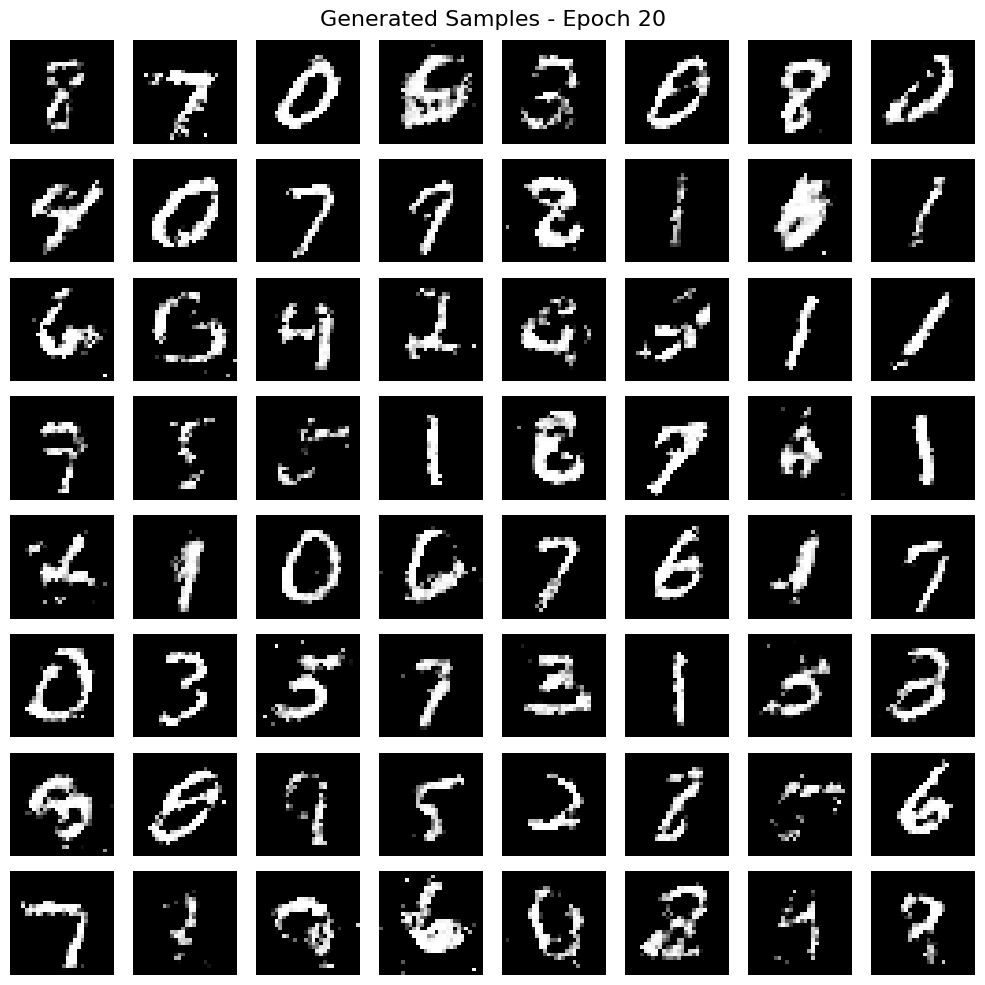

Epoch 21/50 | G_loss: 0.7395 | D_loss: 1.3622 | D(x): 0.514 | D(G(z)): 0.484
Epoch 22/50 | G_loss: 0.7392 | D_loss: 1.3629 | D(x): 0.513 | D(G(z)): 0.484
Epoch 23/50 | G_loss: 0.7369 | D_loss: 1.3637 | D(x): 0.513 | D(G(z)): 0.485
Epoch 24/50 | G_loss: 0.7357 | D_loss: 1.3659 | D(x): 0.512 | D(G(z)): 0.485
Epoch 25/50 | G_loss: 0.7367 | D_loss: 1.3637 | D(x): 0.513 | D(G(z)): 0.485


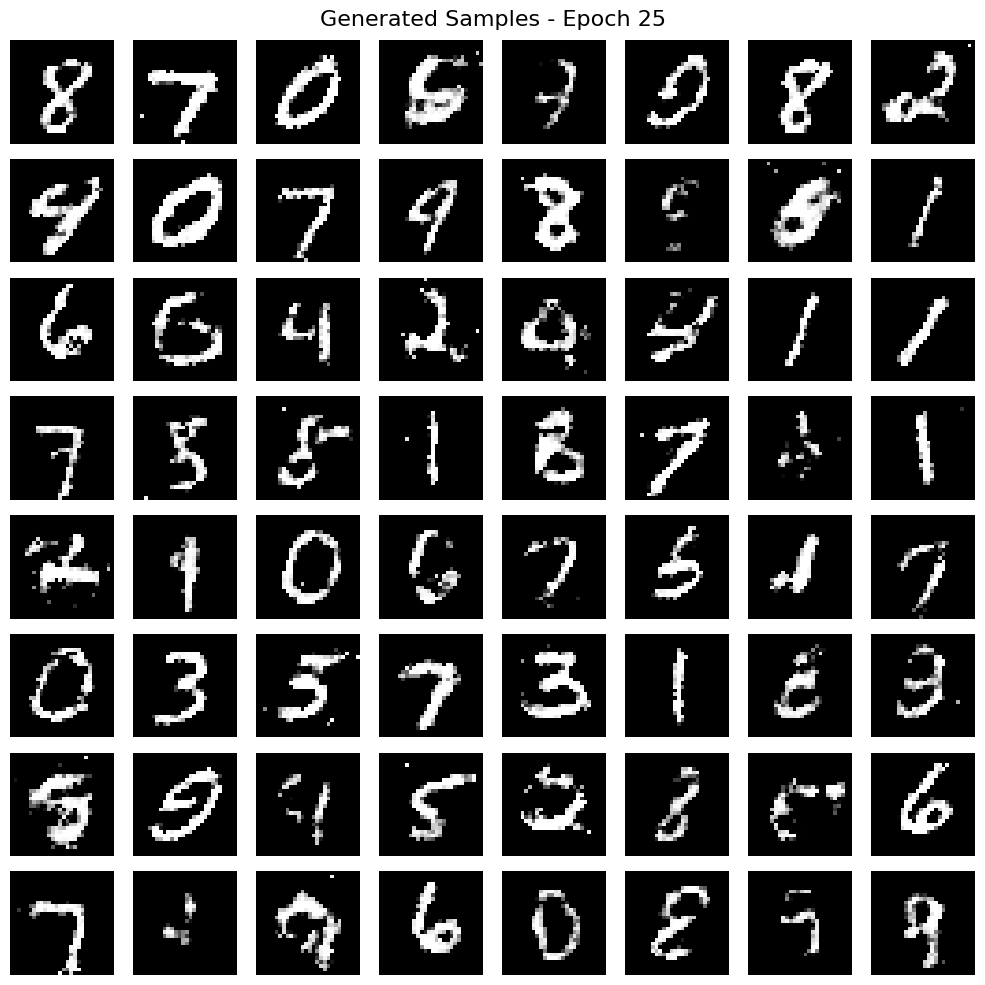

Epoch 26/50 | G_loss: 0.7383 | D_loss: 1.3642 | D(x): 0.512 | D(G(z)): 0.484
Epoch 27/50 | G_loss: 0.7346 | D_loss: 1.3657 | D(x): 0.512 | D(G(z)): 0.485
Epoch 28/50 | G_loss: 0.7352 | D_loss: 1.3644 | D(x): 0.512 | D(G(z)): 0.485
Epoch 29/50 | G_loss: 0.7361 | D_loss: 1.3655 | D(x): 0.512 | D(G(z)): 0.485
Epoch 30/50 | G_loss: 0.7325 | D_loss: 1.3663 | D(x): 0.511 | D(G(z)): 0.486


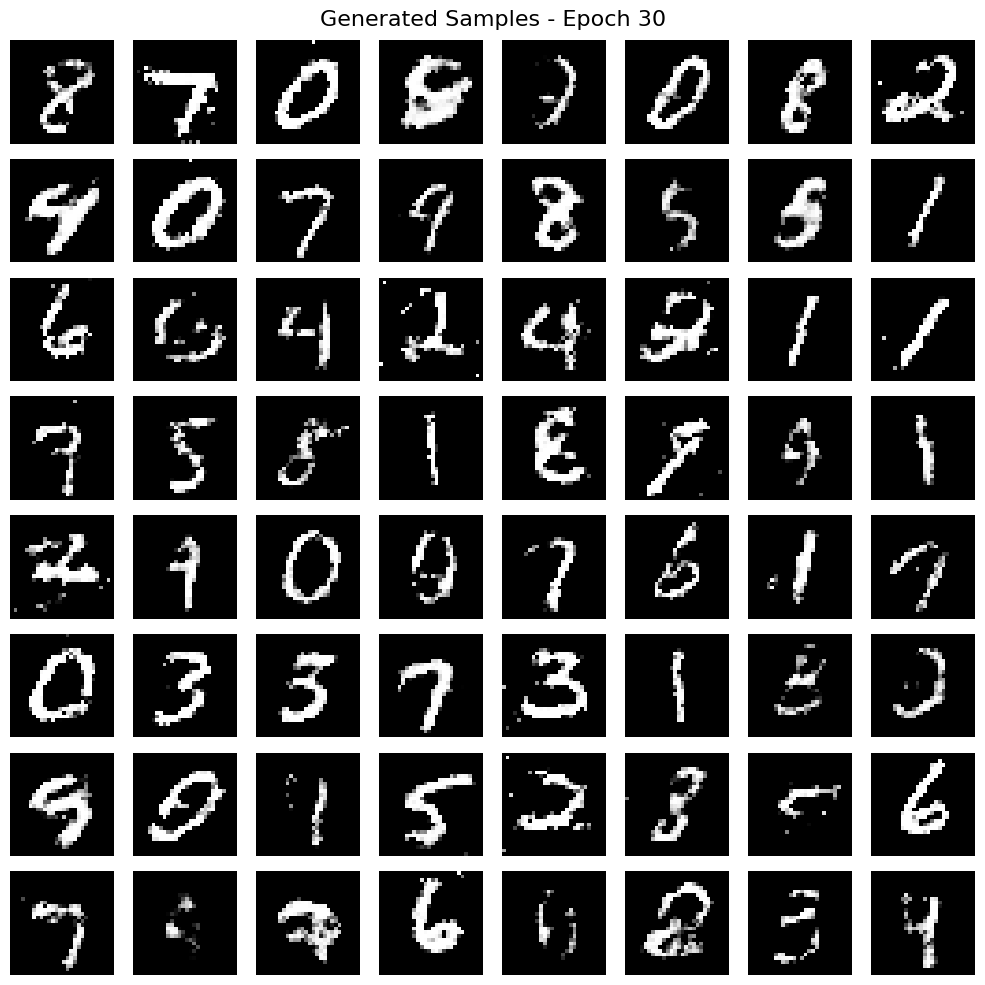

Epoch 31/50 | G_loss: 0.7327 | D_loss: 1.3658 | D(x): 0.511 | D(G(z)): 0.486
Epoch 32/50 | G_loss: 0.7348 | D_loss: 1.3654 | D(x): 0.512 | D(G(z)): 0.485
Epoch 33/50 | G_loss: 0.7341 | D_loss: 1.3673 | D(x): 0.511 | D(G(z)): 0.485
Epoch 34/50 | G_loss: 0.7328 | D_loss: 1.3680 | D(x): 0.510 | D(G(z)): 0.486
Epoch 35/50 | G_loss: 0.7310 | D_loss: 1.3668 | D(x): 0.511 | D(G(z)): 0.487


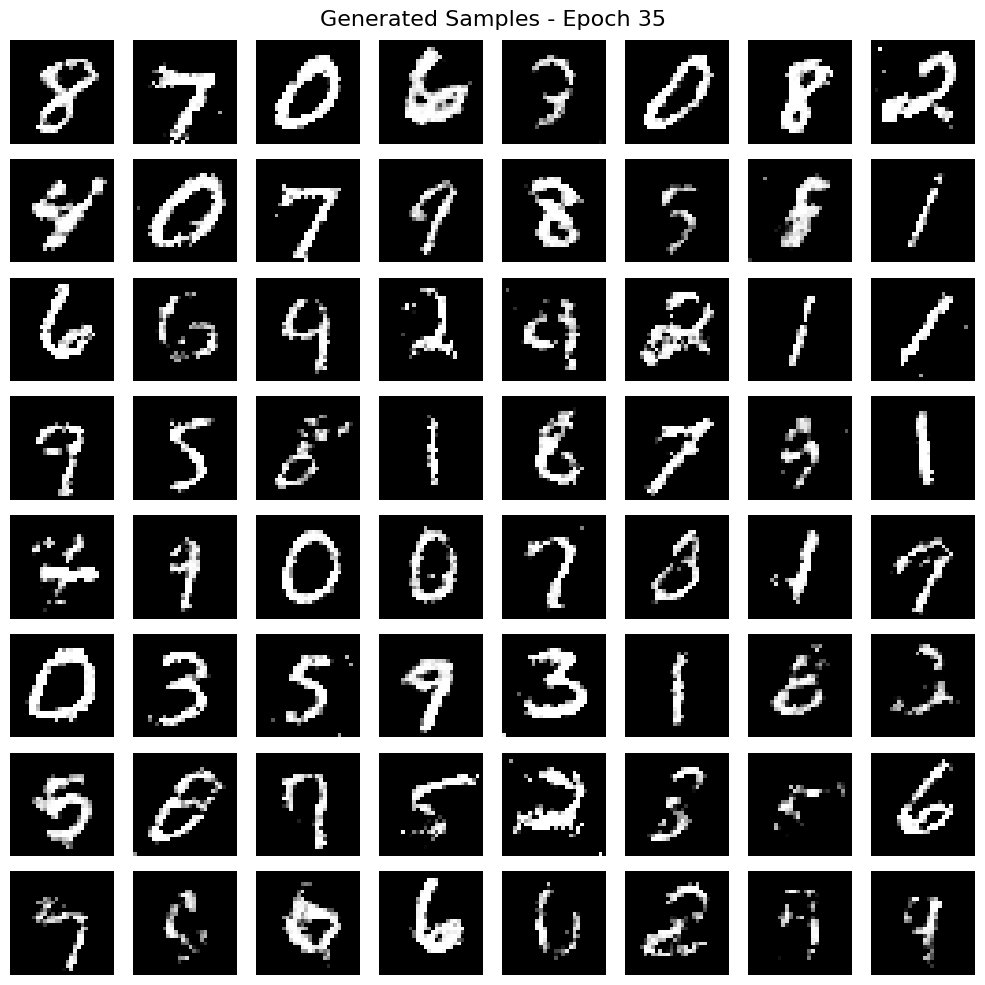

Epoch 36/50 | G_loss: 0.7305 | D_loss: 1.3686 | D(x): 0.510 | D(G(z)): 0.487
Epoch 37/50 | G_loss: 0.7331 | D_loss: 1.3678 | D(x): 0.511 | D(G(z)): 0.486
Epoch 38/50 | G_loss: 0.7310 | D_loss: 1.3668 | D(x): 0.511 | D(G(z)): 0.487
Epoch 39/50 | G_loss: 0.7308 | D_loss: 1.3673 | D(x): 0.511 | D(G(z)): 0.487
Epoch 40/50 | G_loss: 0.7306 | D_loss: 1.3670 | D(x): 0.511 | D(G(z)): 0.487


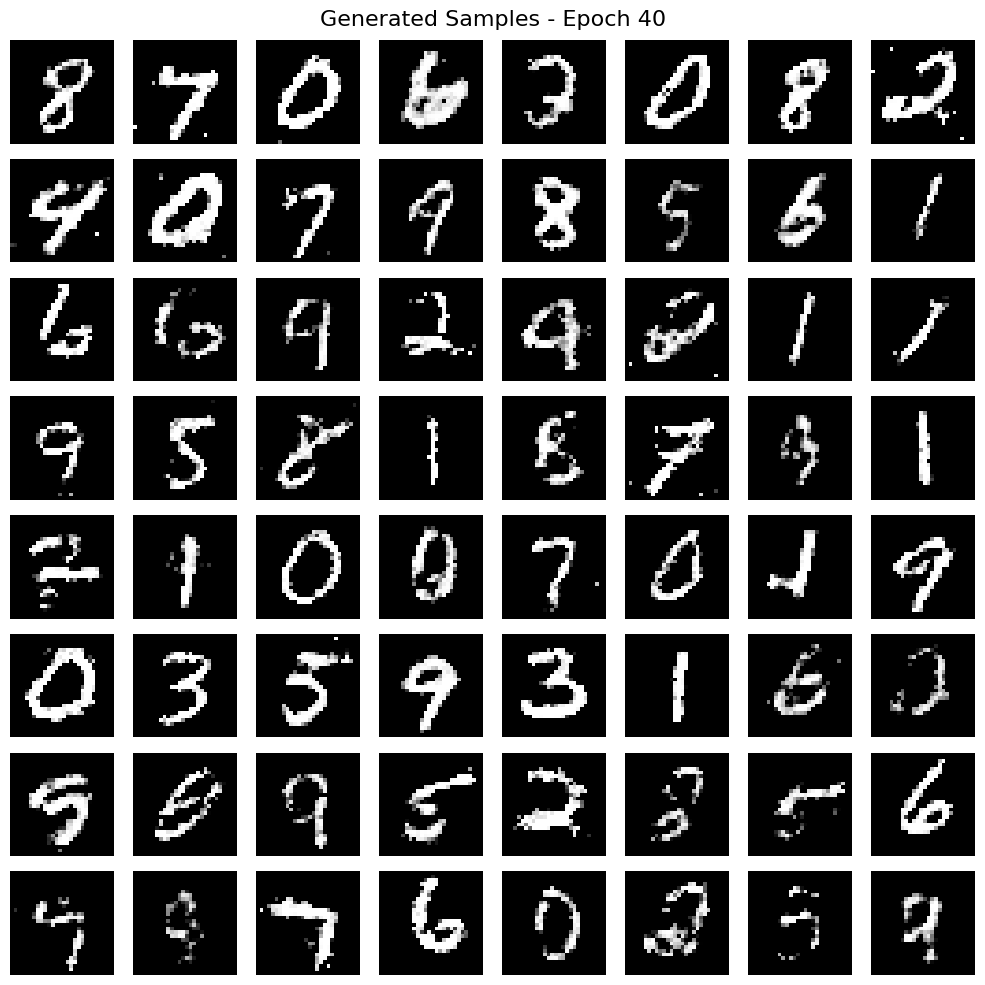

Epoch 41/50 | G_loss: 0.7307 | D_loss: 1.3682 | D(x): 0.510 | D(G(z)): 0.487
Epoch 42/50 | G_loss: 0.7307 | D_loss: 1.3687 | D(x): 0.510 | D(G(z)): 0.487
Epoch 43/50 | G_loss: 0.7295 | D_loss: 1.3684 | D(x): 0.510 | D(G(z)): 0.487
Epoch 44/50 | G_loss: 0.7306 | D_loss: 1.3681 | D(x): 0.510 | D(G(z)): 0.487
Epoch 45/50 | G_loss: 0.7273 | D_loss: 1.3688 | D(x): 0.510 | D(G(z)): 0.488


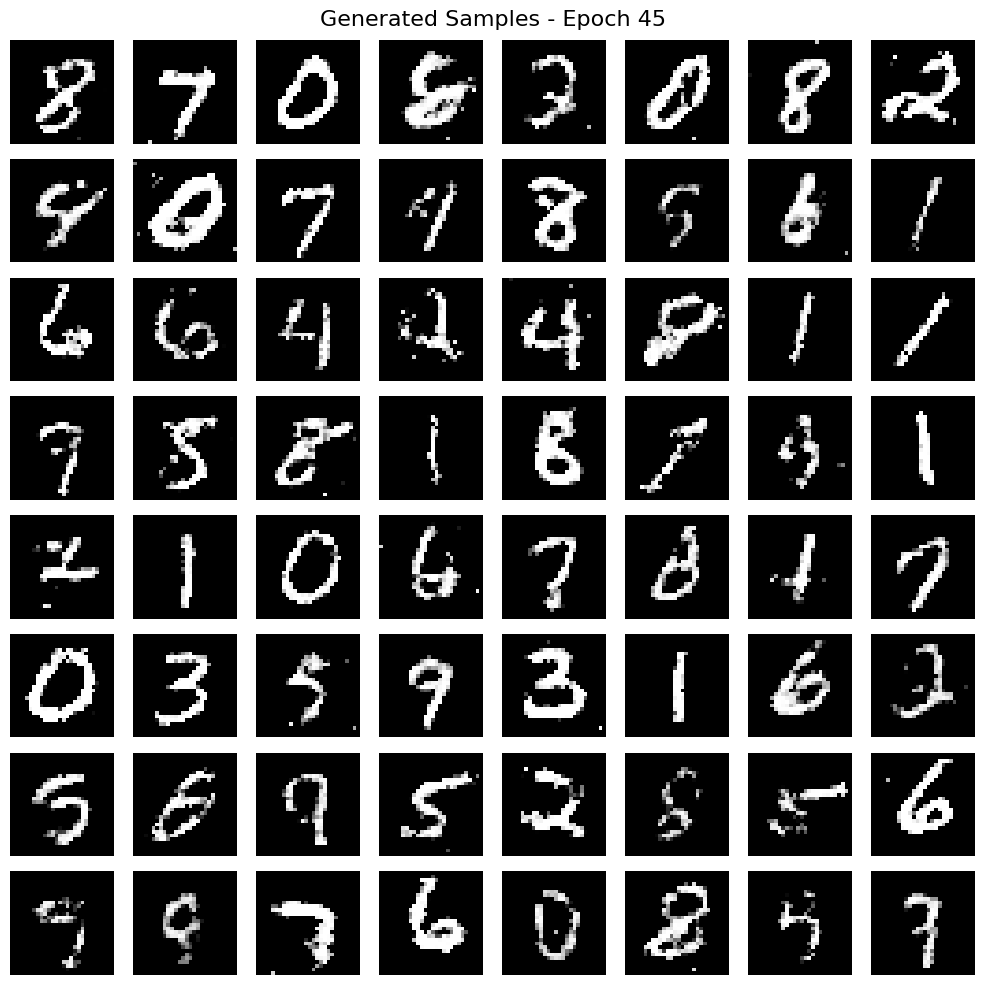

Epoch 46/50 | G_loss: 0.7304 | D_loss: 1.3674 | D(x): 0.510 | D(G(z)): 0.487
Epoch 47/50 | G_loss: 0.7271 | D_loss: 1.3699 | D(x): 0.509 | D(G(z)): 0.488
Epoch 48/50 | G_loss: 0.7290 | D_loss: 1.3690 | D(x): 0.510 | D(G(z)): 0.487
Epoch 49/50 | G_loss: 0.7281 | D_loss: 1.3690 | D(x): 0.510 | D(G(z)): 0.488
Epoch 50/50 | G_loss: 0.7308 | D_loss: 1.3683 | D(x): 0.510 | D(G(z)): 0.486


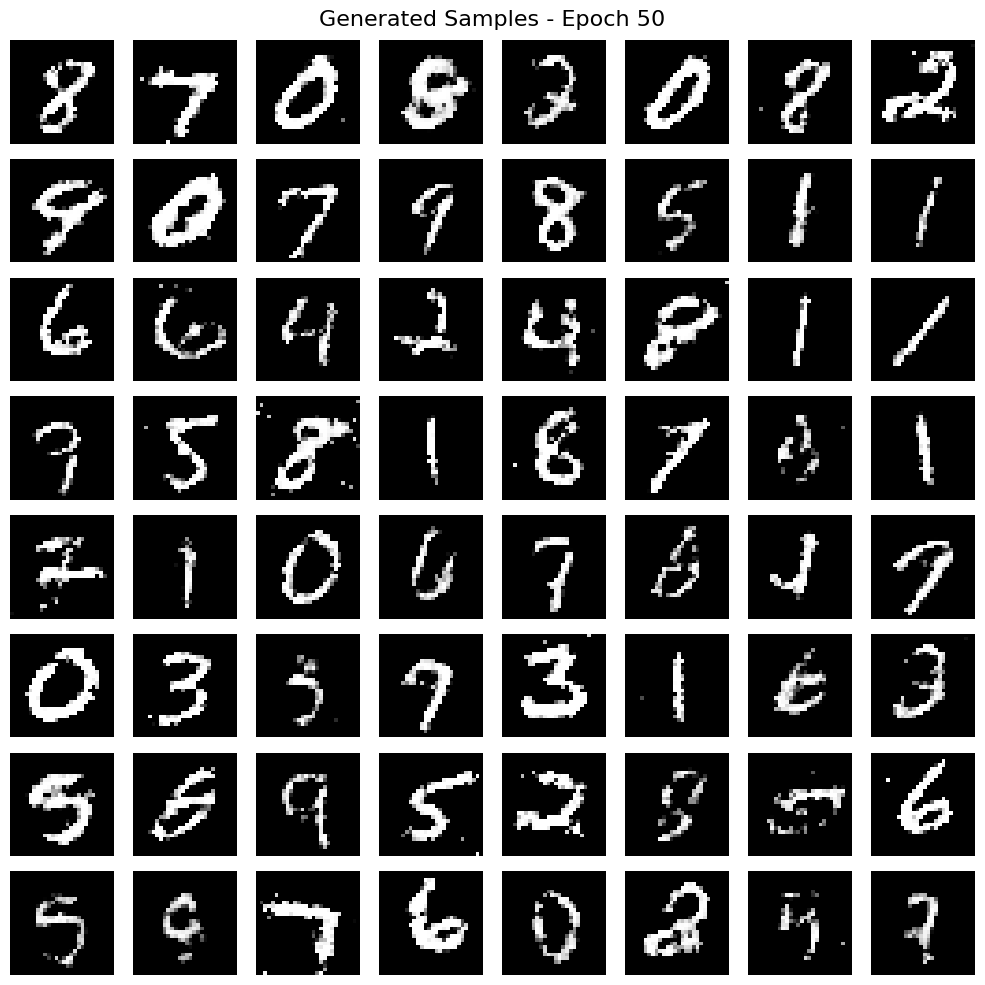


Training completed! Plotting results...



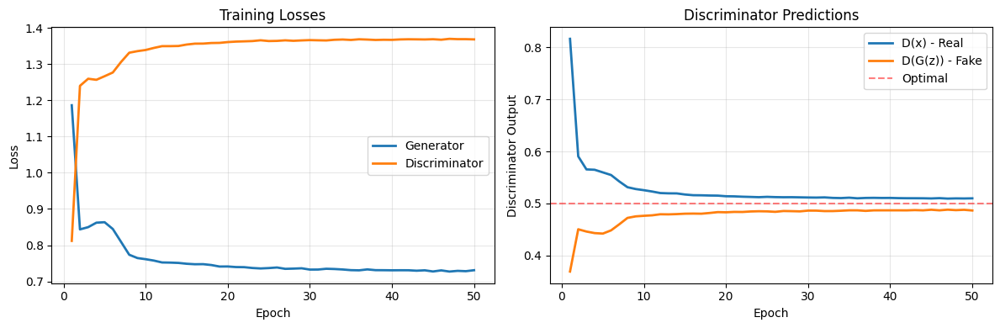


Validation Metrics:
  G_loss: 0.7525
  D_loss: 1.3664
  D(x): 0.486
  D(G(z)): 0.472

Analyzing mode collapse...
  Mean min distance: 10.5487
  Std min distance: 2.8040
  Mean pairwise distance: 20.2823

Visualizing sample diversity...



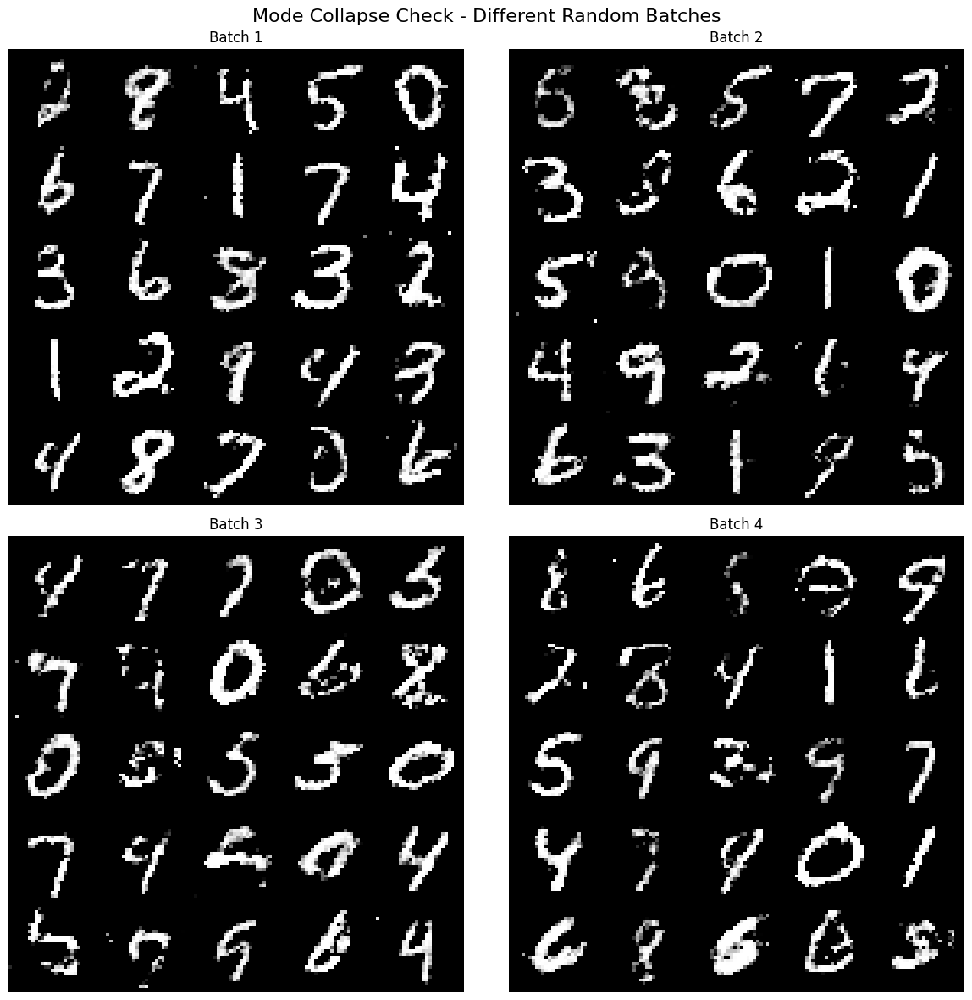

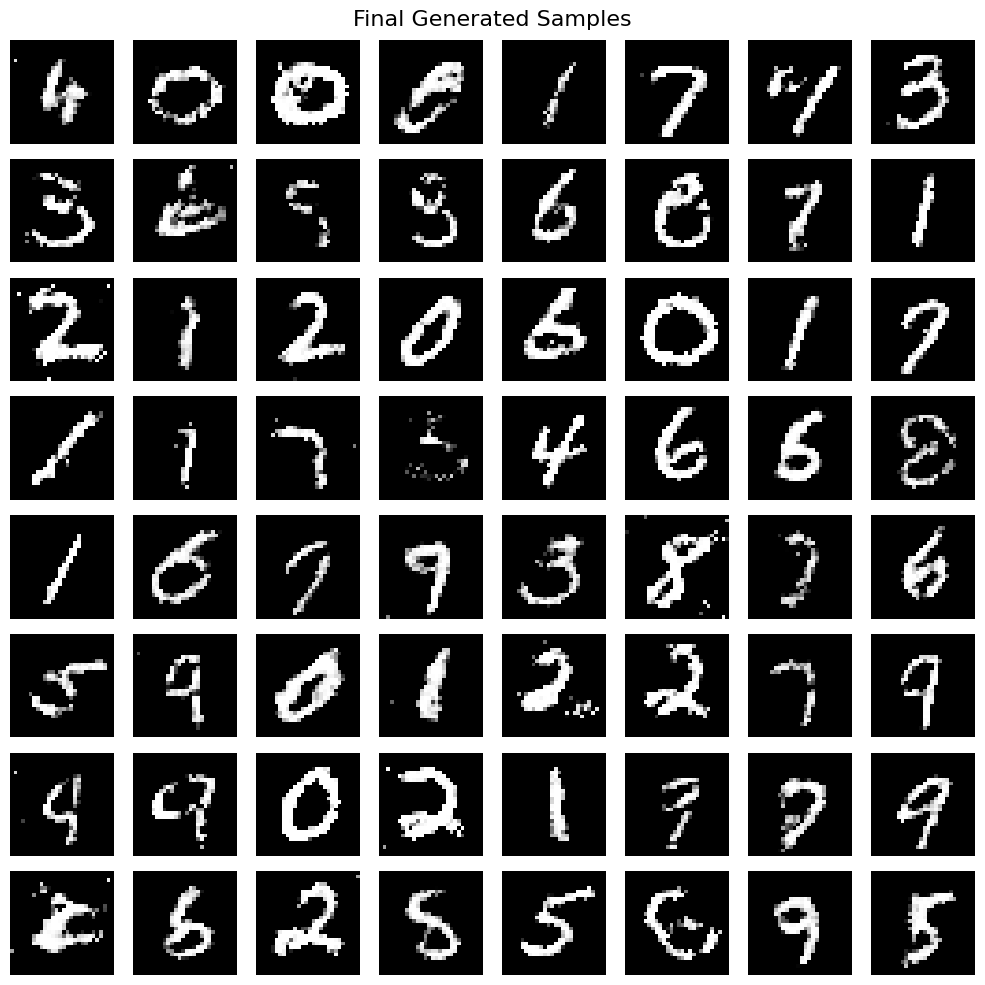


Vannila GAN Training - FASHION
----------------------------------------------------------------------


--- FASHION DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000

Generator parameters: 1,489,936
Discriminator parameters: 533,505

Starting training...

Epoch 1/50 | G_loss: 1.2601 | D_loss: 0.8806 | D(x): 0.765 | D(G(z)): 0.343


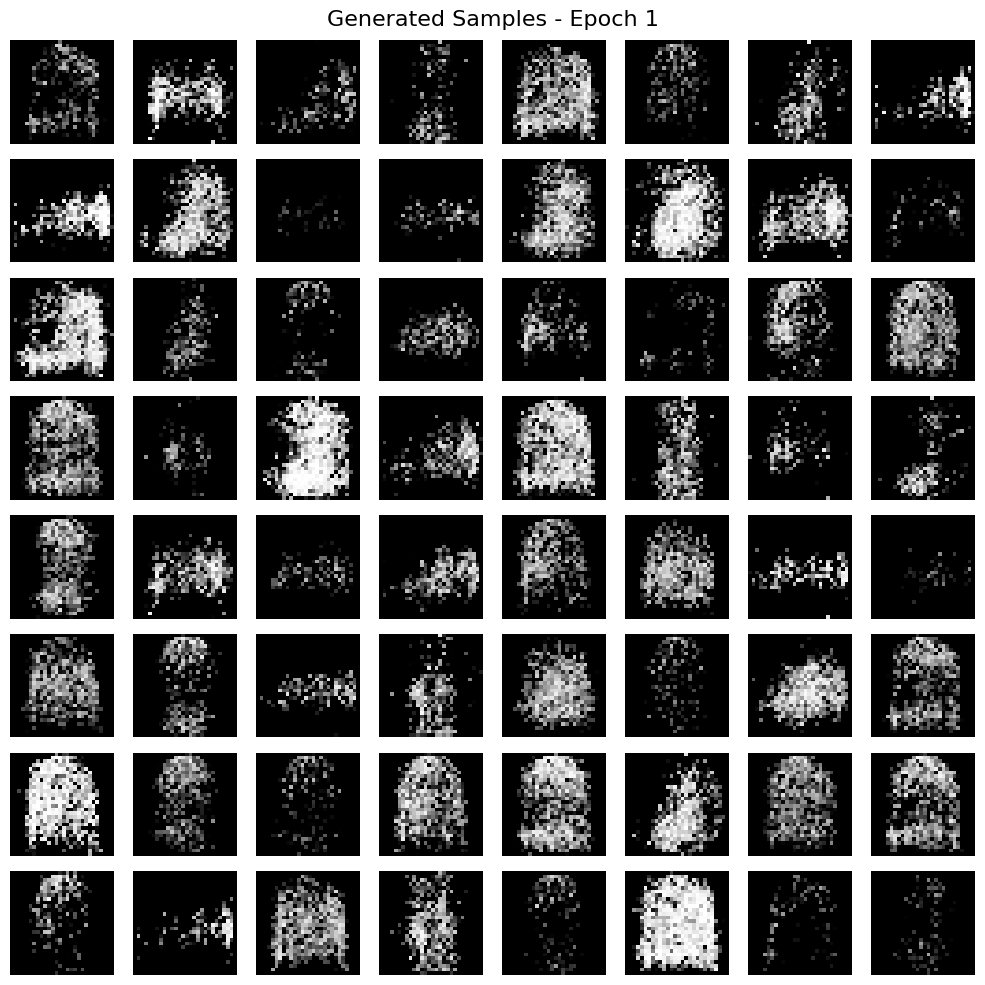

Epoch 2/50 | G_loss: 0.8779 | D_loss: 1.2546 | D(x): 0.577 | D(G(z)): 0.434
Epoch 3/50 | G_loss: 0.8124 | D_loss: 1.3060 | D(x): 0.547 | D(G(z)): 0.456
Epoch 4/50 | G_loss: 0.7959 | D_loss: 1.3239 | D(x): 0.535 | D(G(z)): 0.462
Epoch 5/50 | G_loss: 0.7804 | D_loss: 1.3373 | D(x): 0.528 | D(G(z)): 0.467


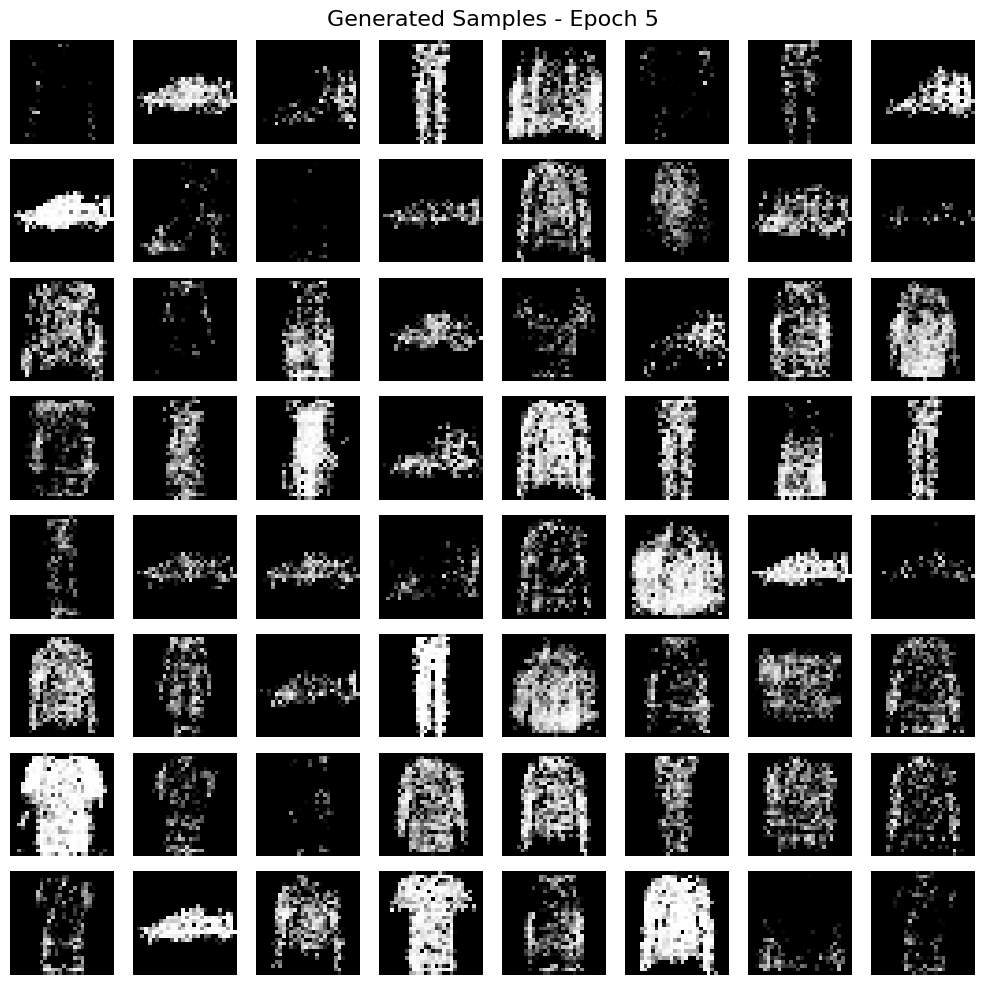

Epoch 6/50 | G_loss: 0.7760 | D_loss: 1.3454 | D(x): 0.523 | D(G(z)): 0.469
Epoch 7/50 | G_loss: 0.7734 | D_loss: 1.3533 | D(x): 0.520 | D(G(z)): 0.469
Epoch 8/50 | G_loss: 0.7680 | D_loss: 1.3554 | D(x): 0.517 | D(G(z)): 0.471
Epoch 9/50 | G_loss: 0.7700 | D_loss: 1.3595 | D(x): 0.515 | D(G(z)): 0.469
Epoch 10/50 | G_loss: 0.7669 | D_loss: 1.3622 | D(x): 0.513 | D(G(z)): 0.470


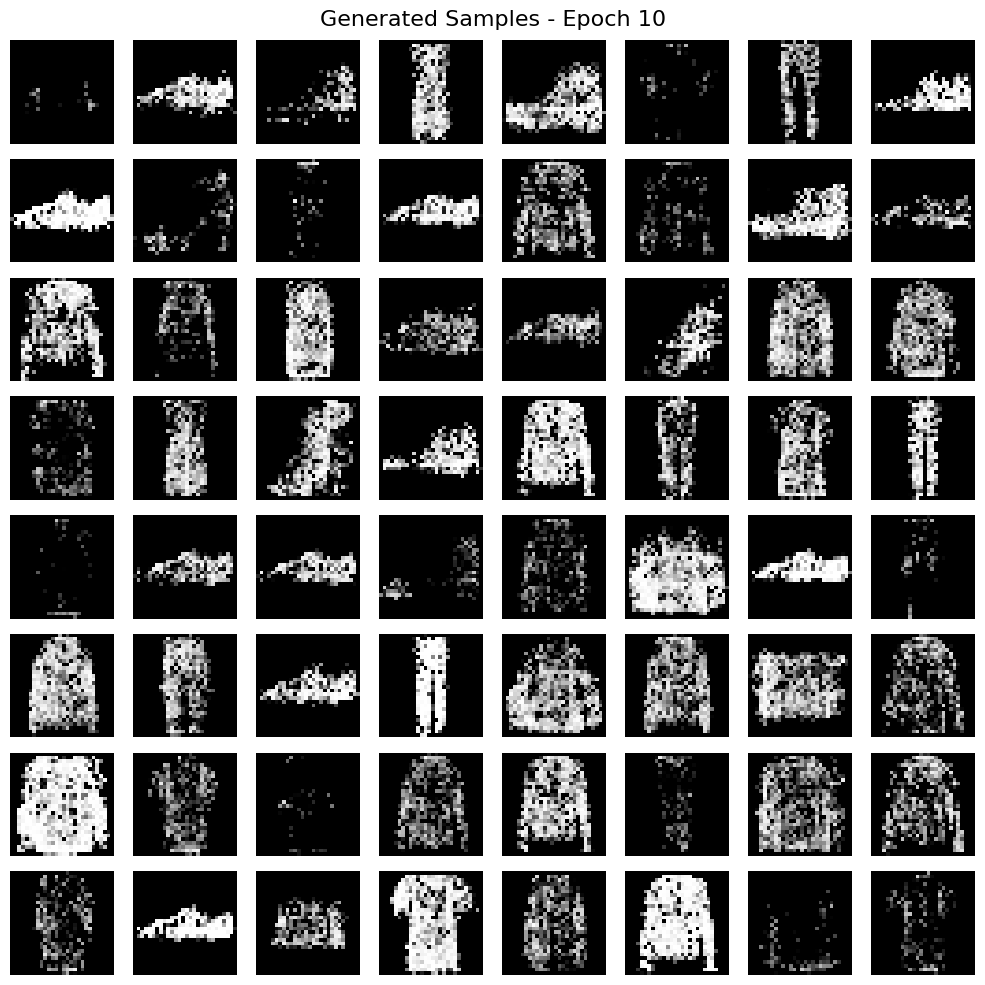

Epoch 11/50 | G_loss: 0.7611 | D_loss: 1.3664 | D(x): 0.511 | D(G(z)): 0.473
Epoch 12/50 | G_loss: 0.7546 | D_loss: 1.3673 | D(x): 0.511 | D(G(z)): 0.475
Epoch 13/50 | G_loss: 0.7524 | D_loss: 1.3687 | D(x): 0.510 | D(G(z)): 0.476
Epoch 14/50 | G_loss: 0.7557 | D_loss: 1.3673 | D(x): 0.511 | D(G(z)): 0.474
Epoch 15/50 | G_loss: 0.7558 | D_loss: 1.3688 | D(x): 0.510 | D(G(z)): 0.474


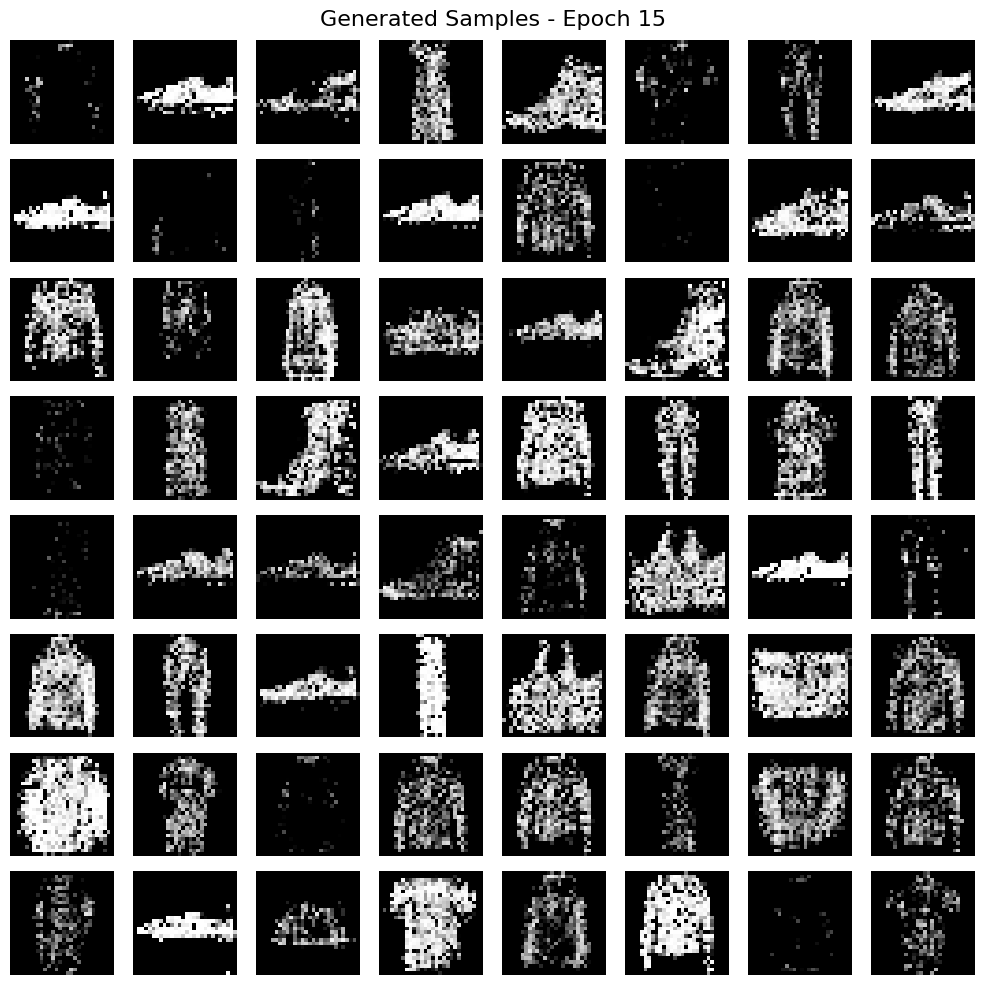

Epoch 16/50 | G_loss: 0.7468 | D_loss: 1.3724 | D(x): 0.509 | D(G(z)): 0.478
Epoch 17/50 | G_loss: 0.7388 | D_loss: 1.3752 | D(x): 0.507 | D(G(z)): 0.481
Epoch 18/50 | G_loss: 0.7287 | D_loss: 1.3790 | D(x): 0.505 | D(G(z)): 0.486
Epoch 19/50 | G_loss: 0.7217 | D_loss: 1.3792 | D(x): 0.505 | D(G(z)): 0.489
Epoch 20/50 | G_loss: 0.7210 | D_loss: 1.3796 | D(x): 0.504 | D(G(z)): 0.489


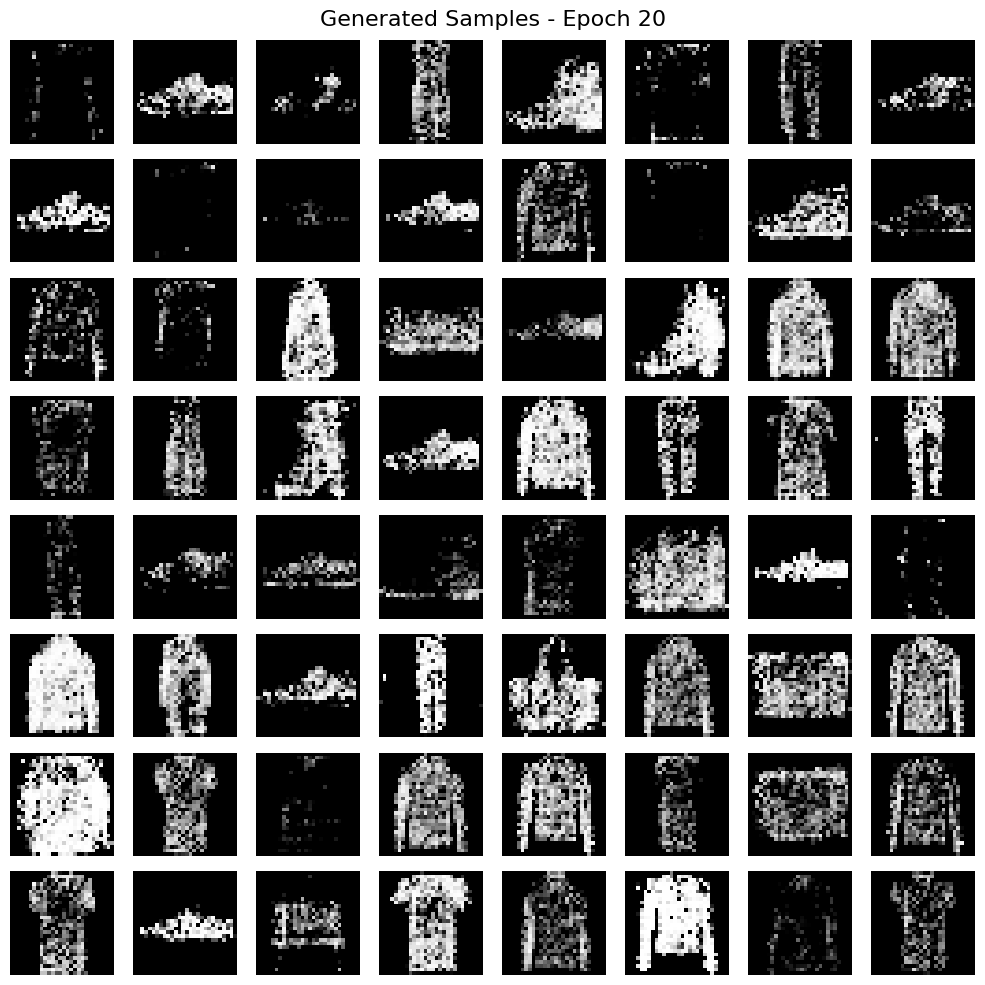

Epoch 21/50 | G_loss: 0.7241 | D_loss: 1.3796 | D(x): 0.504 | D(G(z)): 0.487
Epoch 22/50 | G_loss: 0.7262 | D_loss: 1.3789 | D(x): 0.504 | D(G(z)): 0.486
Epoch 23/50 | G_loss: 0.7271 | D_loss: 1.3783 | D(x): 0.505 | D(G(z)): 0.486
Epoch 24/50 | G_loss: 0.7242 | D_loss: 1.3795 | D(x): 0.504 | D(G(z)): 0.487
Epoch 25/50 | G_loss: 0.7257 | D_loss: 1.3789 | D(x): 0.504 | D(G(z)): 0.486


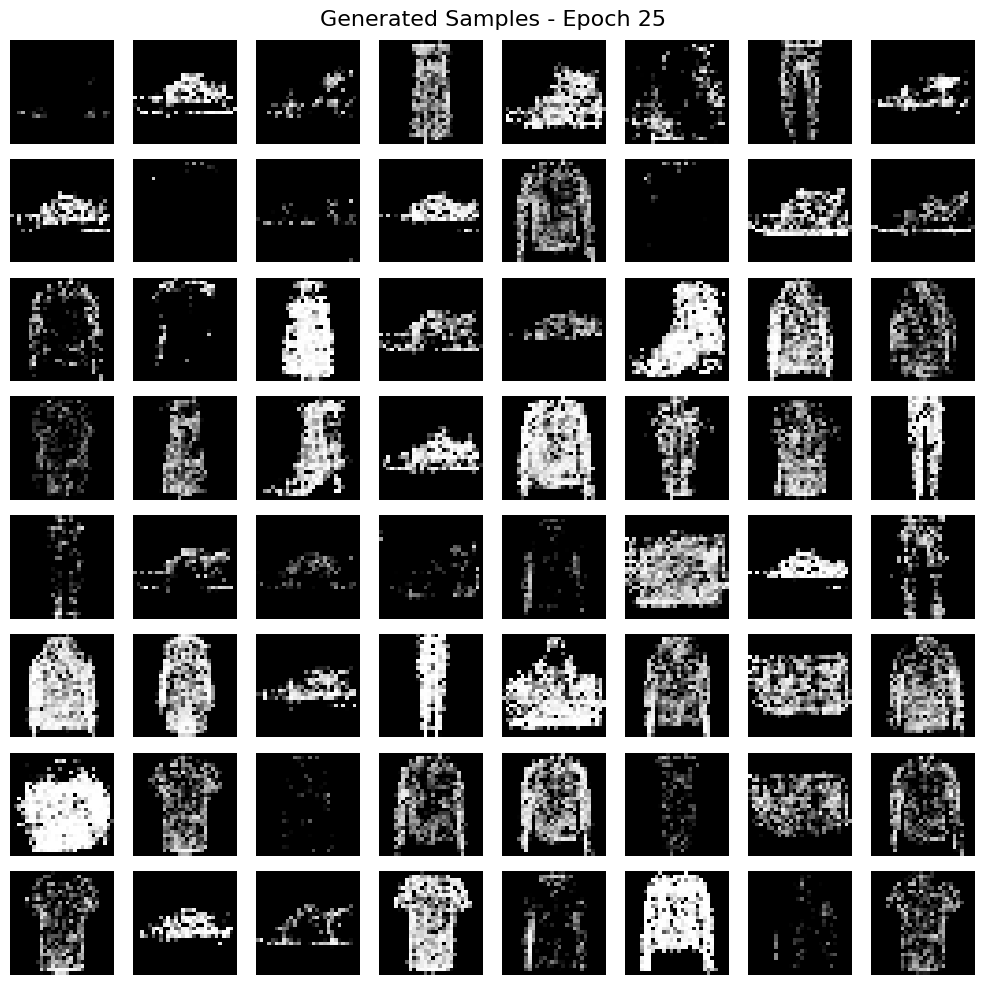

Epoch 26/50 | G_loss: 0.7209 | D_loss: 1.3815 | D(x): 0.504 | D(G(z)): 0.488
Epoch 27/50 | G_loss: 0.7194 | D_loss: 1.3801 | D(x): 0.504 | D(G(z)): 0.489
Epoch 28/50 | G_loss: 0.7206 | D_loss: 1.3802 | D(x): 0.504 | D(G(z)): 0.488
Epoch 29/50 | G_loss: 0.7190 | D_loss: 1.3801 | D(x): 0.504 | D(G(z)): 0.489
Epoch 30/50 | G_loss: 0.7173 | D_loss: 1.3817 | D(x): 0.503 | D(G(z)): 0.490


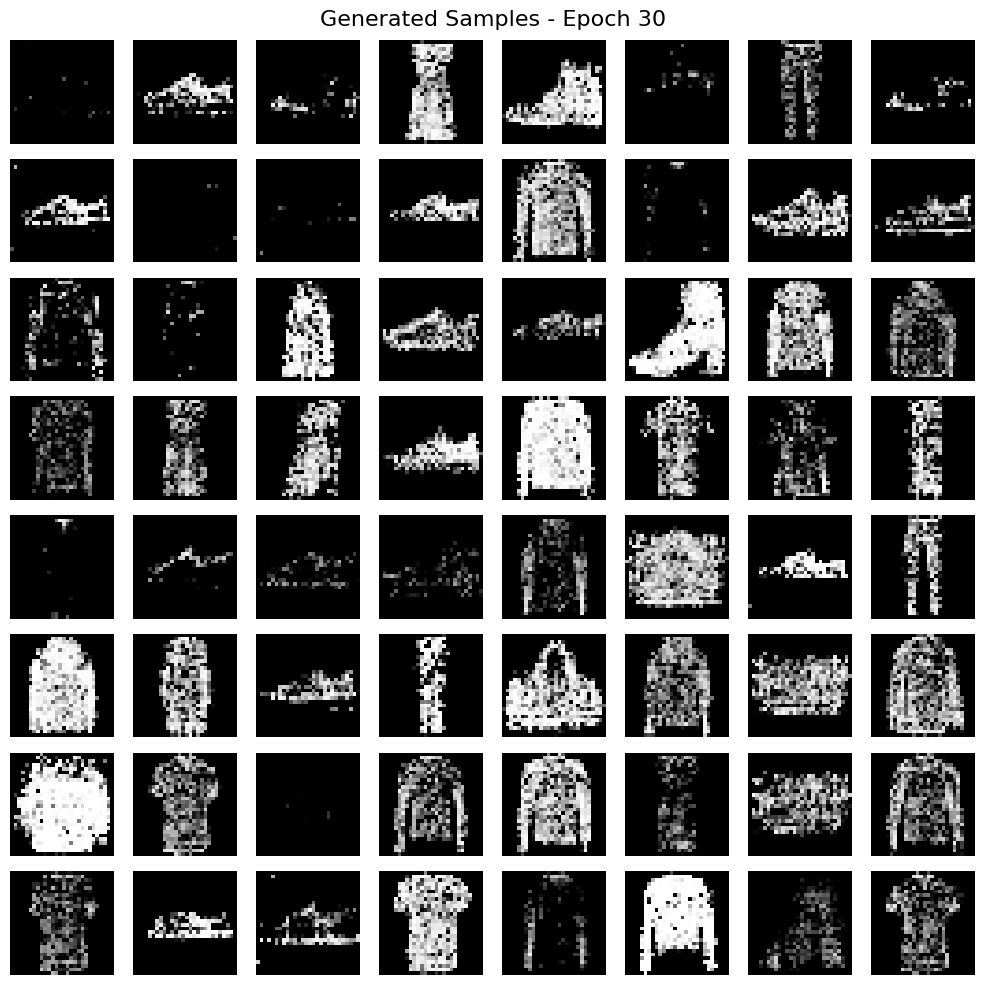

Epoch 31/50 | G_loss: 0.7140 | D_loss: 1.3822 | D(x): 0.503 | D(G(z)): 0.491
Epoch 32/50 | G_loss: 0.7141 | D_loss: 1.3823 | D(x): 0.503 | D(G(z)): 0.491
Epoch 33/50 | G_loss: 0.7121 | D_loss: 1.3818 | D(x): 0.503 | D(G(z)): 0.492
Epoch 34/50 | G_loss: 0.7137 | D_loss: 1.3820 | D(x): 0.503 | D(G(z)): 0.491
Epoch 35/50 | G_loss: 0.7119 | D_loss: 1.3823 | D(x): 0.503 | D(G(z)): 0.492


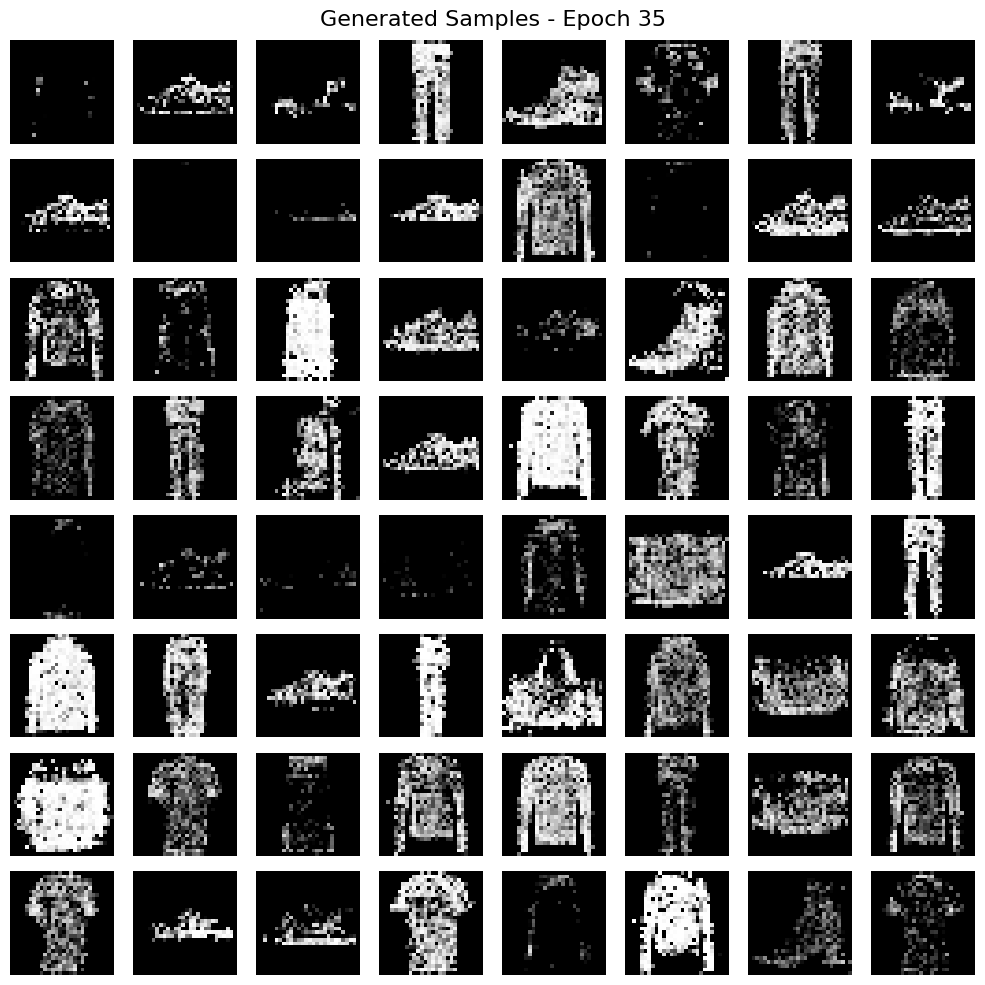

Epoch 36/50 | G_loss: 0.7145 | D_loss: 1.3816 | D(x): 0.503 | D(G(z)): 0.491
Epoch 37/50 | G_loss: 0.7156 | D_loss: 1.3807 | D(x): 0.503 | D(G(z)): 0.490
Epoch 38/50 | G_loss: 0.7137 | D_loss: 1.3814 | D(x): 0.503 | D(G(z)): 0.491
Epoch 39/50 | G_loss: 0.7126 | D_loss: 1.3815 | D(x): 0.503 | D(G(z)): 0.492
Epoch 40/50 | G_loss: 0.7140 | D_loss: 1.3822 | D(x): 0.502 | D(G(z)): 0.491


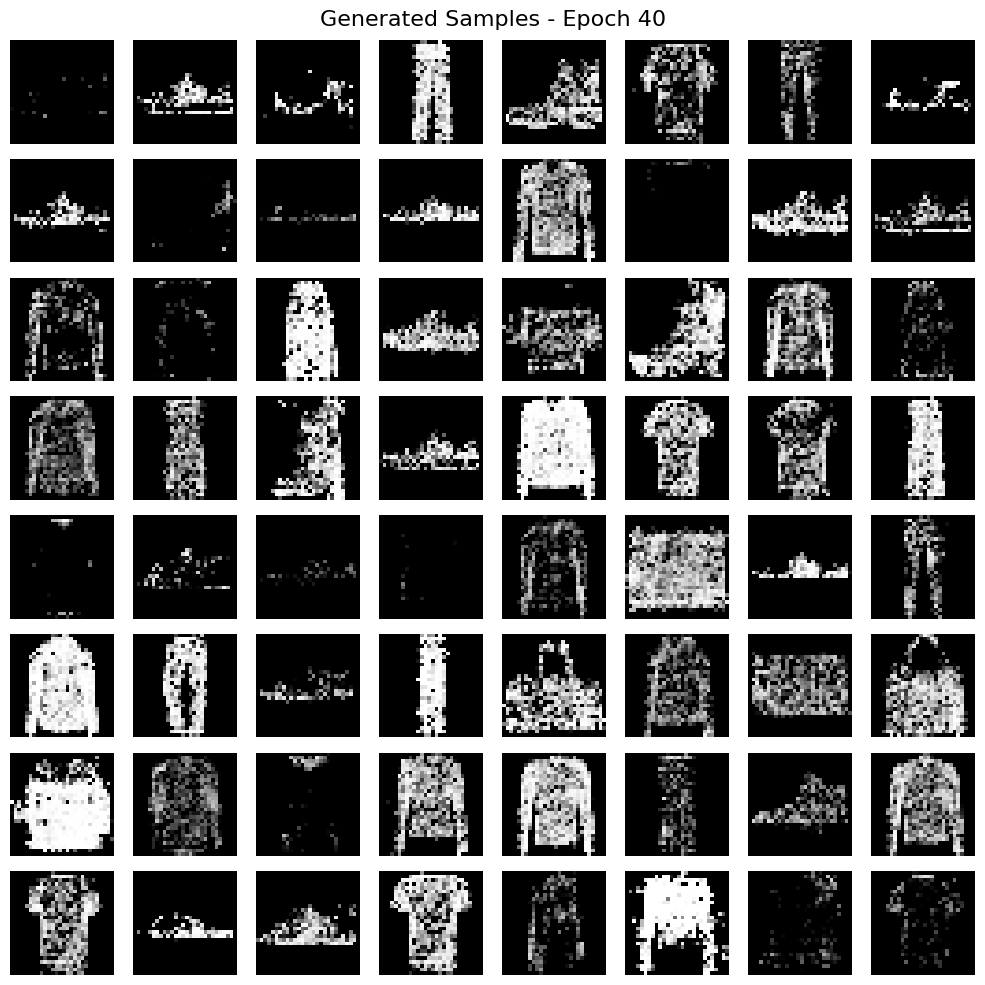

Epoch 41/50 | G_loss: 0.7100 | D_loss: 1.3814 | D(x): 0.503 | D(G(z)): 0.493
Epoch 42/50 | G_loss: 0.7120 | D_loss: 1.3823 | D(x): 0.503 | D(G(z)): 0.492
Epoch 43/50 | G_loss: 0.7112 | D_loss: 1.3819 | D(x): 0.503 | D(G(z)): 0.492
Epoch 44/50 | G_loss: 0.7129 | D_loss: 1.3809 | D(x): 0.503 | D(G(z)): 0.492
Epoch 45/50 | G_loss: 0.7113 | D_loss: 1.3828 | D(x): 0.502 | D(G(z)): 0.492


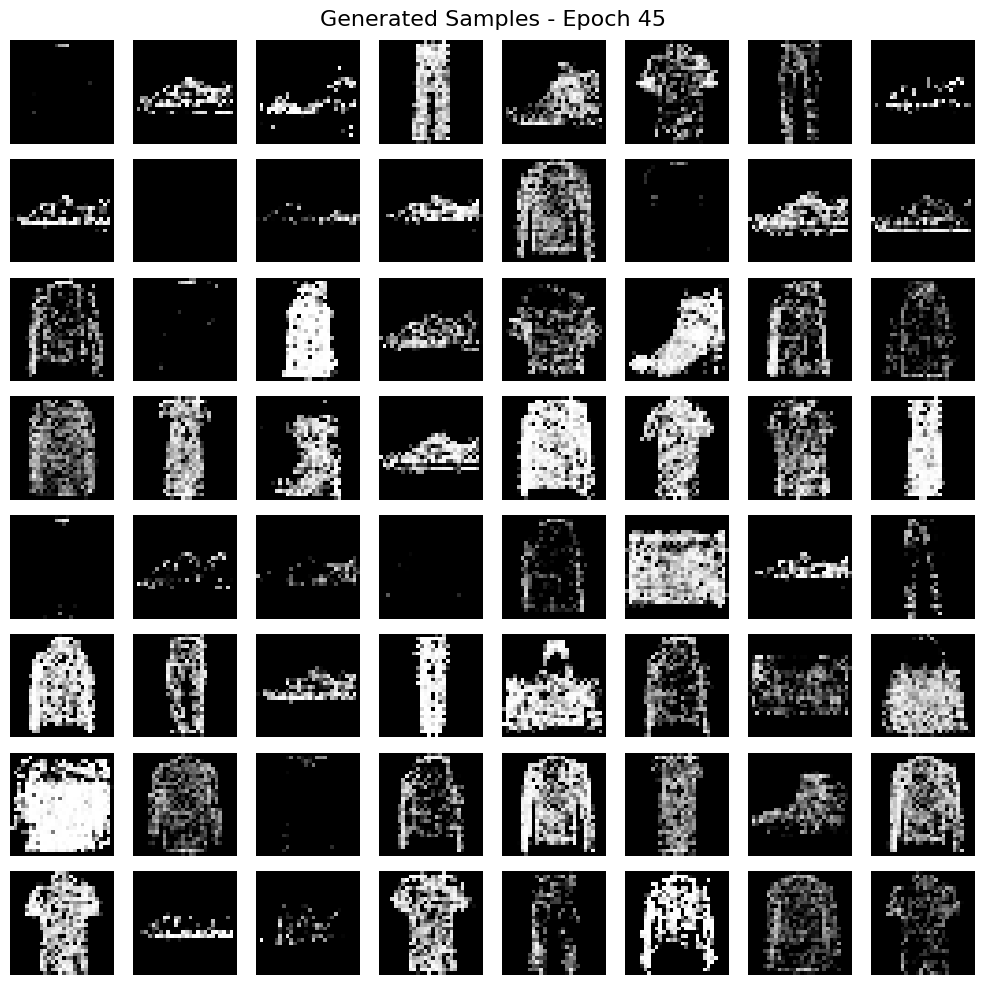

Epoch 46/50 | G_loss: 0.7101 | D_loss: 1.3818 | D(x): 0.503 | D(G(z)): 0.493
Epoch 47/50 | G_loss: 0.7135 | D_loss: 1.3812 | D(x): 0.502 | D(G(z)): 0.491
Epoch 48/50 | G_loss: 0.7117 | D_loss: 1.3821 | D(x): 0.502 | D(G(z)): 0.492
Epoch 49/50 | G_loss: 0.7112 | D_loss: 1.3817 | D(x): 0.503 | D(G(z)): 0.492
Epoch 50/50 | G_loss: 0.7097 | D_loss: 1.3817 | D(x): 0.503 | D(G(z)): 0.493


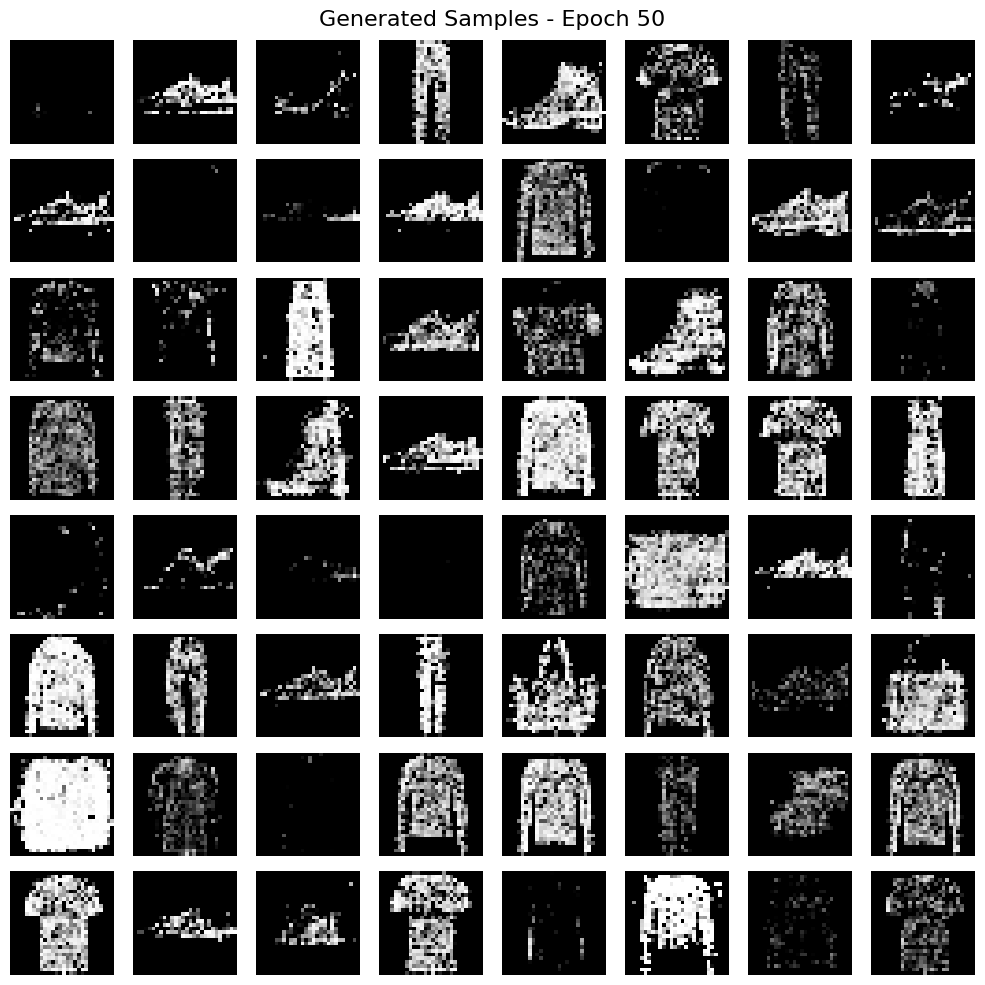


Training completed! Plotting results...



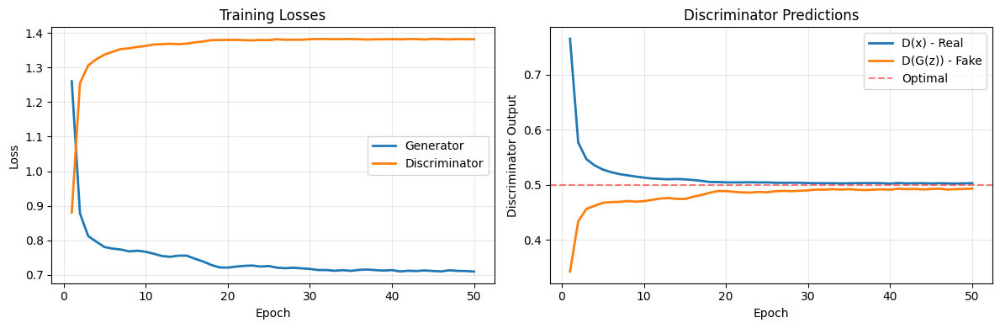


Validation Metrics:
  G_loss: 0.7085
  D_loss: 1.3847
  D(x): 0.496
  D(G(z)): 0.493

Analyzing mode collapse...
  Mean min distance: 6.5549
  Std min distance: 2.2110
  Mean pairwise distance: 22.4353

Visualizing sample diversity...



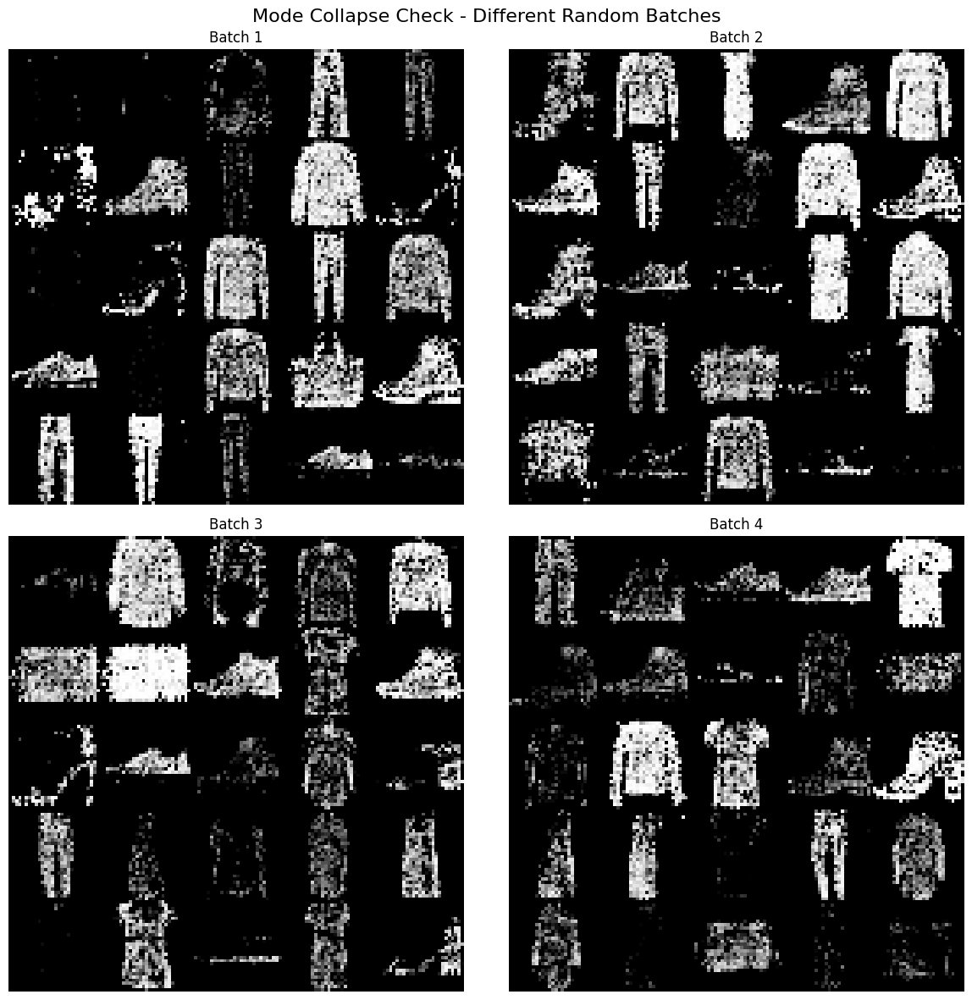

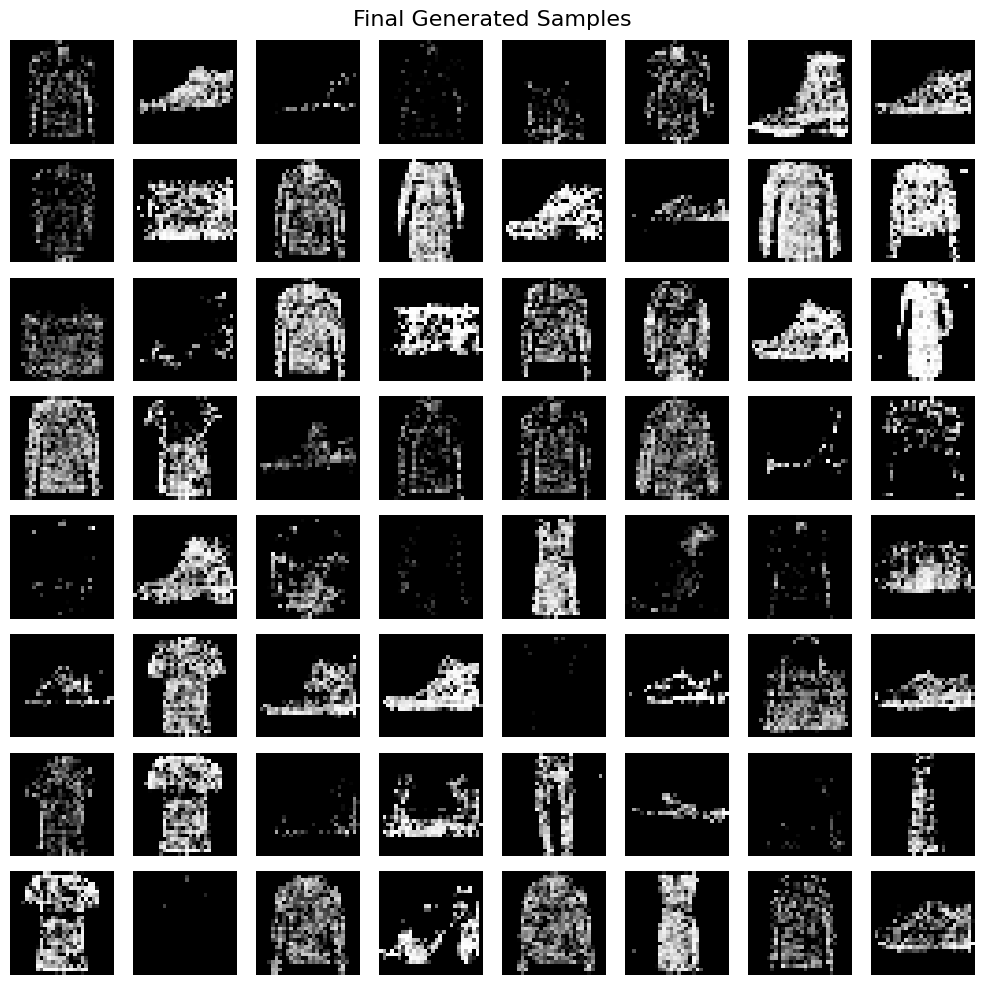

In [44]:
# MNIST
generator_mnist, discriminator_mnist, history_mnist = run_vanilla_gan_experiment(
    dataset_name="mnist",
    latent_dim=100,
    n_epochs=50,
    batch_size=128,
    lr_g=2e-4,
    lr_d=2e-4,
    device="cuda",
    sample_interval=5)

# Fashion-MNIST
generator_fashion, discriminator_fashion, history_fashion = run_vanilla_gan_experiment(
    dataset_name="fashion",
    latent_dim=100,
    n_epochs=50,
    batch_size=128,
    lr_g=2e-4,
    lr_d=2e-4,
    device="cuda",
    sample_interval=5)

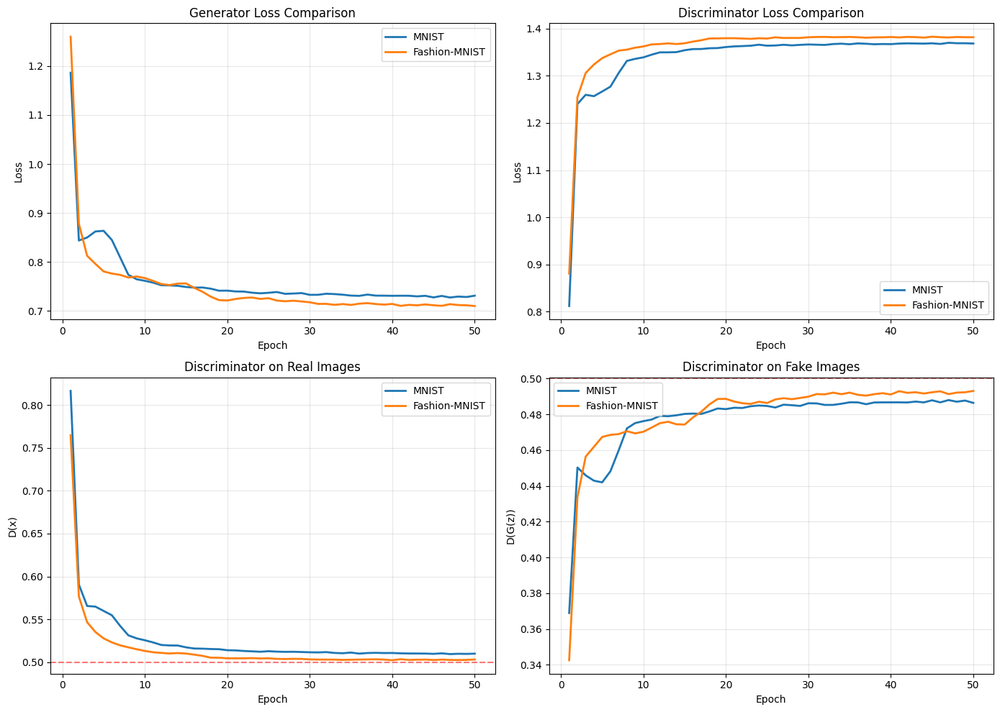

In [45]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

epochs_mnist = range(1, len(history_mnist["g_loss"]) + 1)
epochs_fashion = range(1, len(history_fashion["g_loss"]) + 1)

# generator loss
axes[0, 0].plot(epochs_mnist, history_mnist["g_loss"], label="MNIST", linewidth=2)
axes[0, 0].plot(epochs_fashion, history_fashion["g_loss"], label="Fashion-MNIST", linewidth=2)
axes[0, 0].set_xlabel("Epoch")
axes[0, 0].set_ylabel("Loss")
axes[0, 0].set_title("Generator Loss Comparison")
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# discriminator loss
axes[0, 1].plot(epochs_mnist, history_mnist["d_loss"], label="MNIST", linewidth=2)
axes[0, 1].plot(epochs_fashion, history_fashion["d_loss"], label="Fashion-MNIST", linewidth=2)
axes[0, 1].set_xlabel("Epoch")
axes[0, 1].set_ylabel("Loss")
axes[0, 1].set_title("Discriminator Loss Comparison")
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# D(x) - real
axes[1, 0].plot(epochs_mnist, history_mnist["d_real"], label="MNIST", linewidth=2)
axes[1, 0].plot(epochs_fashion, history_fashion["d_real"], label="Fashion-MNIST", linewidth=2)
axes[1, 0].axhline(0.5, color="red", linestyle="--", alpha=0.5)
axes[1, 0].set_xlabel("Epoch")
axes[1, 0].set_ylabel("D(x)")
axes[1, 0].set_title("Discriminator on Real Images")
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)

# D(G(z)) - fake
axes[1, 1].plot(epochs_mnist, history_mnist["d_fake"], label="MNIST", linewidth=2)
axes[1, 1].plot(epochs_fashion, history_fashion["d_fake"], label="Fashion-MNIST", linewidth=2)
axes[1, 1].axhline(0.5, color="red", linestyle="--", alpha=0.5)
axes[1, 1].set_xlabel("Epoch")
axes[1, 1].set_ylabel("D(G(z))")
axes[1, 1].set_title("Discriminator on Fake Images")
axes[1, 1].legend()
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Conditional and Advanced GAN Variants

## Conditional GAN Architecture

In [19]:
class ConditionalGenerator(Generator):
  def __init__(self, latent_dim: int = 100, n_classes: int = 10, img_shape: Tuple[int, int, int] = (1, 28, 28)):
    super().__init__(latent_dim, img_shape)
    self.n_classes = n_classes
    self.label_emb = nn.Embedding(n_classes, n_classes)

    img_size = img_shape[1] * img_shape[2] * img_shape[0]

    self.model = nn.Sequential(
        nn.Linear(latent_dim + n_classes, 256),
        nn.LeakyReLU(0.2),
        nn.BatchNorm1d(256),

        nn.Linear(256, 512),
        nn.LeakyReLU(0.2),
        nn.BatchNorm1d(512),

        nn.Linear(512, 1024),
        nn.LeakyReLU(0.2),
        nn.BatchNorm1d(1024),

        nn.Linear(1024, img_size),
        nn.Tanh())

  def forward(self, z: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
    label_input = self.label_emb(labels)
    gen_input = torch.cat([z, label_input], dim=1)
    img = self.model(gen_input)
    return img.view(img.size(0), *self.img_shape)


class ConditionalDiscriminator(Discriminator):
  def __init__(self, n_classes: int = 10, img_shape: Tuple[int, int, int] = (1, 28, 28)):
    super().__init__(img_shape)
    self.n_classes = n_classes
    self.label_emb = nn.Embedding(n_classes, n_classes)

    img_size = img_shape[1] * img_shape[2] * img_shape[0]

    self.model = nn.Sequential(
        nn.Linear(img_size + n_classes, 512),
        nn.LeakyReLU(0.2),
        nn.Dropout(0.3),

        nn.Linear(512, 256),
        nn.LeakyReLU(0.2),
        nn.Dropout(0.3),

        nn.Linear(256, 1),
        nn.Sigmoid())

  def forward(self, img: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
    img_flat = img.view(img.size(0), -1)
    label_input = self.label_emb(labels)
    d_input = torch.cat([img_flat, label_input], dim=1)
    return self.model(d_input)

## PatchGAN Discriminator

In [20]:
class PatchGANDiscriminator(Discriminator):
  def __init__(self, n_classes: int = 10, img_shape: Tuple[int, int, int] = (1, 28, 28)):
    super().__init__(img_shape)
    self.n_classes = n_classes

    # label embedding to channel
    self.label_emb = nn.Embedding(n_classes, img_shape[1] * img_shape[2])

    # discriminator outputs patch predictions
    self.model = nn.Sequential(
        # (2, 28, 28) image + label channel
        nn.Conv2d(img_shape[0] + 1, 64, kernel_size=4, stride=2, padding=1),
        nn.LeakyReLU(0.2),

        # (64, 14, 14)
        nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2),

        # (128, 7, 7)
        nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2),

        # (256, 3, 3) patch predictions
        nn.Conv2d(256, 1, kernel_size=3, stride=1, padding=1),
        nn.Sigmoid())

  def forward(self, img: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
    # create label channel
    label_emb = self.label_emb(labels)
    label_channel = label_emb.view(img.size(0), 1, self.img_shape[1], self.img_shape[2])

    d_input = torch.cat([img, label_channel], dim=1)

    # get patch predictions and average
    patches = self.model(d_input)
    return patches.view(patches.size(0), -1).mean(dim=1, keepdim=True)

## Feature Matching Discriminator

In [21]:
class FeatureMatchingDiscriminator(Discriminator):
  def __init__(self, n_classes: int = 10, img_shape: Tuple[int, int, int] = (1, 28, 28)):
    super().__init__(img_shape)
    self.n_classes = n_classes
    self.label_emb = nn.Embedding(n_classes, n_classes)

    img_size = img_shape[1] * img_shape[2] * img_shape[0]

    # feature extraction layers
    self.layer1 = nn.Sequential(
        nn.Linear(img_size + n_classes, 512),
        nn.LeakyReLU(0.2),
        nn.Dropout(0.3))

    self.layer2 = nn.Sequential(
        nn.Linear(512, 256),
        nn.LeakyReLU(0.2),
        nn.Dropout(0.3))

    self.output = nn.Sequential(
        nn.Linear(256, 1),
        nn.Sigmoid())

  def forward(self, img: torch.Tensor, labels: torch.Tensor, return_features: bool = False):
    img_flat = img.view(img.size(0), -1)
    label_input = self.label_emb(labels)
    d_input = torch.cat([img_flat, label_input], dim=1)

    feat1 = self.layer1(d_input)
    feat2 = self.layer2(feat1)
    out = self.output(feat2)

    if return_features:
      return out, feat2
    return out

## Helpers

### Training

In [22]:
def conditional_train_step(generator: nn.Module, discriminator: nn.Module, real_imgs: torch.Tensor, labels: torch.Tensor,
                           g_optimizer: optim.Optimizer, d_optimizer: optim.Optimizer, device: str = "cuda",
                           use_feature_matching: bool = False) -> Dict[str, float]:
  batch_size = real_imgs.size(0)
  real_imgs = real_imgs.to(device)
  labels = labels.to(device)

  # discriminator
  discriminator.zero_grad()

  if use_feature_matching:
    real_preds, _ = discriminator(real_imgs, labels, return_features=True)
  else:
    real_preds = discriminator(real_imgs, labels)

  noise = generator.sample_noise(batch_size, device)
  fake_imgs = generator(noise, labels).detach()

  if use_feature_matching:
    fake_preds, _ = discriminator(fake_imgs, labels, return_features=True)
  else:
    fake_preds = discriminator(fake_imgs, labels)

  d_loss = discriminator_loss(real_preds, fake_preds)
  d_loss.backward()
  d_optimizer.step()

  # generator
  generator.zero_grad()

  noise = generator.sample_noise(batch_size, device)
  fake_imgs = generator(noise, labels)

  if use_feature_matching:
    fake_preds, fake_features = discriminator(fake_imgs, labels, return_features=True)
    with torch.no_grad():
      _, real_features = discriminator(real_imgs, labels, return_features=True)

    # feature matching loss
    fm_loss = nn.L1Loss()(fake_features, real_features)
    g_loss = generator_loss(fake_preds) + fm_loss
  else:
    fake_preds = discriminator(fake_imgs, labels)
    g_loss = generator_loss(fake_preds)

  g_loss.backward()
  g_optimizer.step()

  return {
      "g_loss": g_loss.item(),
      "d_loss": d_loss.item(),
      "d_real": real_preds.mean().item(),
      "d_fake": fake_preds.mean().item()}


def train_conditional_gan(generator: nn.Module, discriminator: nn.Module, train_loader: torch.utils.data.DataLoader,
                          val_loader: torch.utils.data.DataLoader, n_epochs: int, lr_g: float = 2e-4, lr_d: float = 2e-4,
                          device: str = "cuda", use_feature_matching: bool = False, sample_interval: int = 10) -> Dict[str, List[float]]:
  generator = generator.to(device)
  discriminator = discriminator.to(device)

  g_optimizer = optim.Adam(generator.parameters(), lr=lr_g, betas=(0.5, 0.999))
  d_optimizer = optim.Adam(discriminator.parameters(), lr=lr_d, betas=(0.5, 0.999))

  history = {"g_loss": [], "d_loss": [], "d_real": [], "d_fake": []}

  for epoch in range(1, n_epochs + 1):
    generator.train()
    discriminator.train()

    metrics = {"g_loss": 0, "d_loss": 0, "d_real": 0, "d_fake": 0}

    for real_imgs, labels in train_loader:
      step_metrics = conditional_train_step(
          generator, discriminator, real_imgs, labels,
          g_optimizer, d_optimizer, device, use_feature_matching)
      for k, v in step_metrics.items():
        metrics[k] += v

    n_batches = len(train_loader)
    for k in metrics:
      metrics[k] /= n_batches
      history[k].append(metrics[k])

    print(f"Epoch {epoch}/{n_epochs} | "
          f"G_loss: {metrics['g_loss']:.4f} | "
          f"D_loss: {metrics['d_loss']:.4f} | "
          f"D(x): {metrics['d_real']:.3f} | "
          f"D(G(z)): {metrics['d_fake']:.3f}")

    if epoch % sample_interval == 0 or epoch == 1:
      visualize_conditional_samples(generator, n_classes=10, device=device, epoch=epoch)

  return history

### Visualization

In [33]:
@torch.no_grad()
def visualize_conditional_samples(generator: nn.Module, n_classes: int = 10, samples_per_class: int = 8,
                                  device: str = "cuda", epoch: int = None):
  generator.eval()

  fig, axes = plt.subplots(n_classes, samples_per_class, figsize=(12, 15))

  for class_idx in range(n_classes):
    noise = generator.sample_noise(samples_per_class, device)
    labels = torch.full((samples_per_class,), class_idx, dtype=torch.long, device=device)

    fake_imgs = generator(noise, labels).cpu()

    for i in range(samples_per_class):
      img = fake_imgs[i].squeeze(0)
      axes[class_idx, i].imshow(img, cmap="gray", vmin=-1, vmax=1)
      axes[class_idx, i].axis("off")
      if i == 0:
        axes[class_idx, i].set_ylabel(f"Class {class_idx}", fontsize=12)

  title = f"Conditional Samples - Epoch {epoch}" if epoch else "Conditional Samples"
  fig.suptitle(title, fontsize=16)
  plt.tight_layout()
  plt.show()


@torch.no_grad()
def compare_architectures(generators: Dict[str, nn.Module], n_classes: int = 10, samples_per_class: int = 5,
                          device: str = "cuda"):
  n_models = len(generators)
  fig, axes = plt.subplots(n_classes, n_models * samples_per_class,
                            figsize=(3 * n_models * samples_per_class, 15))

  for class_idx in range(n_classes):
    col_offset = 0

    for model_name, generator in generators.items():
      generator.eval()
      noise = generator.sample_noise(samples_per_class, device)
      labels = torch.full((samples_per_class,), class_idx, dtype=torch.long, device=device)

      fake_imgs = generator(noise, labels).cpu()

      for i in range(samples_per_class):
        img = fake_imgs[i].squeeze(0)
        col_idx = col_offset + i
        axes[class_idx, col_idx].imshow(img, cmap="gray", vmin=-1, vmax=1)
        axes[class_idx, col_idx].axis("off")

        if class_idx == 0:
          axes[class_idx, col_idx].set_title(model_name, fontsize=10)
        if i == 0 and col_offset == 0:
          axes[class_idx, col_idx].set_ylabel(f"Class {class_idx}", fontsize=12)

      col_offset += samples_per_class

  plt.suptitle("Architecture Comparison", fontsize=16)
  plt.tight_layout()
  plt.show()

def plot_architecture_comparison(histories: Dict[str, Dict], title: str):
  fig, axes = plt.subplots(2, 2, figsize=(14, 10))

  for name, history in histories.items():
    epochs = range(1, len(history["g_loss"]) + 1)

    axes[0, 0].plot(epochs, history["g_loss"], label=name, linewidth=2)
    axes[0, 1].plot(epochs, history["d_loss"], label=name, linewidth=2)
    axes[1, 0].plot(epochs, history["d_real"], label=name, linewidth=2)
    axes[1, 1].plot(epochs, history["d_fake"], label=name, linewidth=2)

  axes[0, 0].set_title("Generator Loss")
  axes[0, 0].set_xlabel("Epoch")
  axes[0, 0].set_ylabel("Loss")
  axes[0, 0].legend()
  axes[0, 0].grid(alpha=0.3)

  axes[0, 1].set_title("Discriminator Loss")
  axes[0, 1].set_xlabel("Epoch")
  axes[0, 1].set_ylabel("Loss")
  axes[0, 1].legend()
  axes[0, 1].grid(alpha=0.3)

  axes[1, 0].set_title("D(x) - Real Images")
  axes[1, 0].set_xlabel("Epoch")
  axes[1, 0].set_ylabel("Discriminator Output")
  axes[1, 0].axhline(0.5, color="red", linestyle="--", alpha=0.5)
  axes[1, 0].legend()
  axes[1, 0].grid(alpha=0.3)

  axes[1, 1].set_title("D(G(z)) - Fake Images")
  axes[1, 1].set_xlabel("Epoch")
  axes[1, 1].set_ylabel("Discriminator Output")
  axes[1, 1].axhline(0.5, color="red", linestyle="--", alpha=0.5)
  axes[1, 1].legend()
  axes[1, 1].grid(alpha=0.3)

  fig.suptitle(title, fontsize=16)
  plt.tight_layout()
  plt.show()

### Pipeline

In [36]:
def run_conditional_gan_experiment(dataset_name: str = "mnist", architecture: str = "vanilla",  # "vanilla", "patchgan", "feature_matching"
                                   latent_dim: int = 100, n_classes: int = 10, n_epochs: int = 50, batch_size: int = 128,
                                   lr_g: float = 2e-4, lr_d: float = 2e-4, device: str = "cuda", sample_interval: int = 10):
  print(f"Conditional GAN - {architecture} - {dataset_name.upper()}")
  print(f"{'-'*50}\n")

  train_loader, val_loader, test_loader = get_mnist_loaders(dataset=dataset_name, batch_size=batch_size)

  img_shape = (1, 28, 28)
  generator = ConditionalGenerator(
      latent_dim=latent_dim,
      n_classes=n_classes,
      img_shape=img_shape)

  use_feature_matching = False

  if architecture == "vanilla":
    discriminator = ConditionalDiscriminator(n_classes=n_classes, img_shape=img_shape)
  elif architecture == "patchgan":
    discriminator = PatchGANDiscriminator(n_classes=n_classes, img_shape=img_shape)
  else:
    discriminator = FeatureMatchingDiscriminator(n_classes=n_classes, img_shape=img_shape)
    use_feature_matching = True

  print(f"Generator parameters: {sum(p.numel() for p in generator.parameters()):,}")
  print(f"Discriminator parameters: {sum(p.numel() for p in discriminator.parameters()):,}\n")

  print("Starting training...\n")
  history = train_conditional_gan(
      generator=generator,
      discriminator=discriminator,
      train_loader=train_loader,
      val_loader=val_loader,
      n_epochs=n_epochs,
      lr_g=lr_g,
      lr_d=lr_d,
      device=device,
      use_feature_matching=use_feature_matching,
      sample_interval=sample_interval)

  print("\nTraining completed! Plotting results...\n")
  plot_training_history(history)

  visualize_conditional_samples(generator, n_classes=n_classes, device=device)

  return generator, discriminator, history

## Experiment

EXP 1: Vanilla Conditional GAN - MNIST
--------------------------------------------------
Conditional GAN - vanilla - MNIST
--------------------------------------------------


--- MNIST DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000

Generator parameters: 1,492,596
Discriminator parameters: 538,725

Starting training...

Epoch 1/50 | G_loss: 2.0482 | D_loss: 0.6546 | D(x): 0.832 | D(G(z)): 0.233


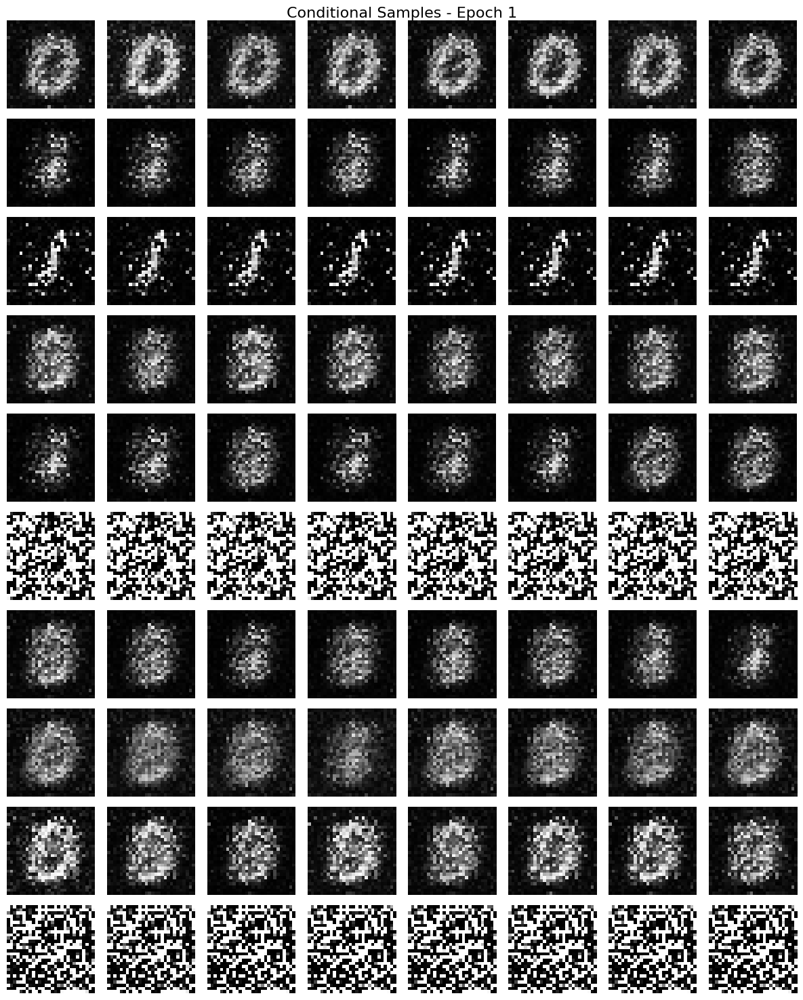

Epoch 2/50 | G_loss: 2.2004 | D_loss: 0.8319 | D(x): 0.726 | D(G(z)): 0.261
Epoch 3/50 | G_loss: 2.1125 | D_loss: 0.9006 | D(x): 0.704 | D(G(z)): 0.289
Epoch 4/50 | G_loss: 1.7028 | D_loss: 0.9973 | D(x): 0.664 | D(G(z)): 0.327
Epoch 5/50 | G_loss: 1.4781 | D_loss: 1.0256 | D(x): 0.659 | D(G(z)): 0.332
Epoch 6/50 | G_loss: 1.1436 | D_loss: 1.1408 | D(x): 0.611 | D(G(z)): 0.381
Epoch 7/50 | G_loss: 1.0186 | D_loss: 1.2127 | D(x): 0.585 | D(G(z)): 0.407
Epoch 8/50 | G_loss: 0.9295 | D_loss: 1.2499 | D(x): 0.568 | D(G(z)): 0.425
Epoch 9/50 | G_loss: 0.8777 | D_loss: 1.2669 | D(x): 0.559 | D(G(z)): 0.438
Epoch 10/50 | G_loss: 0.8602 | D_loss: 1.2808 | D(x): 0.553 | D(G(z)): 0.443


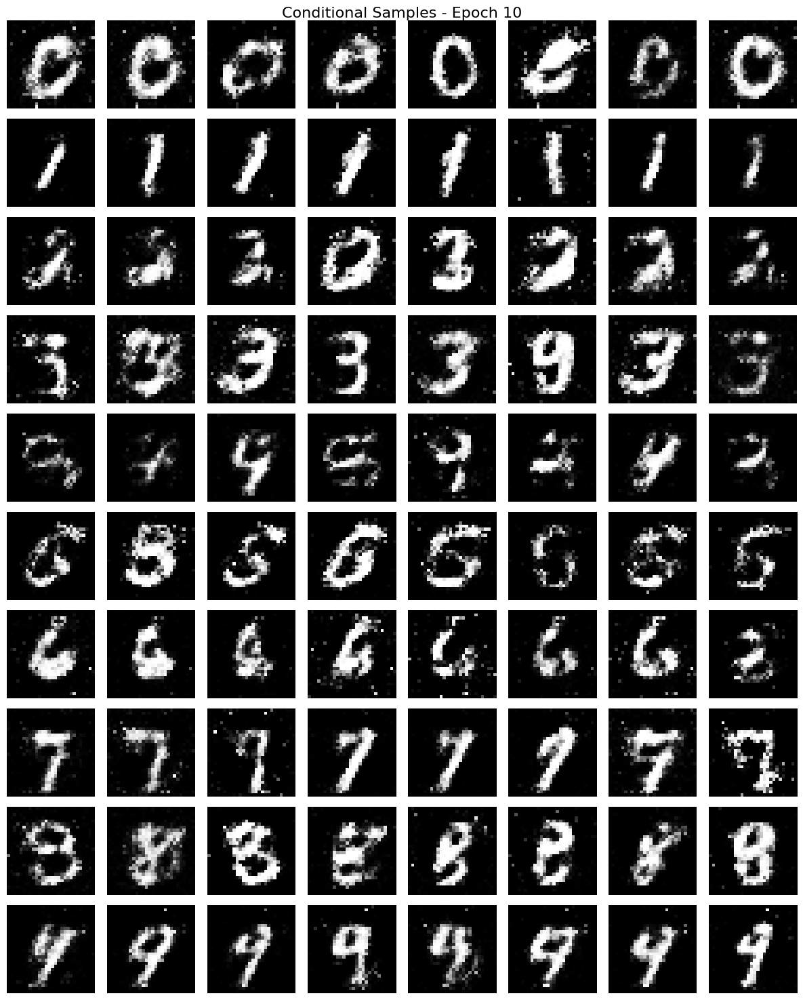

Epoch 11/50 | G_loss: 0.8211 | D_loss: 1.3080 | D(x): 0.541 | D(G(z)): 0.456
Epoch 12/50 | G_loss: 0.7973 | D_loss: 1.3220 | D(x): 0.534 | D(G(z)): 0.463
Epoch 13/50 | G_loss: 0.7813 | D_loss: 1.3356 | D(x): 0.528 | D(G(z)): 0.469
Epoch 14/50 | G_loss: 0.7633 | D_loss: 1.3458 | D(x): 0.522 | D(G(z)): 0.475
Epoch 15/50 | G_loss: 0.7657 | D_loss: 1.3450 | D(x): 0.522 | D(G(z)): 0.474
Epoch 16/50 | G_loss: 0.7560 | D_loss: 1.3520 | D(x): 0.518 | D(G(z)): 0.477
Epoch 17/50 | G_loss: 0.7487 | D_loss: 1.3565 | D(x): 0.516 | D(G(z)): 0.480
Epoch 18/50 | G_loss: 0.7481 | D_loss: 1.3588 | D(x): 0.515 | D(G(z)): 0.480
Epoch 19/50 | G_loss: 0.7417 | D_loss: 1.3635 | D(x): 0.513 | D(G(z)): 0.482
Epoch 20/50 | G_loss: 0.7386 | D_loss: 1.3641 | D(x): 0.512 | D(G(z)): 0.484


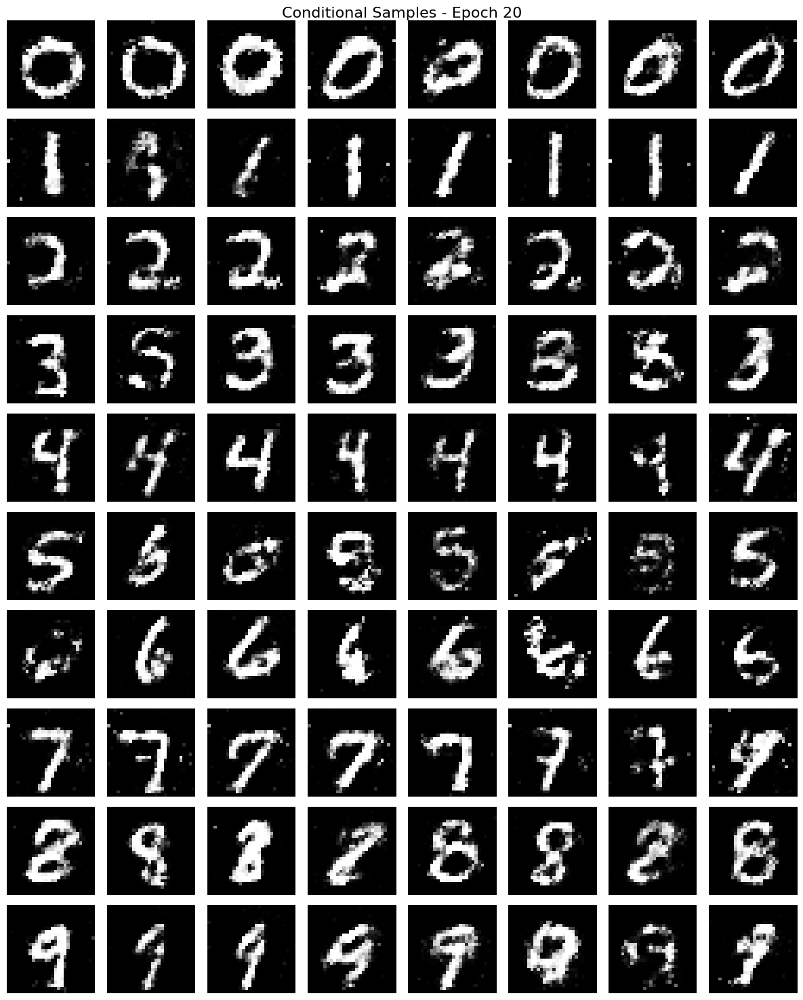

Epoch 21/50 | G_loss: 0.7345 | D_loss: 1.3686 | D(x): 0.511 | D(G(z)): 0.485
Epoch 22/50 | G_loss: 0.7360 | D_loss: 1.3671 | D(x): 0.511 | D(G(z)): 0.484
Epoch 23/50 | G_loss: 0.7321 | D_loss: 1.3704 | D(x): 0.509 | D(G(z)): 0.486
Epoch 24/50 | G_loss: 0.7296 | D_loss: 1.3710 | D(x): 0.509 | D(G(z)): 0.487
Epoch 25/50 | G_loss: 0.7290 | D_loss: 1.3710 | D(x): 0.509 | D(G(z)): 0.487
Epoch 26/50 | G_loss: 0.7294 | D_loss: 1.3714 | D(x): 0.509 | D(G(z)): 0.487
Epoch 27/50 | G_loss: 0.7272 | D_loss: 1.3726 | D(x): 0.508 | D(G(z)): 0.487
Epoch 28/50 | G_loss: 0.7267 | D_loss: 1.3732 | D(x): 0.508 | D(G(z)): 0.488
Epoch 29/50 | G_loss: 0.7266 | D_loss: 1.3727 | D(x): 0.508 | D(G(z)): 0.488
Epoch 30/50 | G_loss: 0.7223 | D_loss: 1.3753 | D(x): 0.507 | D(G(z)): 0.489


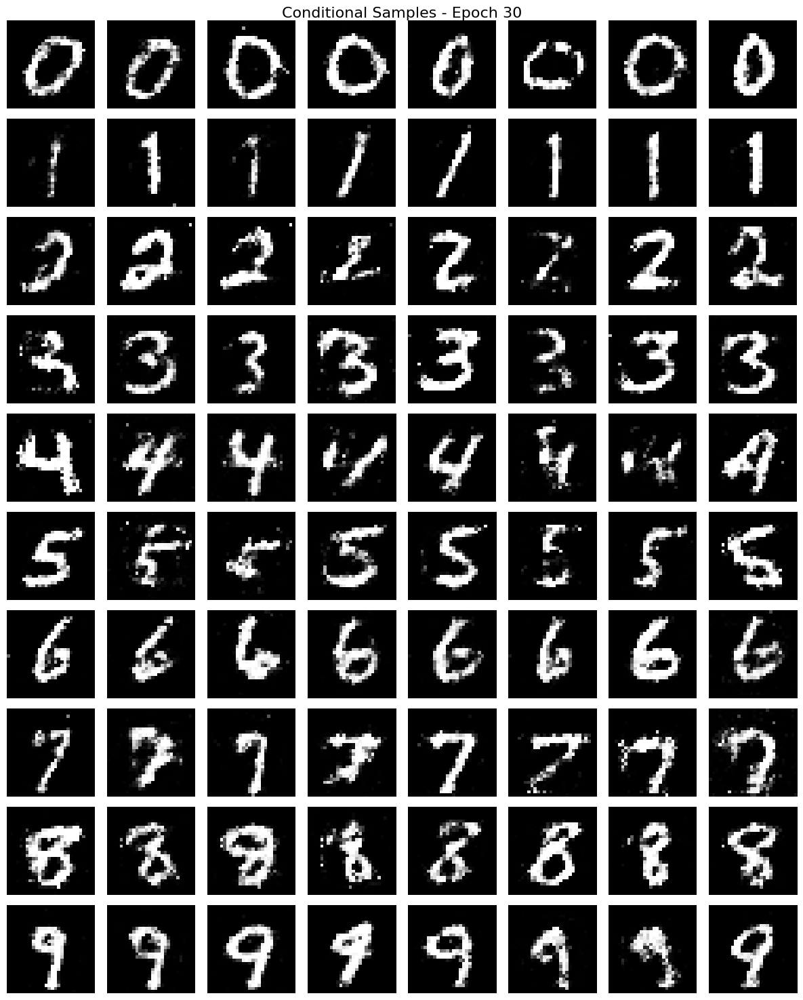

Epoch 31/50 | G_loss: 0.7193 | D_loss: 1.3771 | D(x): 0.506 | D(G(z)): 0.490
Epoch 32/50 | G_loss: 0.7188 | D_loss: 1.3773 | D(x): 0.506 | D(G(z)): 0.491
Epoch 33/50 | G_loss: 0.7162 | D_loss: 1.3776 | D(x): 0.506 | D(G(z)): 0.492
Epoch 34/50 | G_loss: 0.7158 | D_loss: 1.3792 | D(x): 0.505 | D(G(z)): 0.492
Epoch 35/50 | G_loss: 0.7165 | D_loss: 1.3788 | D(x): 0.505 | D(G(z)): 0.491
Epoch 36/50 | G_loss: 0.7153 | D_loss: 1.3783 | D(x): 0.505 | D(G(z)): 0.492
Epoch 37/50 | G_loss: 0.7134 | D_loss: 1.3789 | D(x): 0.505 | D(G(z)): 0.493
Epoch 38/50 | G_loss: 0.7142 | D_loss: 1.3783 | D(x): 0.505 | D(G(z)): 0.492
Epoch 39/50 | G_loss: 0.7176 | D_loss: 1.3780 | D(x): 0.505 | D(G(z)): 0.491
Epoch 40/50 | G_loss: 0.7136 | D_loss: 1.3784 | D(x): 0.505 | D(G(z)): 0.492


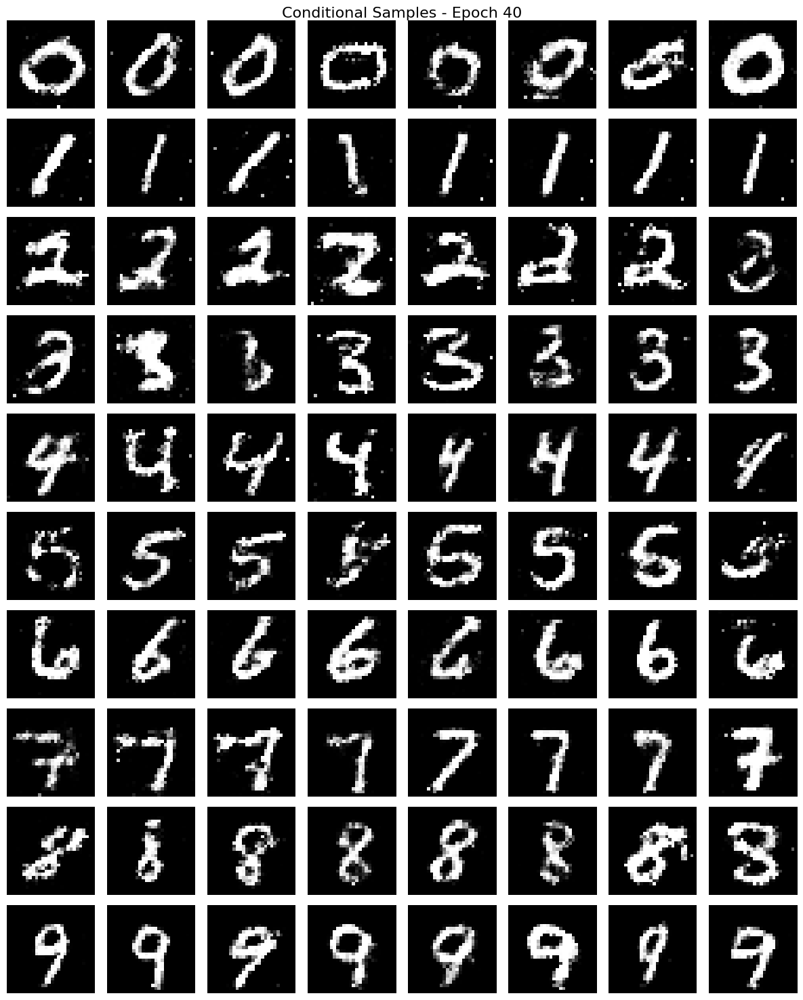

Epoch 41/50 | G_loss: 0.7119 | D_loss: 1.3805 | D(x): 0.504 | D(G(z)): 0.493
Epoch 42/50 | G_loss: 0.7123 | D_loss: 1.3791 | D(x): 0.504 | D(G(z)): 0.493
Epoch 43/50 | G_loss: 0.7134 | D_loss: 1.3797 | D(x): 0.504 | D(G(z)): 0.492
Epoch 44/50 | G_loss: 0.7120 | D_loss: 1.3794 | D(x): 0.504 | D(G(z)): 0.493
Epoch 45/50 | G_loss: 0.7094 | D_loss: 1.3803 | D(x): 0.504 | D(G(z)): 0.494
Epoch 46/50 | G_loss: 0.7105 | D_loss: 1.3800 | D(x): 0.504 | D(G(z)): 0.494
Epoch 47/50 | G_loss: 0.7096 | D_loss: 1.3801 | D(x): 0.503 | D(G(z)): 0.494
Epoch 48/50 | G_loss: 0.7102 | D_loss: 1.3806 | D(x): 0.503 | D(G(z)): 0.494
Epoch 49/50 | G_loss: 0.7085 | D_loss: 1.3812 | D(x): 0.503 | D(G(z)): 0.494
Epoch 50/50 | G_loss: 0.7093 | D_loss: 1.3804 | D(x): 0.503 | D(G(z)): 0.494


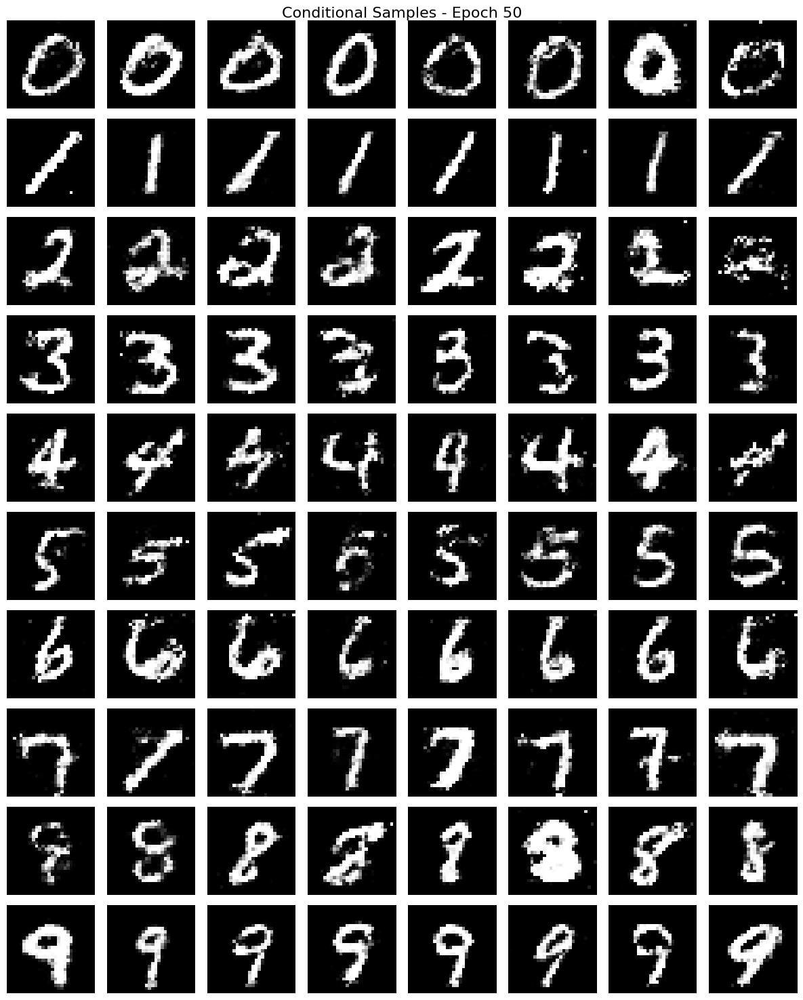


Training completed! Plotting results...



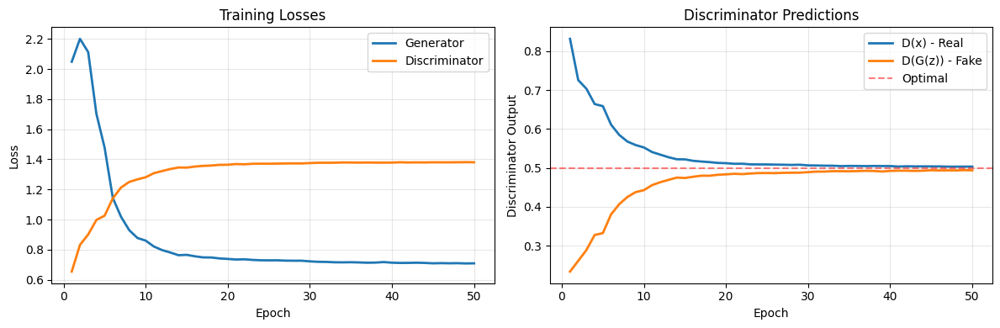

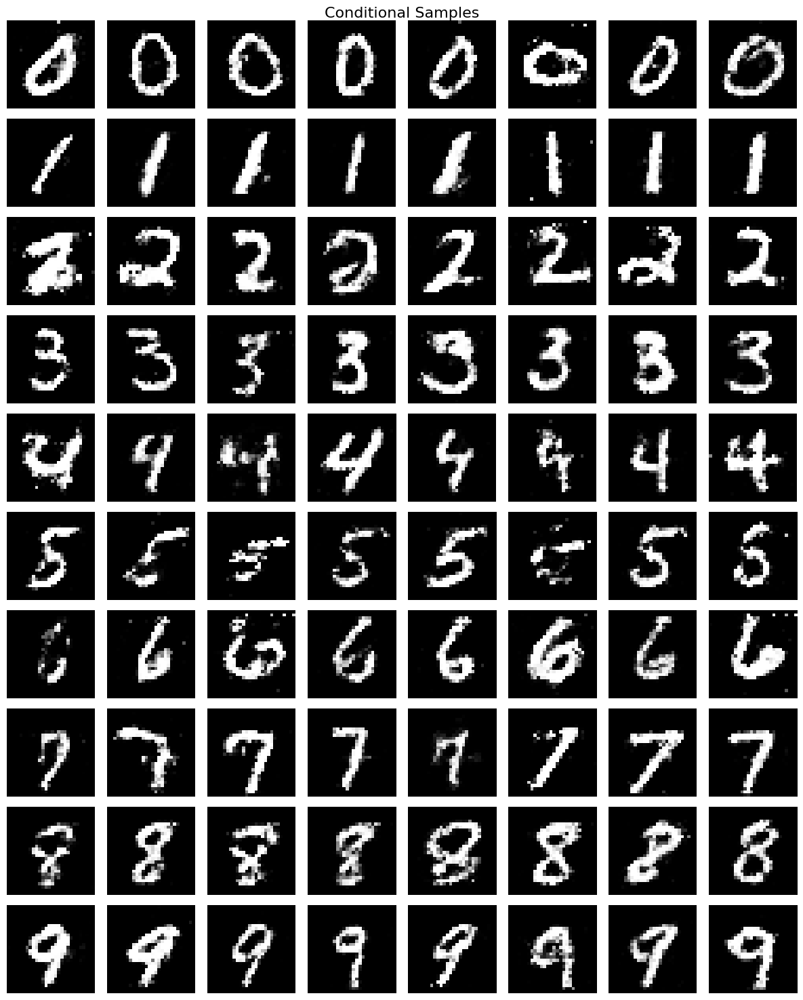

In [37]:
print("EXP 1: Vanilla Conditional GAN - MNIST")
print("-"*50)
gen_vanilla_mnist, disc_vanilla_mnist, hist_vanilla_mnist = run_conditional_gan_experiment(
    dataset_name="mnist",
    architecture="vanilla",
    n_epochs=50,
    sample_interval=10)

EXP 2: PatchGAN - MNIST
--------------------------------------------------
Conditional GAN - patchgan - MNIST
--------------------------------------------------


--- MNIST DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000

Generator parameters: 1,492,596
Discriminator parameters: 668,769

Starting training...

Epoch 1/50 | G_loss: 3.4395 | D_loss: 0.2468 | D(x): 0.912 | D(G(z)): 0.096


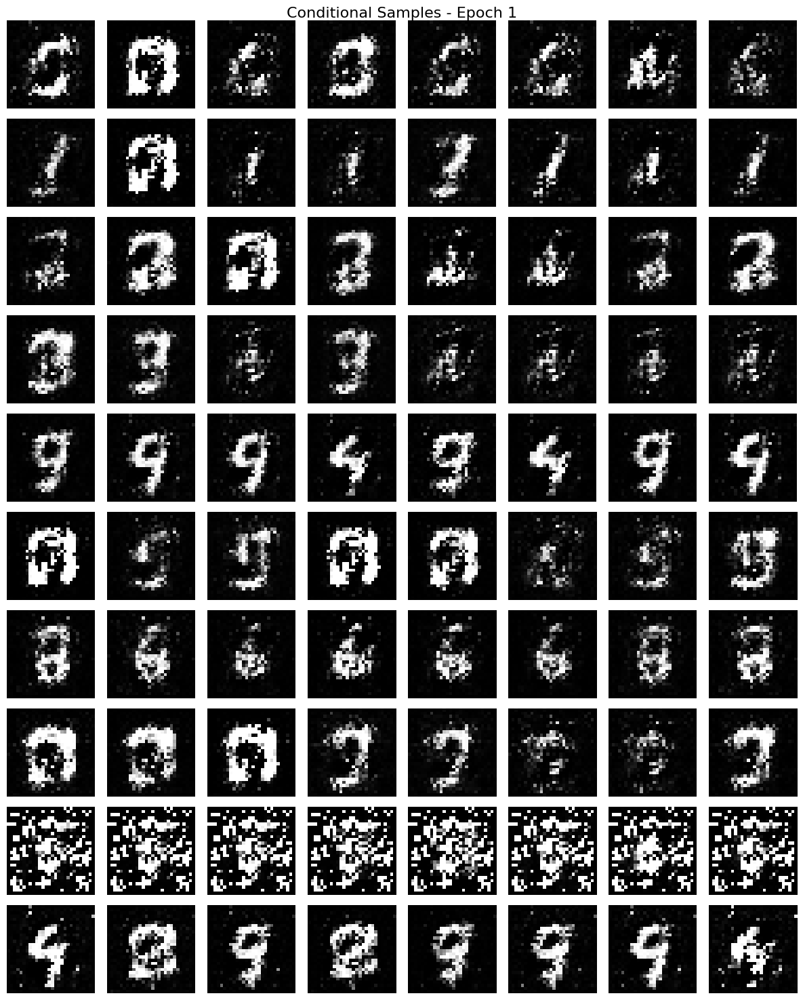

Epoch 2/50 | G_loss: 2.0393 | D_loss: 0.5749 | D(x): 0.810 | D(G(z)): 0.233
Epoch 3/50 | G_loss: 1.7094 | D_loss: 0.6435 | D(x): 0.750 | D(G(z)): 0.226
Epoch 4/50 | G_loss: 1.9761 | D_loss: 0.5672 | D(x): 0.771 | D(G(z)): 0.182
Epoch 5/50 | G_loss: 2.0334 | D_loss: 0.5533 | D(x): 0.775 | D(G(z)): 0.173
Epoch 6/50 | G_loss: 2.0013 | D_loss: 0.5624 | D(x): 0.772 | D(G(z)): 0.179
Epoch 7/50 | G_loss: 2.0057 | D_loss: 0.5581 | D(x): 0.774 | D(G(z)): 0.178
Epoch 8/50 | G_loss: 2.0482 | D_loss: 0.5507 | D(x): 0.779 | D(G(z)): 0.175
Epoch 9/50 | G_loss: 2.1500 | D_loss: 0.5110 | D(x): 0.790 | D(G(z)): 0.160
Epoch 10/50 | G_loss: 2.1647 | D_loss: 0.5081 | D(x): 0.793 | D(G(z)): 0.160


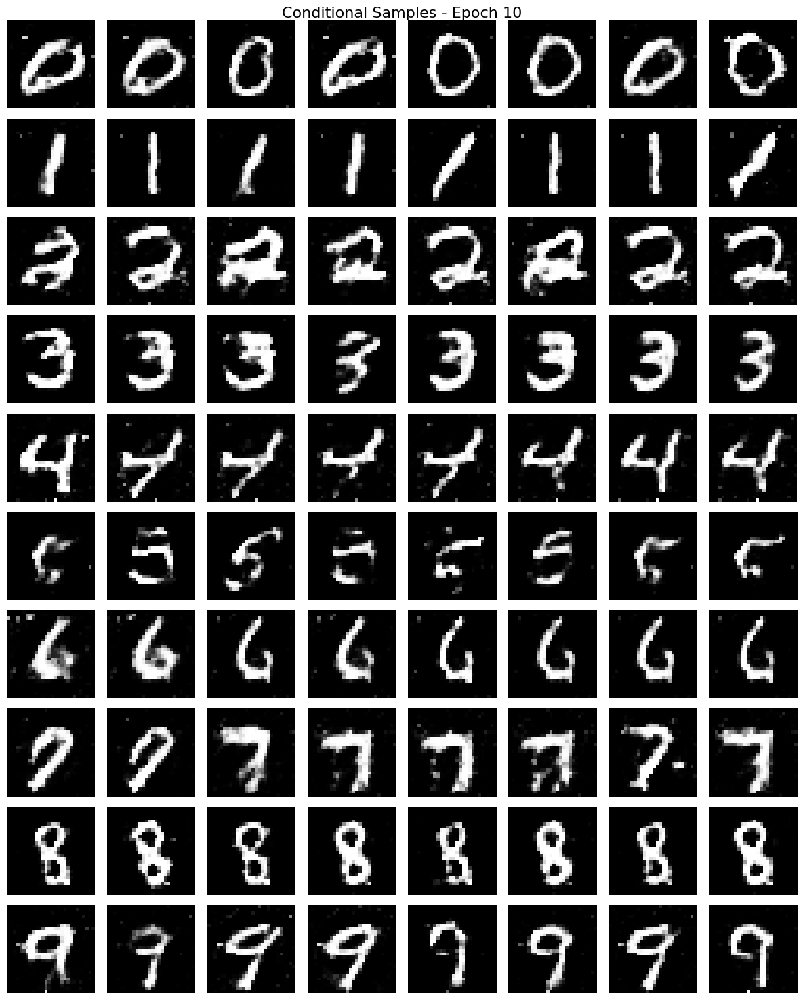

Epoch 11/50 | G_loss: 2.2325 | D_loss: 0.4860 | D(x): 0.800 | D(G(z)): 0.153
Epoch 12/50 | G_loss: 2.3040 | D_loss: 0.4735 | D(x): 0.806 | D(G(z)): 0.147
Epoch 13/50 | G_loss: 2.3375 | D_loss: 0.4695 | D(x): 0.809 | D(G(z)): 0.144
Epoch 14/50 | G_loss: 2.3645 | D_loss: 0.4730 | D(x): 0.807 | D(G(z)): 0.142
Epoch 15/50 | G_loss: 2.5331 | D_loss: 0.4112 | D(x): 0.829 | D(G(z)): 0.122
Epoch 16/50 | G_loss: 2.6795 | D_loss: 0.3772 | D(x): 0.844 | D(G(z)): 0.110
Epoch 17/50 | G_loss: 2.9865 | D_loss: 0.2936 | D(x): 0.872 | D(G(z)): 0.081
Epoch 18/50 | G_loss: 3.1605 | D_loss: 0.2642 | D(x): 0.886 | D(G(z)): 0.072
Epoch 19/50 | G_loss: 3.1904 | D_loss: 0.2565 | D(x): 0.888 | D(G(z)): 0.070
Epoch 20/50 | G_loss: 3.3692 | D_loss: 0.2355 | D(x): 0.895 | D(G(z)): 0.060


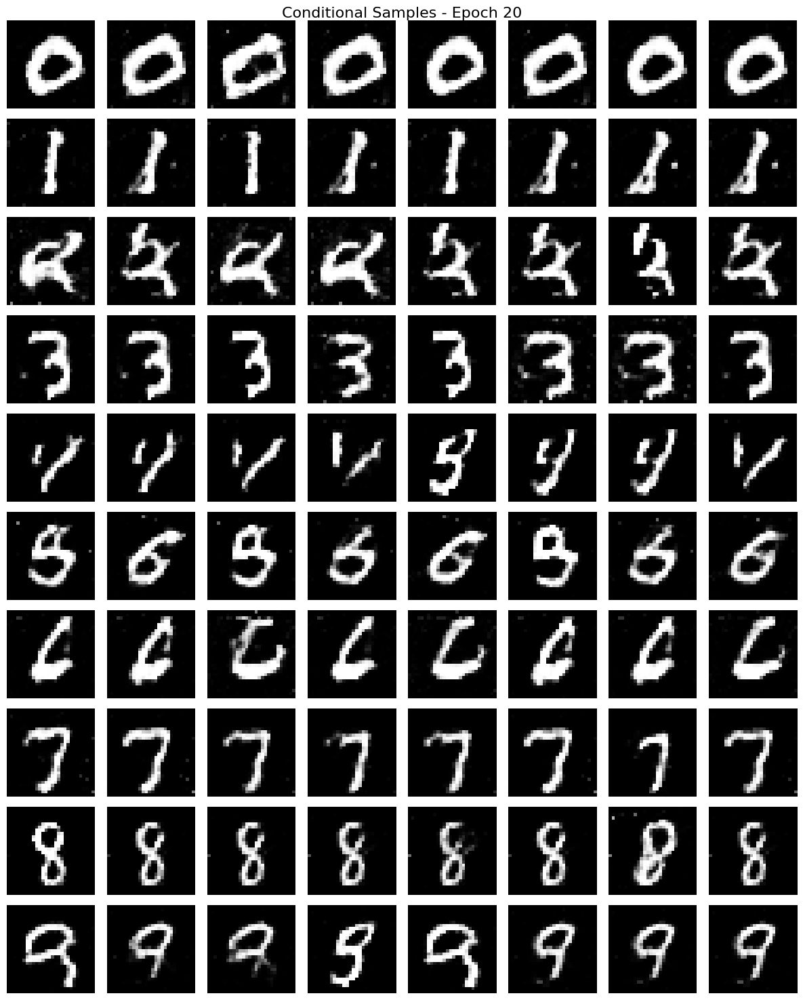

Epoch 21/50 | G_loss: 3.2528 | D_loss: 0.2769 | D(x): 0.882 | D(G(z)): 0.073
Epoch 22/50 | G_loss: 3.3006 | D_loss: 0.2605 | D(x): 0.886 | D(G(z)): 0.067
Epoch 23/50 | G_loss: 3.3047 | D_loss: 0.2607 | D(x): 0.889 | D(G(z)): 0.070
Epoch 24/50 | G_loss: 3.3990 | D_loss: 0.2443 | D(x): 0.895 | D(G(z)): 0.063
Epoch 25/50 | G_loss: 3.3723 | D_loss: 0.2643 | D(x): 0.885 | D(G(z)): 0.066
Epoch 26/50 | G_loss: 3.4881 | D_loss: 0.2295 | D(x): 0.897 | D(G(z)): 0.057
Epoch 27/50 | G_loss: 3.6532 | D_loss: 0.2096 | D(x): 0.906 | D(G(z)): 0.050
Epoch 28/50 | G_loss: 3.5799 | D_loss: 0.2274 | D(x): 0.899 | D(G(z)): 0.056
Epoch 29/50 | G_loss: 3.6066 | D_loss: 0.2258 | D(x): 0.899 | D(G(z)): 0.054
Epoch 30/50 | G_loss: 3.6339 | D_loss: 0.2315 | D(x): 0.898 | D(G(z)): 0.055


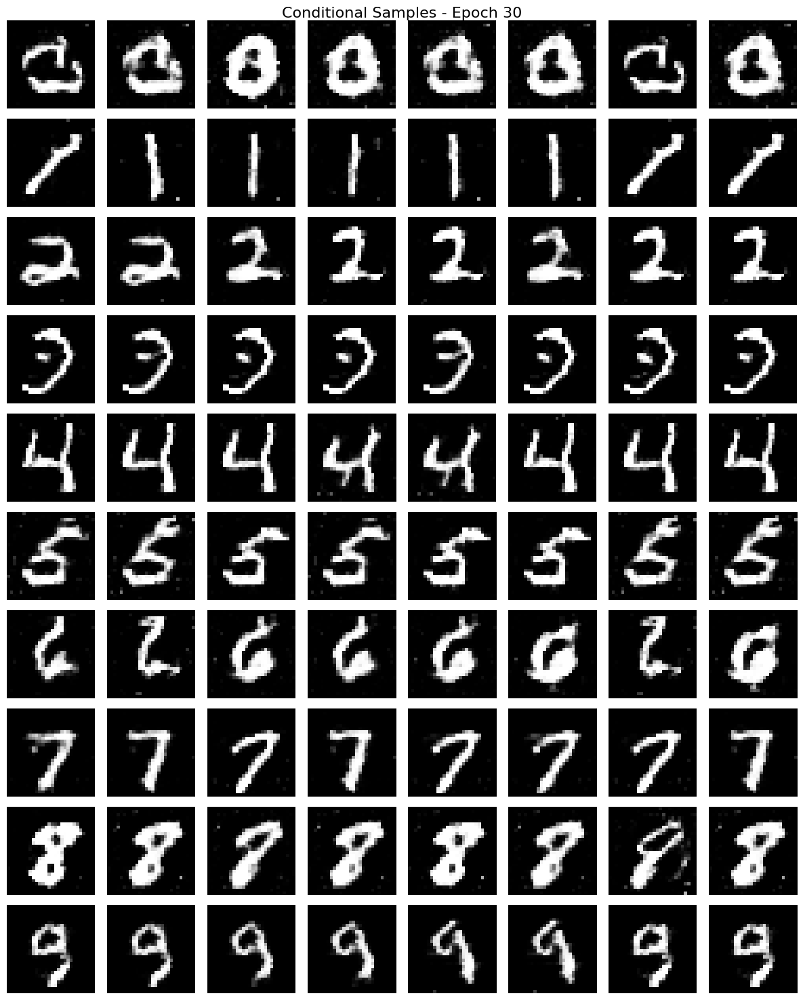

Epoch 31/50 | G_loss: 3.6556 | D_loss: 0.2232 | D(x): 0.905 | D(G(z)): 0.053
Epoch 32/50 | G_loss: 3.8655 | D_loss: 0.1842 | D(x): 0.920 | D(G(z)): 0.044
Epoch 33/50 | G_loss: 3.7489 | D_loss: 0.2278 | D(x): 0.897 | D(G(z)): 0.051
Epoch 34/50 | G_loss: 3.3274 | D_loss: 0.2558 | D(x): 0.916 | D(G(z)): 0.096
Epoch 35/50 | G_loss: 3.9053 | D_loss: 0.1929 | D(x): 0.917 | D(G(z)): 0.048
Epoch 36/50 | G_loss: 3.4779 | D_loss: 0.2596 | D(x): 0.902 | D(G(z)): 0.080
Epoch 37/50 | G_loss: 3.7266 | D_loss: 0.2415 | D(x): 0.895 | D(G(z)): 0.057
Epoch 38/50 | G_loss: 3.6679 | D_loss: 0.2461 | D(x): 0.892 | D(G(z)): 0.054
Epoch 39/50 | G_loss: 3.5307 | D_loss: 0.2359 | D(x): 0.907 | D(G(z)): 0.072
Epoch 40/50 | G_loss: 3.6241 | D_loss: 0.2293 | D(x): 0.904 | D(G(z)): 0.059


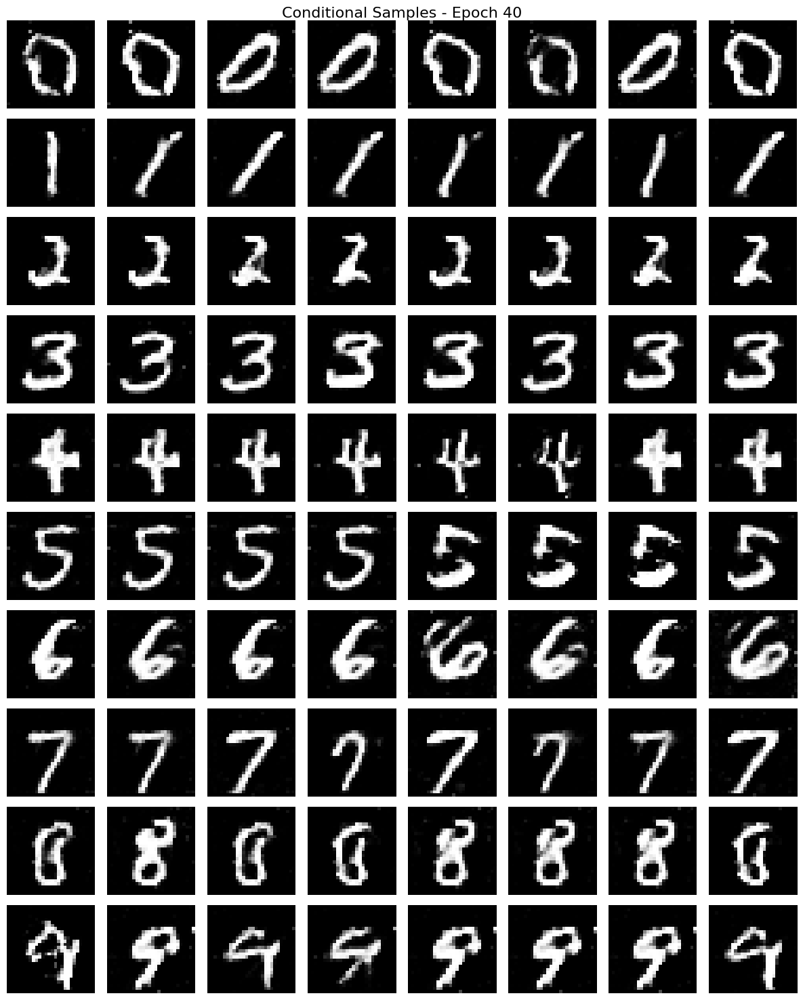

Epoch 41/50 | G_loss: 3.7782 | D_loss: 0.2130 | D(x): 0.905 | D(G(z)): 0.048
Epoch 42/50 | G_loss: 3.3862 | D_loss: 0.2697 | D(x): 0.895 | D(G(z)): 0.091
Epoch 43/50 | G_loss: 3.7385 | D_loss: 0.2287 | D(x): 0.909 | D(G(z)): 0.062
Epoch 44/50 | G_loss: 3.9468 | D_loss: 0.1927 | D(x): 0.916 | D(G(z)): 0.046
Epoch 45/50 | G_loss: 3.9367 | D_loss: 0.1927 | D(x): 0.917 | D(G(z)): 0.047
Epoch 46/50 | G_loss: 4.0709 | D_loss: 0.1885 | D(x): 0.917 | D(G(z)): 0.043
Epoch 47/50 | G_loss: 4.2501 | D_loss: 0.1864 | D(x): 0.920 | D(G(z)): 0.040
Epoch 48/50 | G_loss: 4.1425 | D_loss: 0.1686 | D(x): 0.926 | D(G(z)): 0.044
Epoch 49/50 | G_loss: 4.3375 | D_loss: 0.1808 | D(x): 0.929 | D(G(z)): 0.046
Epoch 50/50 | G_loss: 4.2403 | D_loss: 0.1802 | D(x): 0.926 | D(G(z)): 0.043


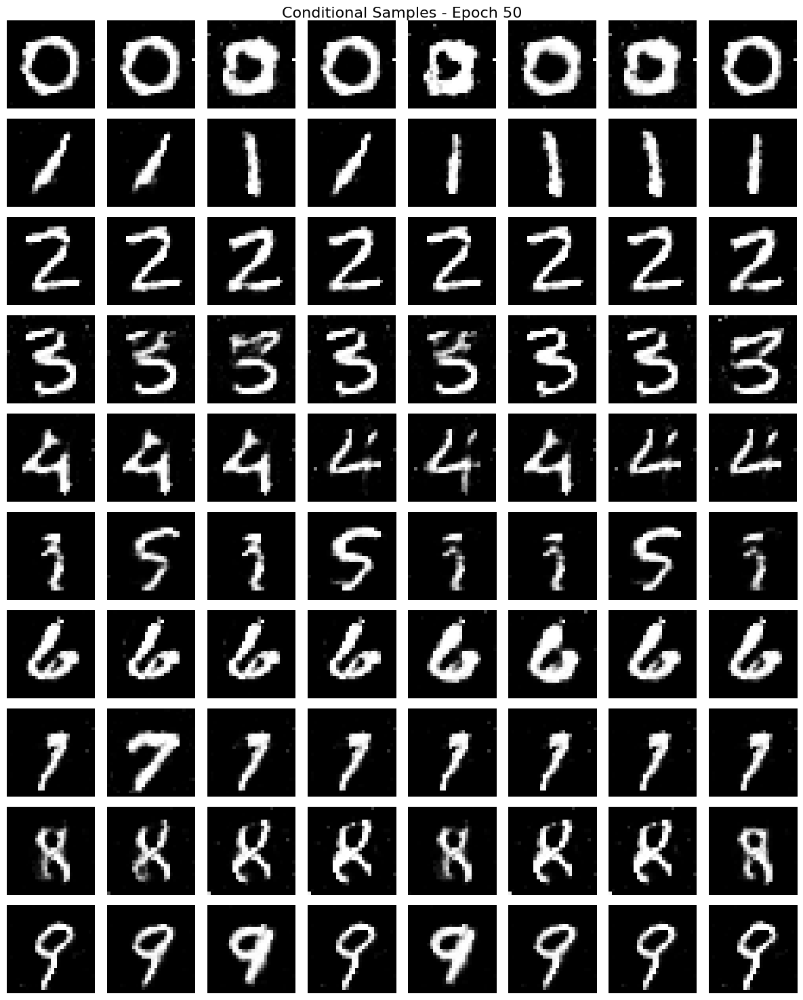


Training completed! Plotting results...



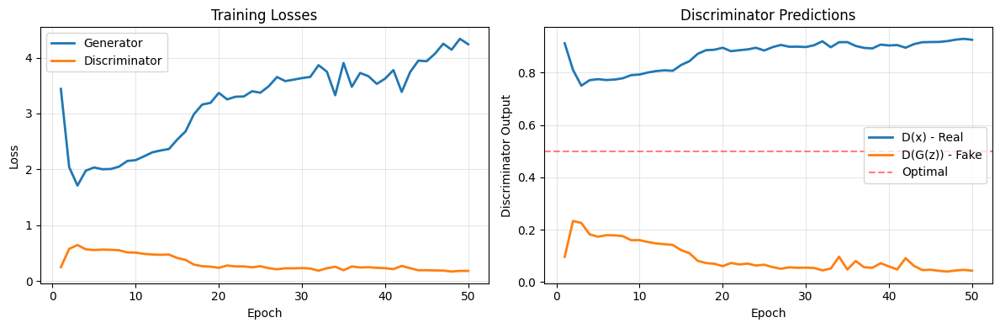

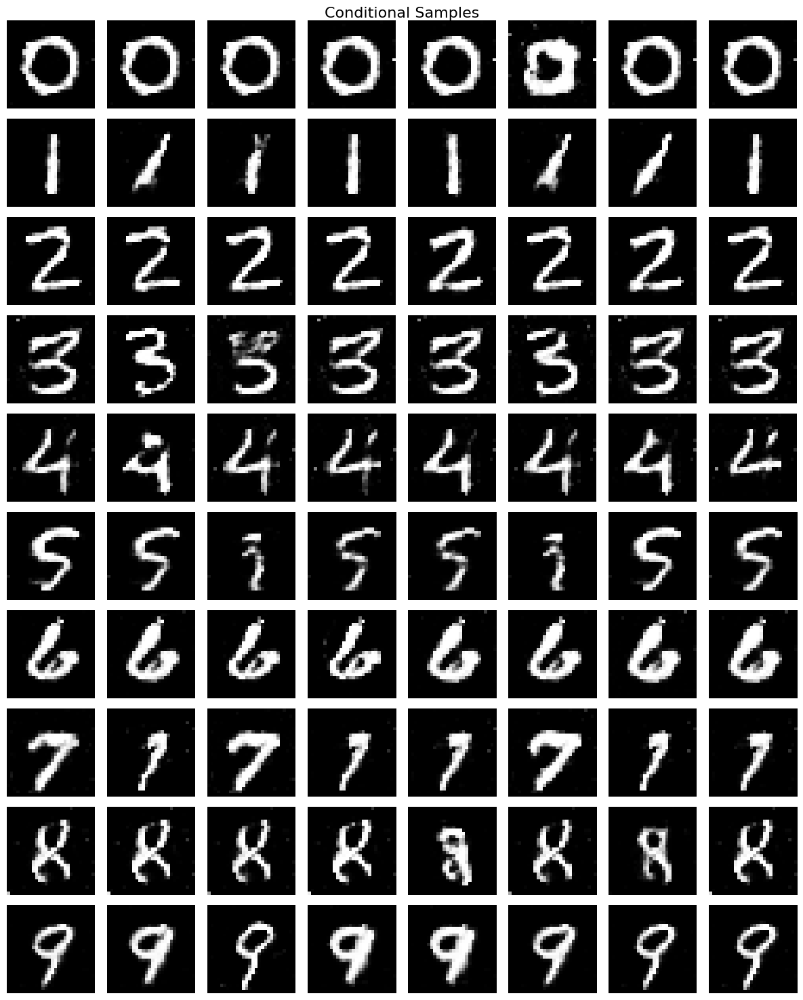

In [38]:
print("EXP 2: PatchGAN - MNIST")
print("-"*50)
gen_patch_mnist, disc_patch_mnist, hist_patch_mnist = run_conditional_gan_experiment(
    dataset_name="mnist",
    architecture="patchgan",
    n_epochs=50,
    sample_interval=10)

EXP 3: Feature Matching - MNIST
--------------------------------------------------
Conditional GAN - feature_matching - MNIST
--------------------------------------------------


--- MNIST DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000

Generator parameters: 1,492,596
Discriminator parameters: 538,725

Starting training...

Epoch 1/50 | G_loss: 2.9154 | D_loss: 0.6586 | D(x): 0.820 | D(G(z)): 0.212


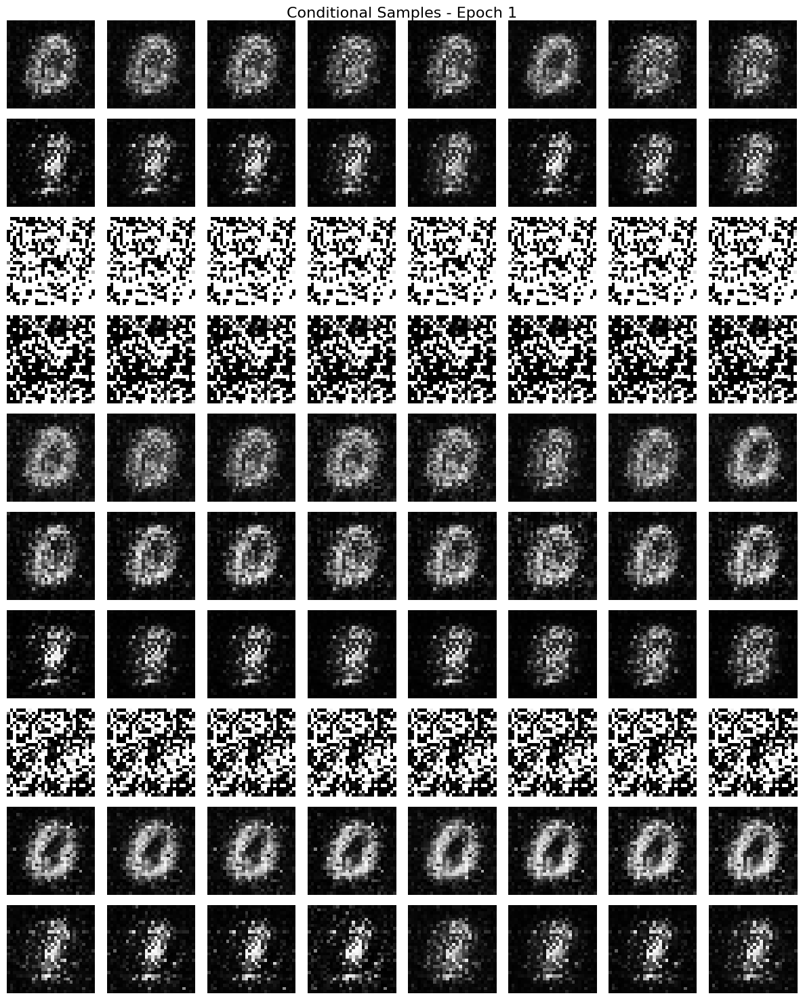

Epoch 2/50 | G_loss: 3.0565 | D_loss: 0.7760 | D(x): 0.746 | D(G(z)): 0.236
Epoch 3/50 | G_loss: 2.9272 | D_loss: 0.7941 | D(x): 0.736 | D(G(z)): 0.240
Epoch 4/50 | G_loss: 2.9977 | D_loss: 0.8104 | D(x): 0.732 | D(G(z)): 0.243
Epoch 5/50 | G_loss: 2.7539 | D_loss: 0.8766 | D(x): 0.712 | D(G(z)): 0.263
Epoch 6/50 | G_loss: 2.6268 | D_loss: 0.8964 | D(x): 0.702 | D(G(z)): 0.273
Epoch 7/50 | G_loss: 2.5907 | D_loss: 0.9224 | D(x): 0.693 | D(G(z)): 0.280
Epoch 8/50 | G_loss: 2.8004 | D_loss: 0.9318 | D(x): 0.691 | D(G(z)): 0.284
Epoch 9/50 | G_loss: 2.5660 | D_loss: 0.9599 | D(x): 0.680 | D(G(z)): 0.297
Epoch 10/50 | G_loss: 1.4722 | D_loss: 1.0725 | D(x): 0.639 | D(G(z)): 0.339


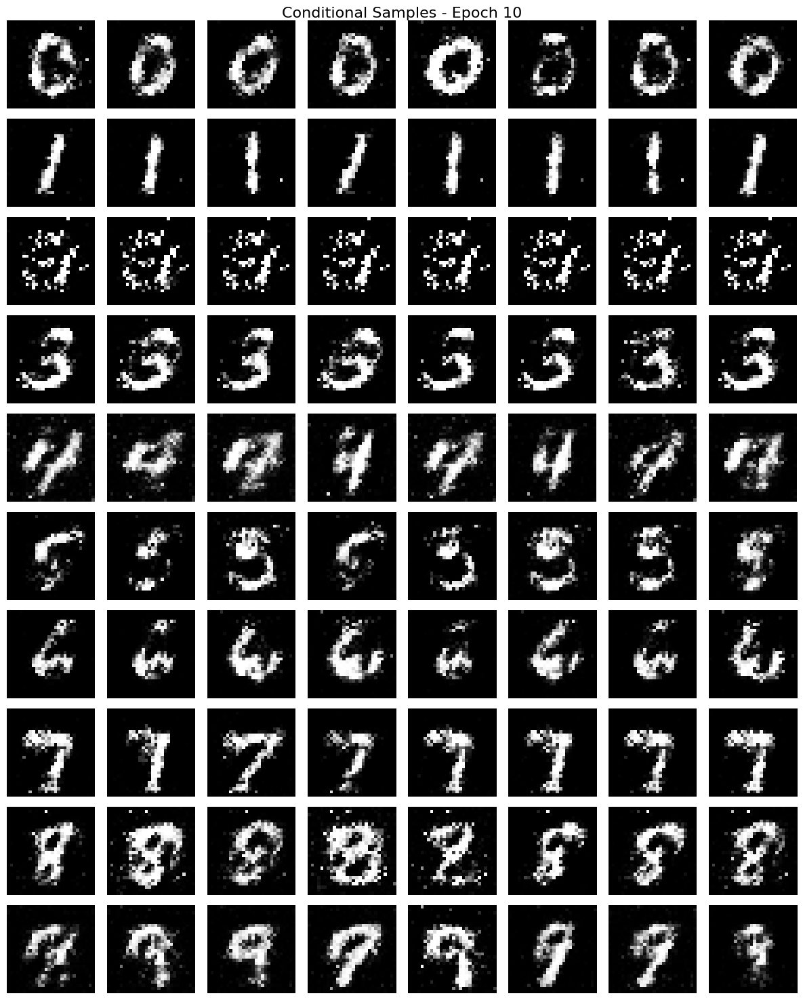

Epoch 11/50 | G_loss: 1.3369 | D_loss: 1.1513 | D(x): 0.608 | D(G(z)): 0.370
Epoch 12/50 | G_loss: 1.2378 | D_loss: 1.1956 | D(x): 0.590 | D(G(z)): 0.393
Epoch 13/50 | G_loss: 1.1491 | D_loss: 1.2363 | D(x): 0.572 | D(G(z)): 0.414
Epoch 14/50 | G_loss: 1.1036 | D_loss: 1.2620 | D(x): 0.559 | D(G(z)): 0.424
Epoch 15/50 | G_loss: 1.0509 | D_loss: 1.2865 | D(x): 0.549 | D(G(z)): 0.440
Epoch 16/50 | G_loss: 1.0307 | D_loss: 1.2962 | D(x): 0.544 | D(G(z)): 0.446
Epoch 17/50 | G_loss: 1.0032 | D_loss: 1.3136 | D(x): 0.536 | D(G(z)): 0.453
Epoch 18/50 | G_loss: 0.9747 | D_loss: 1.3268 | D(x): 0.530 | D(G(z)): 0.462
Epoch 19/50 | G_loss: 0.9606 | D_loss: 1.3381 | D(x): 0.525 | D(G(z)): 0.467
Epoch 20/50 | G_loss: 0.9614 | D_loss: 1.3373 | D(x): 0.525 | D(G(z)): 0.467


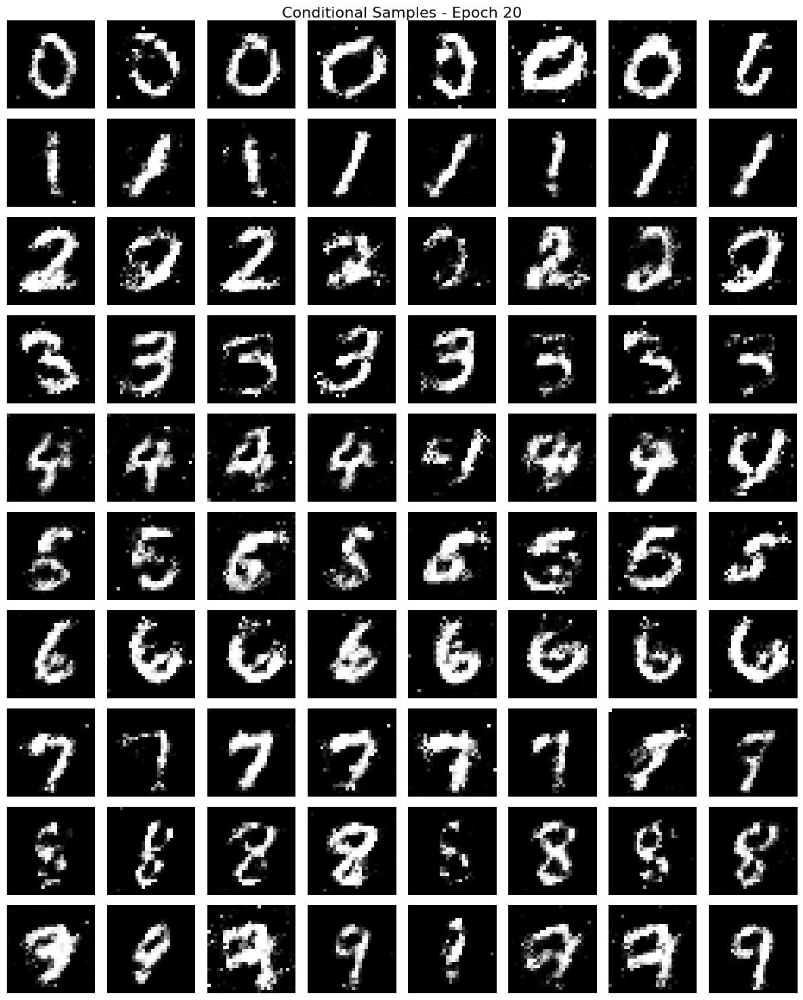

Epoch 21/50 | G_loss: 0.9638 | D_loss: 1.3393 | D(x): 0.524 | D(G(z)): 0.468
Epoch 22/50 | G_loss: 0.9556 | D_loss: 1.3456 | D(x): 0.522 | D(G(z)): 0.471
Epoch 23/50 | G_loss: 0.9434 | D_loss: 1.3541 | D(x): 0.519 | D(G(z)): 0.475
Epoch 24/50 | G_loss: 0.9431 | D_loss: 1.3547 | D(x): 0.517 | D(G(z)): 0.476
Epoch 25/50 | G_loss: 0.9399 | D_loss: 1.3589 | D(x): 0.516 | D(G(z)): 0.478
Epoch 26/50 | G_loss: 0.9384 | D_loss: 1.3569 | D(x): 0.516 | D(G(z)): 0.479
Epoch 27/50 | G_loss: 0.9378 | D_loss: 1.3602 | D(x): 0.514 | D(G(z)): 0.480
Epoch 28/50 | G_loss: 0.9475 | D_loss: 1.3587 | D(x): 0.516 | D(G(z)): 0.479
Epoch 29/50 | G_loss: 0.9441 | D_loss: 1.3617 | D(x): 0.513 | D(G(z)): 0.480
Epoch 30/50 | G_loss: 0.9464 | D_loss: 1.3626 | D(x): 0.514 | D(G(z)): 0.481


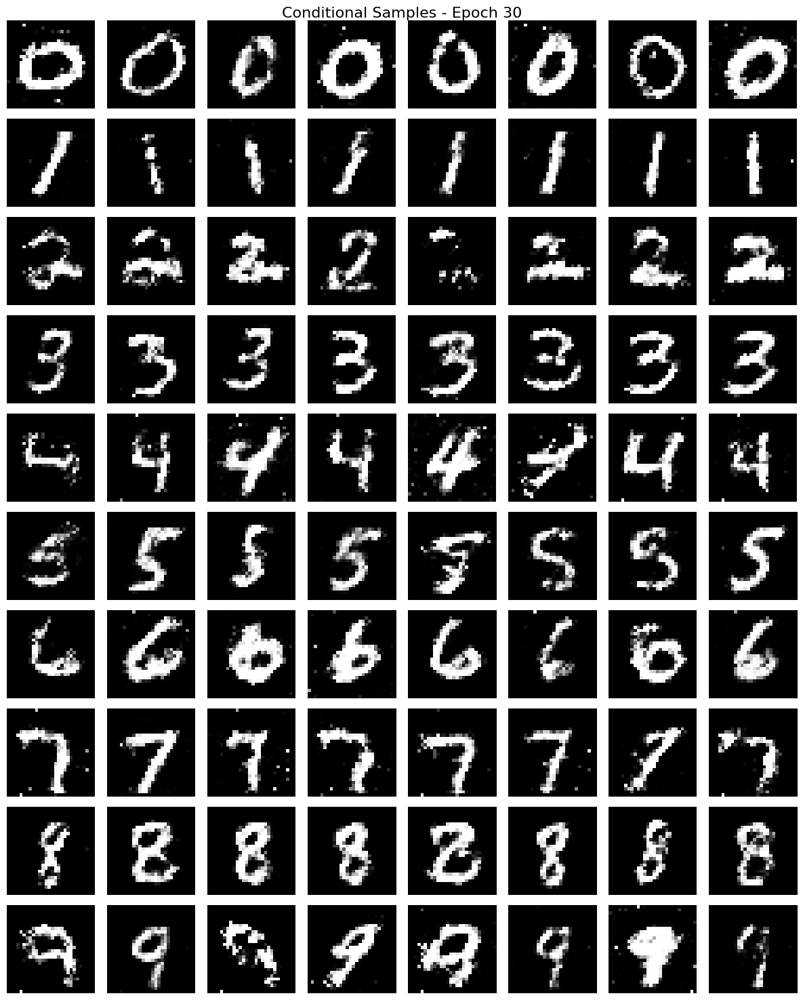

Epoch 31/50 | G_loss: 0.9494 | D_loss: 1.3628 | D(x): 0.513 | D(G(z)): 0.481
Epoch 32/50 | G_loss: 0.9446 | D_loss: 1.3641 | D(x): 0.513 | D(G(z)): 0.483
Epoch 33/50 | G_loss: 0.9504 | D_loss: 1.3625 | D(x): 0.513 | D(G(z)): 0.482
Epoch 34/50 | G_loss: 0.9473 | D_loss: 1.3669 | D(x): 0.511 | D(G(z)): 0.483
Epoch 35/50 | G_loss: 0.9453 | D_loss: 1.3671 | D(x): 0.511 | D(G(z)): 0.484
Epoch 36/50 | G_loss: 0.9519 | D_loss: 1.3664 | D(x): 0.511 | D(G(z)): 0.483
Epoch 37/50 | G_loss: 0.9572 | D_loss: 1.3662 | D(x): 0.512 | D(G(z)): 0.484
Epoch 38/50 | G_loss: 0.9612 | D_loss: 1.3659 | D(x): 0.511 | D(G(z)): 0.485
Epoch 39/50 | G_loss: 0.9615 | D_loss: 1.3665 | D(x): 0.511 | D(G(z)): 0.484
Epoch 40/50 | G_loss: 0.9631 | D_loss: 1.3667 | D(x): 0.511 | D(G(z)): 0.484


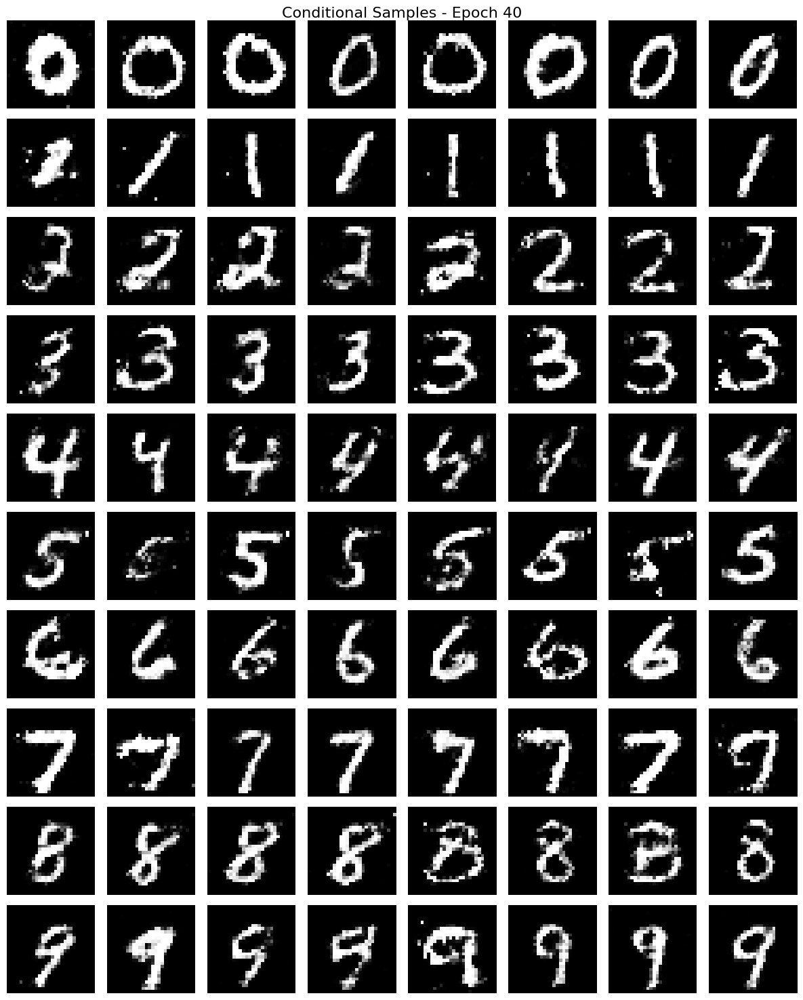

Epoch 41/50 | G_loss: 0.9654 | D_loss: 1.3668 | D(x): 0.511 | D(G(z)): 0.485
Epoch 42/50 | G_loss: 0.9702 | D_loss: 1.3670 | D(x): 0.511 | D(G(z)): 0.485
Epoch 43/50 | G_loss: 0.9693 | D_loss: 1.3678 | D(x): 0.510 | D(G(z)): 0.485
Epoch 44/50 | G_loss: 0.9709 | D_loss: 1.3696 | D(x): 0.510 | D(G(z)): 0.486
Epoch 45/50 | G_loss: 0.9777 | D_loss: 1.3667 | D(x): 0.510 | D(G(z)): 0.485
Epoch 46/50 | G_loss: 0.9761 | D_loss: 1.3684 | D(x): 0.510 | D(G(z)): 0.486
Epoch 47/50 | G_loss: 0.9833 | D_loss: 1.3676 | D(x): 0.510 | D(G(z)): 0.485
Epoch 48/50 | G_loss: 0.9872 | D_loss: 1.3668 | D(x): 0.510 | D(G(z)): 0.485
Epoch 49/50 | G_loss: 0.9906 | D_loss: 1.3672 | D(x): 0.510 | D(G(z)): 0.485
Epoch 50/50 | G_loss: 0.9989 | D_loss: 1.3651 | D(x): 0.511 | D(G(z)): 0.484


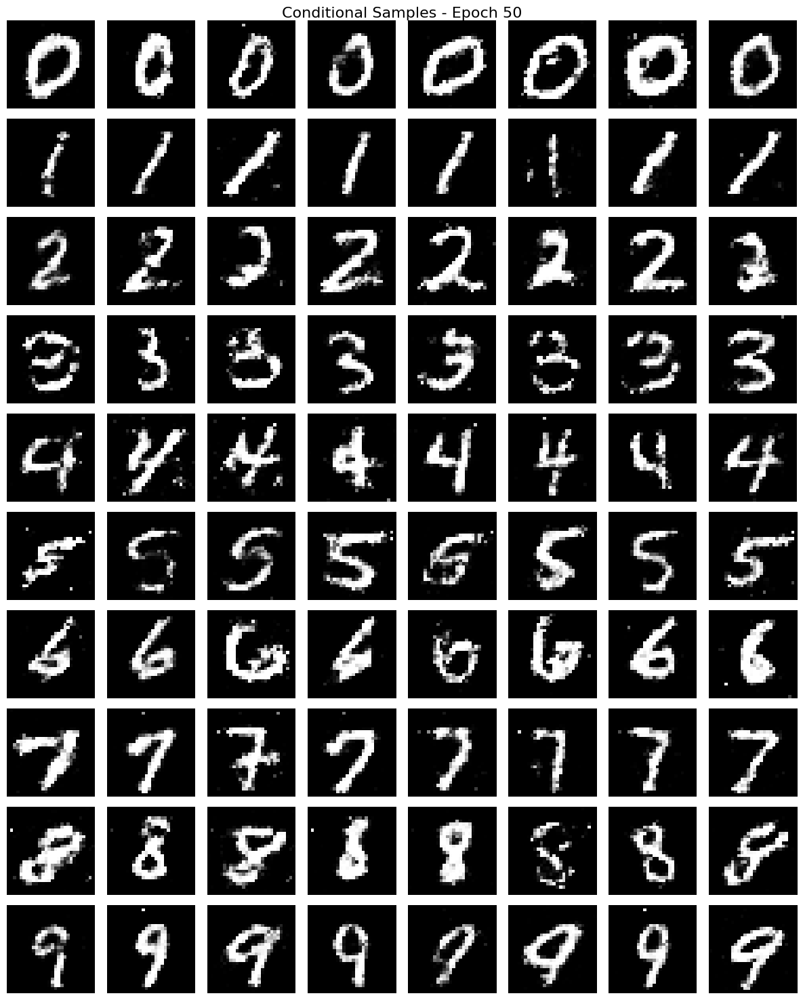


Training completed! Plotting results...



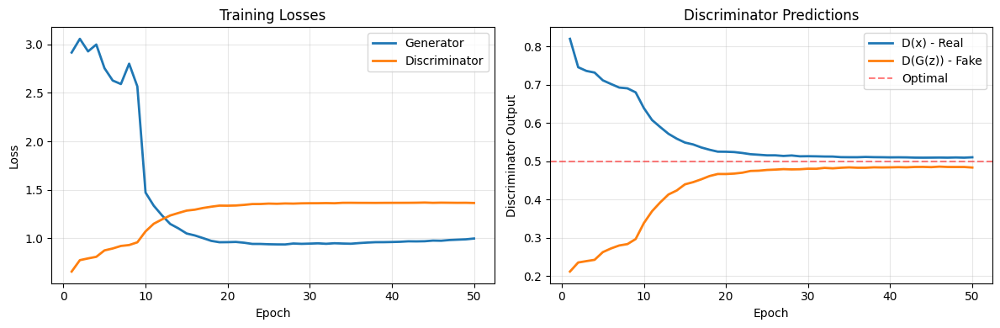

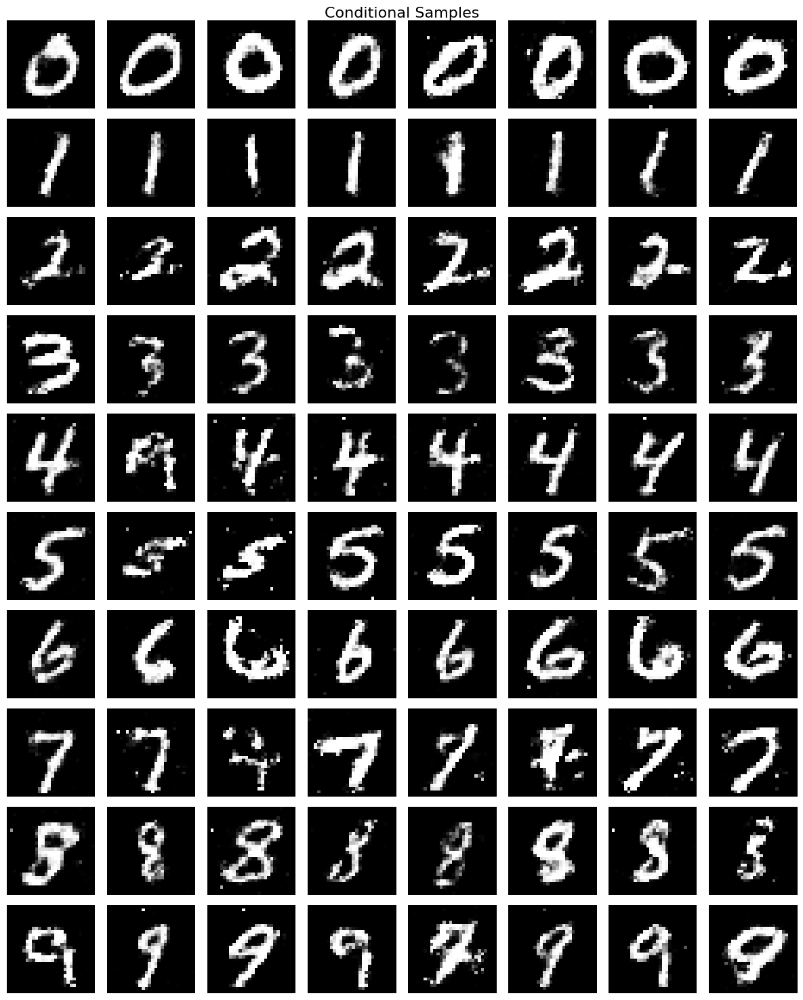

In [39]:
print("EXP 3: Feature Matching - MNIST")
print("-"*50)
gen_fm_mnist, disc_fm_mnist, hist_fm_mnist = run_conditional_gan_experiment(
    dataset_name="mnist",
    architecture="feature_matching",
    n_epochs=50,
    sample_interval=10)

EXP 4: Vanilla Conditional GAN - Fashion-MNIST
--------------------------------------------------
Conditional GAN - vanilla - FASHION
--------------------------------------------------


--- FASHION DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000

Generator parameters: 1,492,596
Discriminator parameters: 538,725

Starting training...

Epoch 1/50 | G_loss: 2.6405 | D_loss: 0.6221 | D(x): 0.821 | D(G(z)): 0.163


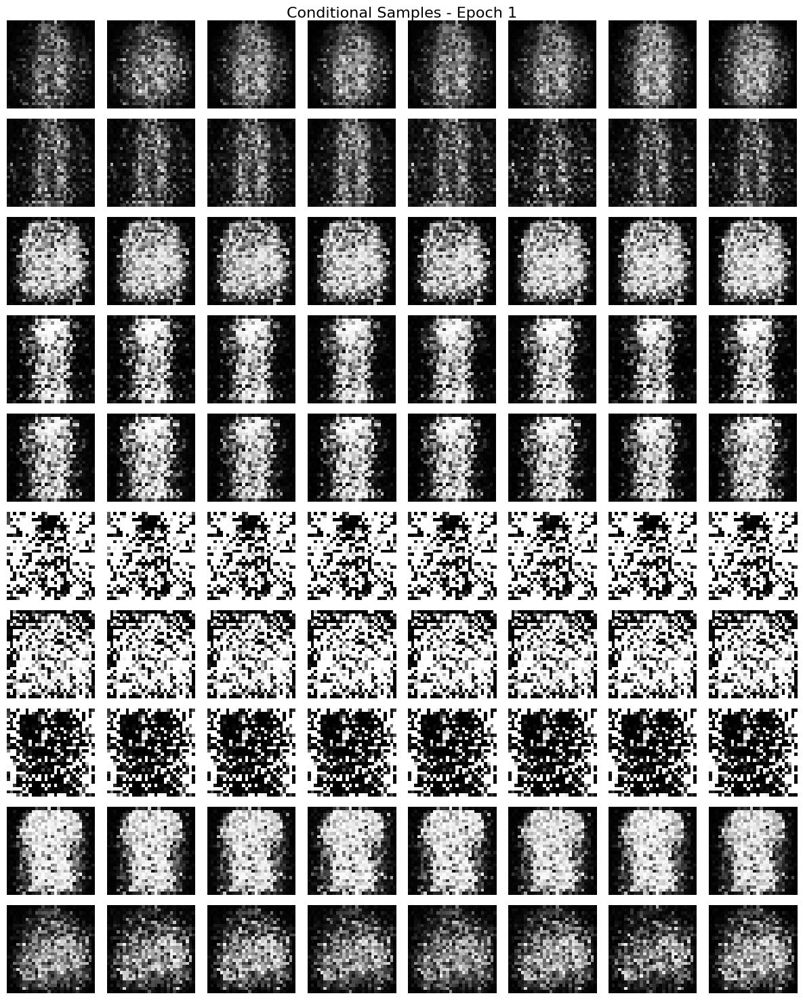

Epoch 2/50 | G_loss: 2.9306 | D_loss: 0.7495 | D(x): 0.751 | D(G(z)): 0.163
Epoch 3/50 | G_loss: 2.9685 | D_loss: 0.8107 | D(x): 0.728 | D(G(z)): 0.202
Epoch 4/50 | G_loss: 2.2313 | D_loss: 0.8956 | D(x): 0.700 | D(G(z)): 0.243
Epoch 5/50 | G_loss: 1.7298 | D_loss: 0.9579 | D(x): 0.674 | D(G(z)): 0.272
Epoch 6/50 | G_loss: 1.5426 | D_loss: 1.0298 | D(x): 0.652 | D(G(z)): 0.290
Epoch 7/50 | G_loss: 1.4235 | D_loss: 1.0782 | D(x): 0.632 | D(G(z)): 0.316
Epoch 8/50 | G_loss: 1.3902 | D_loss: 1.0892 | D(x): 0.627 | D(G(z)): 0.325
Epoch 9/50 | G_loss: 1.2373 | D_loss: 1.1620 | D(x): 0.599 | D(G(z)): 0.356
Epoch 10/50 | G_loss: 1.1034 | D_loss: 1.2264 | D(x): 0.576 | D(G(z)): 0.382


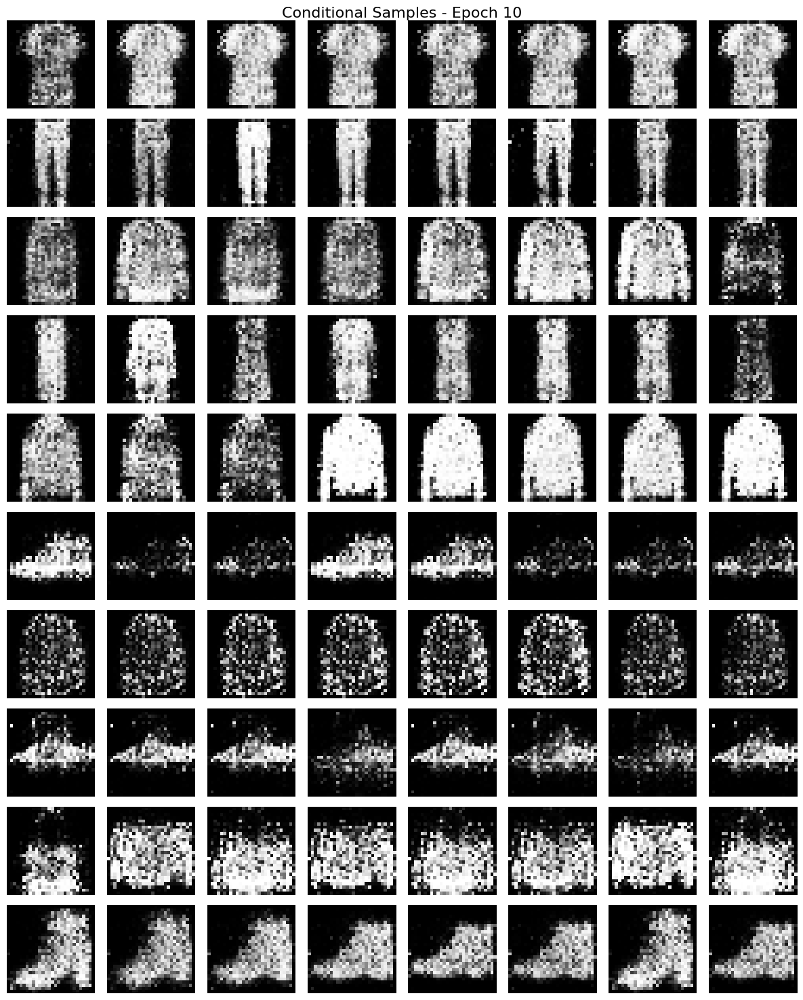

Epoch 11/50 | G_loss: 0.8273 | D_loss: 1.3446 | D(x): 0.527 | D(G(z)): 0.452
Epoch 12/50 | G_loss: 0.7689 | D_loss: 1.3578 | D(x): 0.517 | D(G(z)): 0.471
Epoch 13/50 | G_loss: 0.7566 | D_loss: 1.3625 | D(x): 0.514 | D(G(z)): 0.476
Epoch 14/50 | G_loss: 0.7506 | D_loss: 1.3617 | D(x): 0.513 | D(G(z)): 0.477
Epoch 15/50 | G_loss: 0.7428 | D_loss: 1.3647 | D(x): 0.512 | D(G(z)): 0.480
Epoch 16/50 | G_loss: 0.7501 | D_loss: 1.3651 | D(x): 0.511 | D(G(z)): 0.477
Epoch 17/50 | G_loss: 0.7624 | D_loss: 1.3595 | D(x): 0.513 | D(G(z)): 0.472
Epoch 18/50 | G_loss: 0.7542 | D_loss: 1.3658 | D(x): 0.511 | D(G(z)): 0.475
Epoch 19/50 | G_loss: 0.7579 | D_loss: 1.3652 | D(x): 0.511 | D(G(z)): 0.473
Epoch 20/50 | G_loss: 0.7629 | D_loss: 1.3648 | D(x): 0.512 | D(G(z)): 0.472


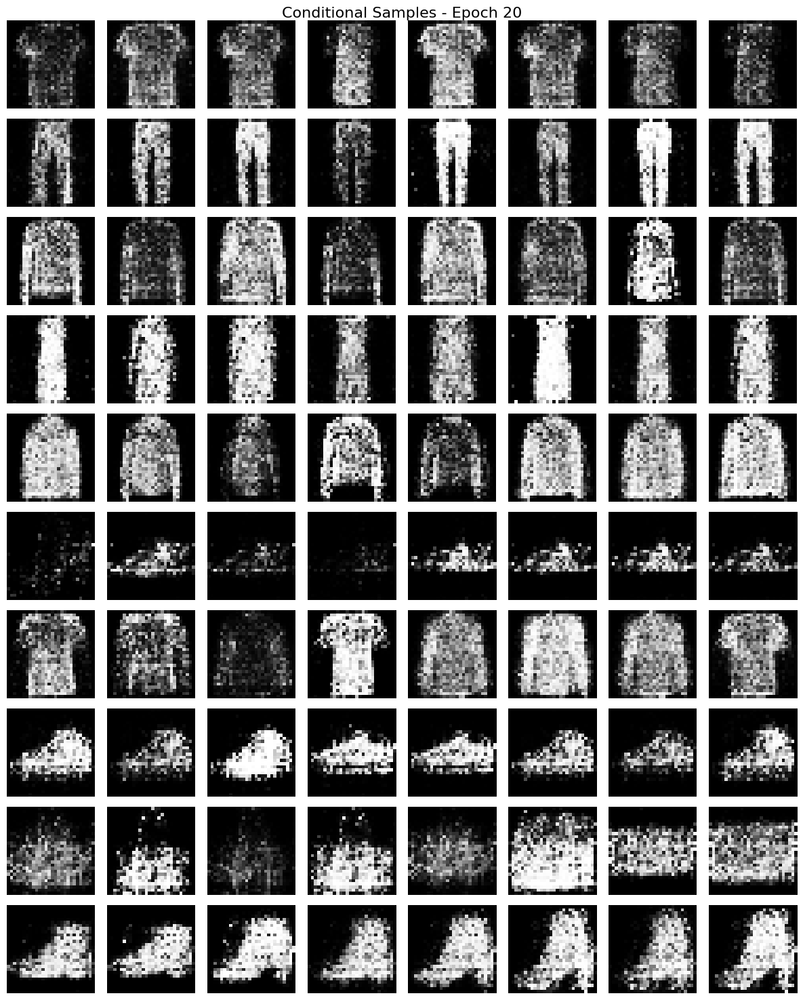

Epoch 21/50 | G_loss: 0.7513 | D_loss: 1.3708 | D(x): 0.509 | D(G(z)): 0.476
Epoch 22/50 | G_loss: 0.7443 | D_loss: 1.3739 | D(x): 0.507 | D(G(z)): 0.479
Epoch 23/50 | G_loss: 0.7383 | D_loss: 1.3732 | D(x): 0.508 | D(G(z)): 0.481
Epoch 24/50 | G_loss: 0.7381 | D_loss: 1.3737 | D(x): 0.507 | D(G(z)): 0.481
Epoch 25/50 | G_loss: 0.7396 | D_loss: 1.3743 | D(x): 0.507 | D(G(z)): 0.481
Epoch 26/50 | G_loss: 0.7374 | D_loss: 1.3742 | D(x): 0.507 | D(G(z)): 0.482
Epoch 27/50 | G_loss: 0.7306 | D_loss: 1.3776 | D(x): 0.505 | D(G(z)): 0.484
Epoch 28/50 | G_loss: 0.7358 | D_loss: 1.3750 | D(x): 0.506 | D(G(z)): 0.482
Epoch 29/50 | G_loss: 0.7385 | D_loss: 1.3746 | D(x): 0.507 | D(G(z)): 0.481
Epoch 30/50 | G_loss: 0.7338 | D_loss: 1.3756 | D(x): 0.506 | D(G(z)): 0.483


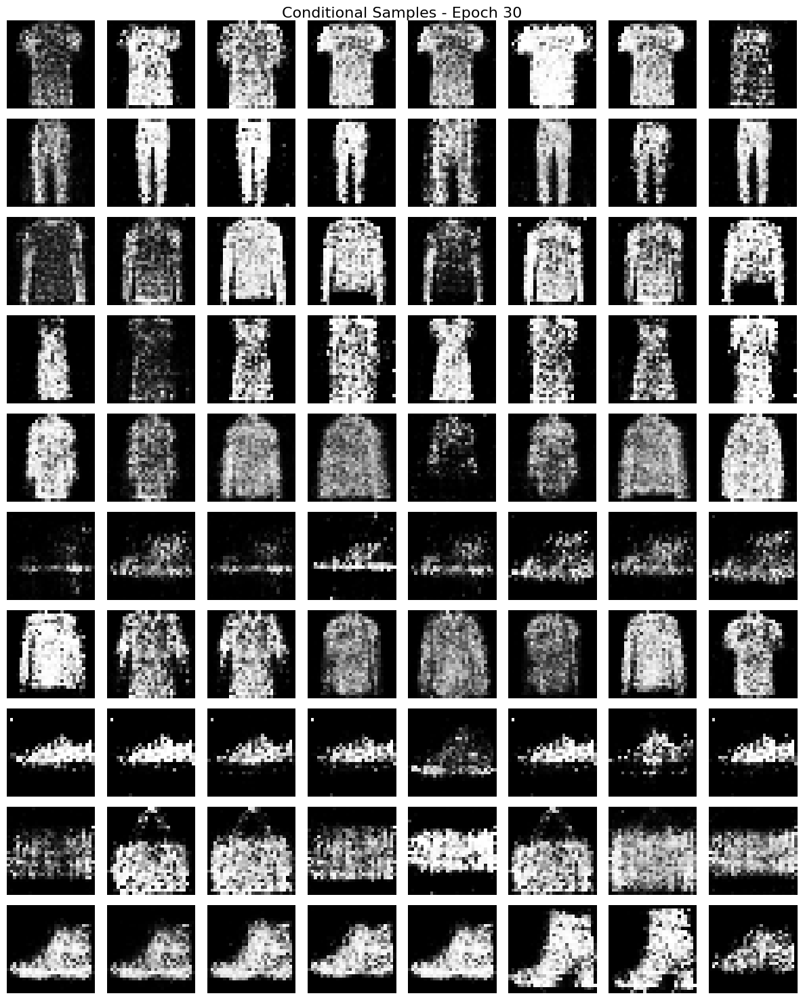

Epoch 31/50 | G_loss: 0.7349 | D_loss: 1.3739 | D(x): 0.507 | D(G(z)): 0.483
Epoch 32/50 | G_loss: 0.7326 | D_loss: 1.3755 | D(x): 0.506 | D(G(z)): 0.484
Epoch 33/50 | G_loss: 0.7257 | D_loss: 1.3778 | D(x): 0.505 | D(G(z)): 0.487
Epoch 34/50 | G_loss: 0.7269 | D_loss: 1.3758 | D(x): 0.506 | D(G(z)): 0.486
Epoch 35/50 | G_loss: 0.7286 | D_loss: 1.3768 | D(x): 0.506 | D(G(z)): 0.485
Epoch 36/50 | G_loss: 0.7246 | D_loss: 1.3778 | D(x): 0.505 | D(G(z)): 0.487
Epoch 37/50 | G_loss: 0.7275 | D_loss: 1.3759 | D(x): 0.506 | D(G(z)): 0.486
Epoch 38/50 | G_loss: 0.7288 | D_loss: 1.3754 | D(x): 0.506 | D(G(z)): 0.485
Epoch 39/50 | G_loss: 0.7242 | D_loss: 1.3760 | D(x): 0.506 | D(G(z)): 0.487
Epoch 40/50 | G_loss: 0.7209 | D_loss: 1.3787 | D(x): 0.505 | D(G(z)): 0.489


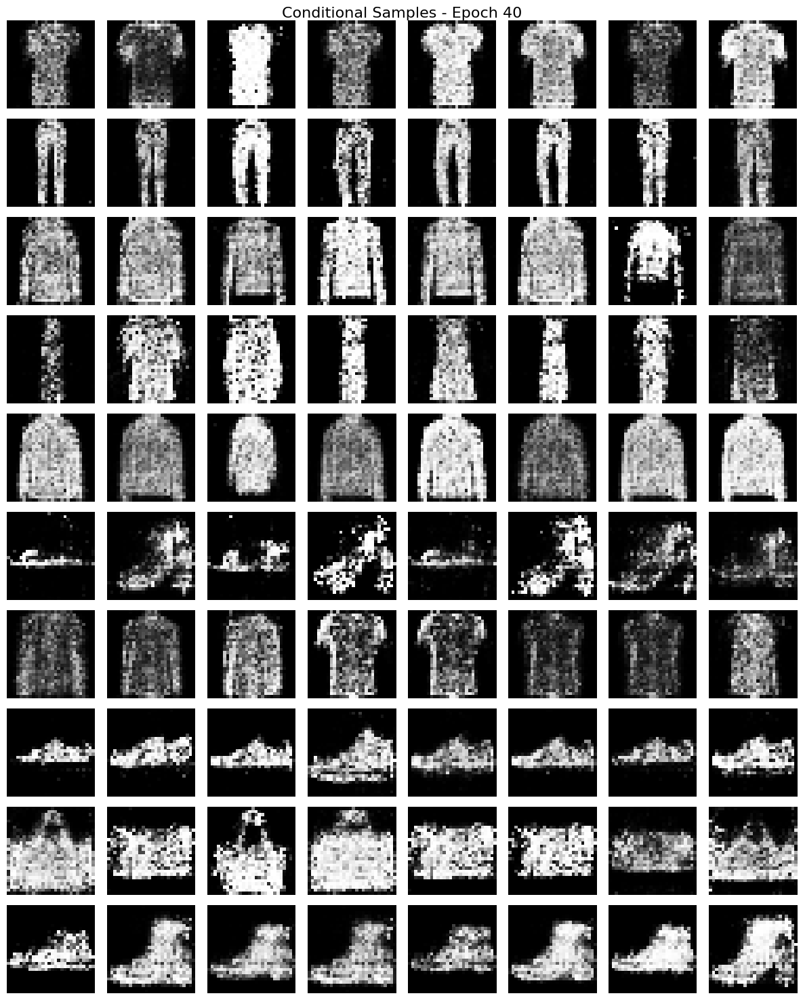

Epoch 41/50 | G_loss: 0.7233 | D_loss: 1.3755 | D(x): 0.506 | D(G(z)): 0.487
Epoch 42/50 | G_loss: 0.7293 | D_loss: 1.3750 | D(x): 0.506 | D(G(z)): 0.485
Epoch 43/50 | G_loss: 0.7278 | D_loss: 1.3742 | D(x): 0.506 | D(G(z)): 0.486
Epoch 44/50 | G_loss: 0.7259 | D_loss: 1.3776 | D(x): 0.505 | D(G(z)): 0.486
Epoch 45/50 | G_loss: 0.7194 | D_loss: 1.3781 | D(x): 0.505 | D(G(z)): 0.489
Epoch 46/50 | G_loss: 0.7216 | D_loss: 1.3774 | D(x): 0.505 | D(G(z)): 0.488
Epoch 47/50 | G_loss: 0.7220 | D_loss: 1.3768 | D(x): 0.505 | D(G(z)): 0.488
Epoch 48/50 | G_loss: 0.7239 | D_loss: 1.3758 | D(x): 0.506 | D(G(z)): 0.487
Epoch 49/50 | G_loss: 0.7214 | D_loss: 1.3775 | D(x): 0.505 | D(G(z)): 0.488
Epoch 50/50 | G_loss: 0.7206 | D_loss: 1.3777 | D(x): 0.505 | D(G(z)): 0.489


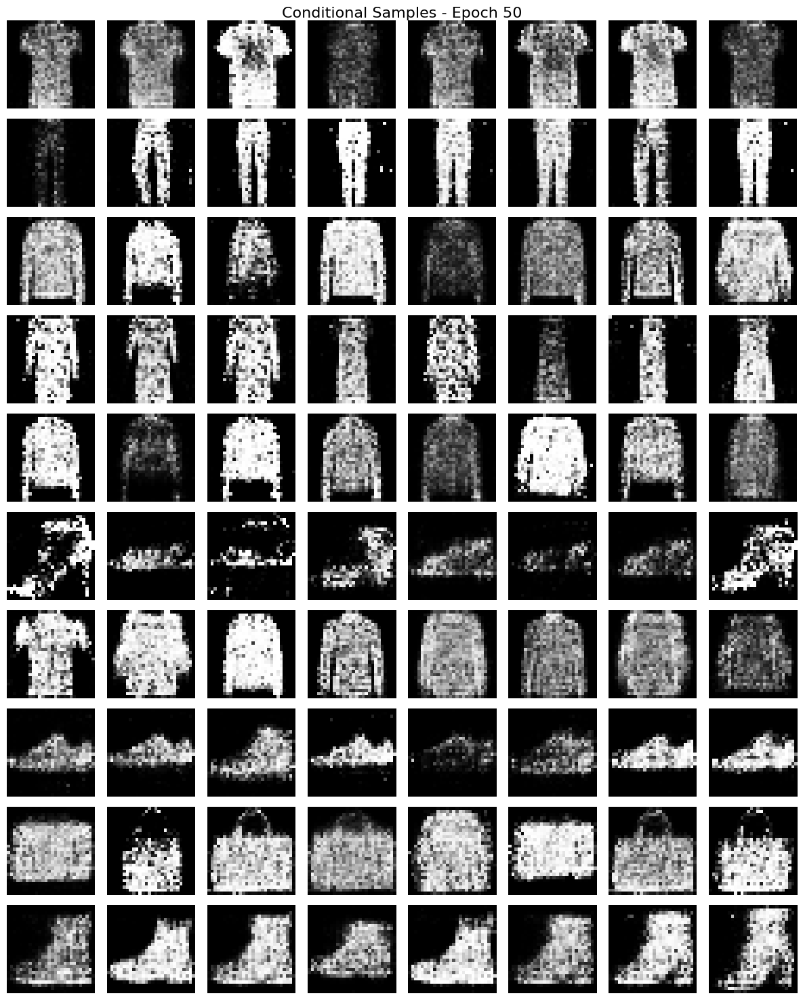


Training completed! Plotting results...



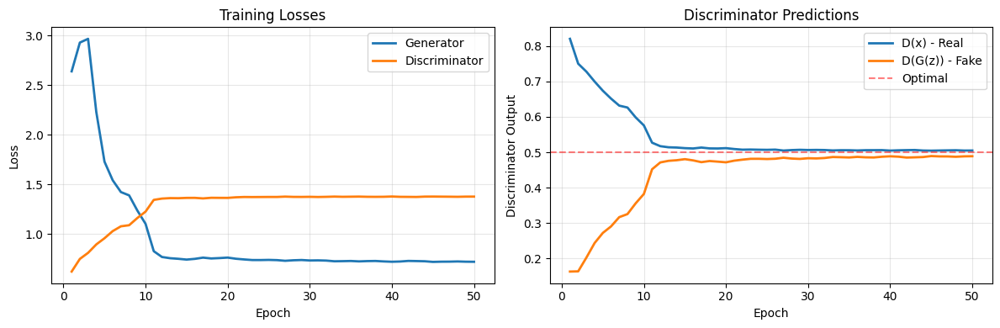

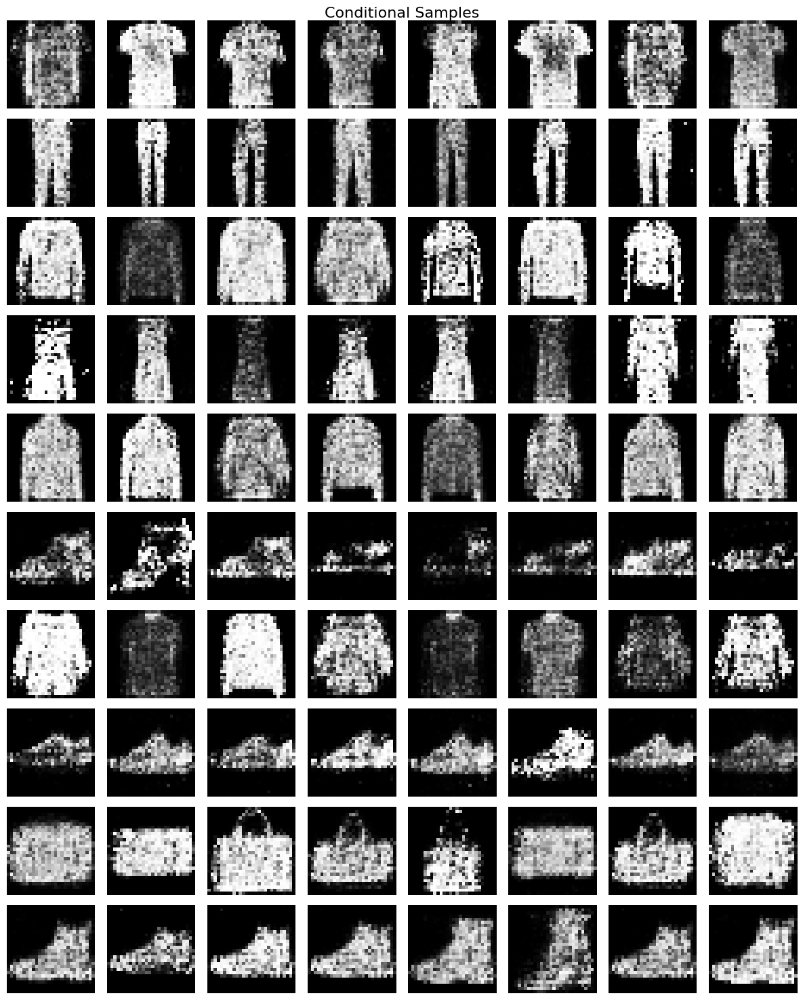

In [40]:
print("EXP 4: Vanilla Conditional GAN - Fashion-MNIST")
print("-"*50)
gen_vanilla_fashion, disc_vanilla_fashion, hist_vanilla_fashion = run_conditional_gan_experiment(
    dataset_name="fashion",
    architecture="vanilla",
    n_epochs=50,
    sample_interval=10)

EXP 5: PatchGAN - Fashion-MNIST
--------------------------------------------------
Conditional GAN - patchgan - FASHION
--------------------------------------------------


--- FASHION DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000

Generator parameters: 1,492,596
Discriminator parameters: 668,769

Starting training...

Epoch 1/50 | G_loss: 2.3500 | D_loss: 0.4374 | D(x): 0.845 | D(G(z)): 0.171


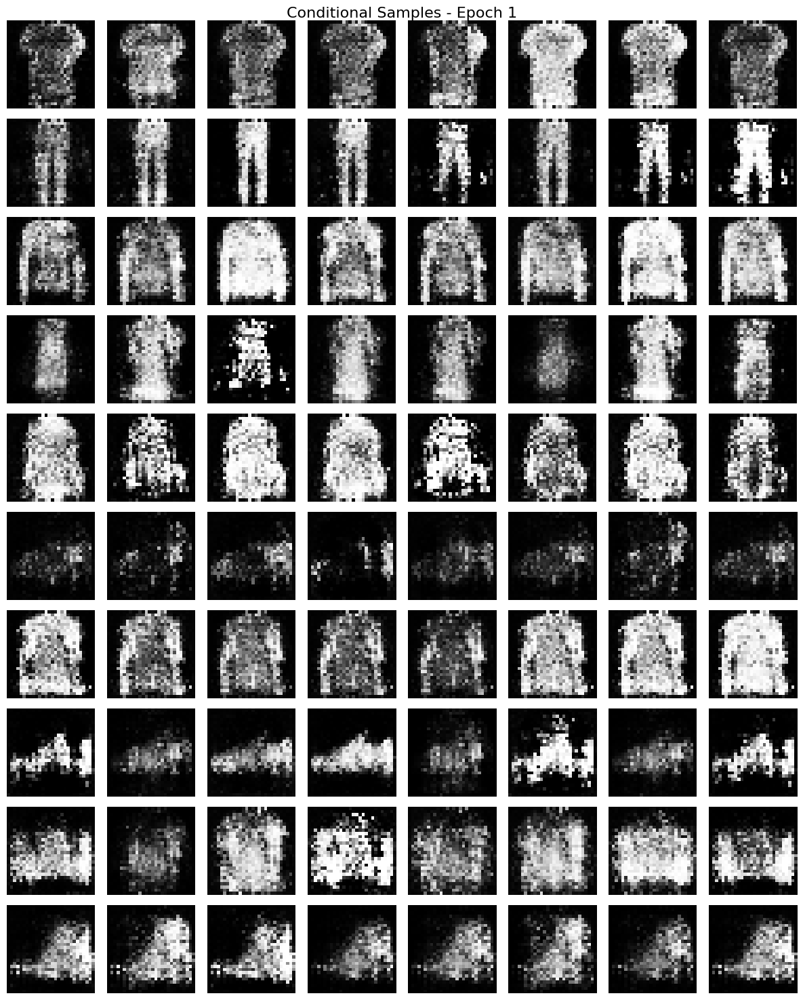

Epoch 2/50 | G_loss: 1.1752 | D_loss: 0.9740 | D(x): 0.635 | D(G(z)): 0.336
Epoch 3/50 | G_loss: 1.3069 | D_loss: 0.8972 | D(x): 0.653 | D(G(z)): 0.301
Epoch 4/50 | G_loss: 1.3613 | D_loss: 0.8651 | D(x): 0.666 | D(G(z)): 0.287
Epoch 5/50 | G_loss: 1.4309 | D_loss: 0.8260 | D(x): 0.677 | D(G(z)): 0.271
Epoch 6/50 | G_loss: 1.4616 | D_loss: 0.8169 | D(x): 0.682 | D(G(z)): 0.267
Epoch 7/50 | G_loss: 1.4575 | D_loss: 0.8162 | D(x): 0.683 | D(G(z)): 0.268
Epoch 8/50 | G_loss: 1.4810 | D_loss: 0.7931 | D(x): 0.690 | D(G(z)): 0.262
Epoch 9/50 | G_loss: 1.5234 | D_loss: 0.7814 | D(x): 0.696 | D(G(z)): 0.255
Epoch 10/50 | G_loss: 1.6039 | D_loss: 0.7428 | D(x): 0.708 | D(G(z)): 0.238


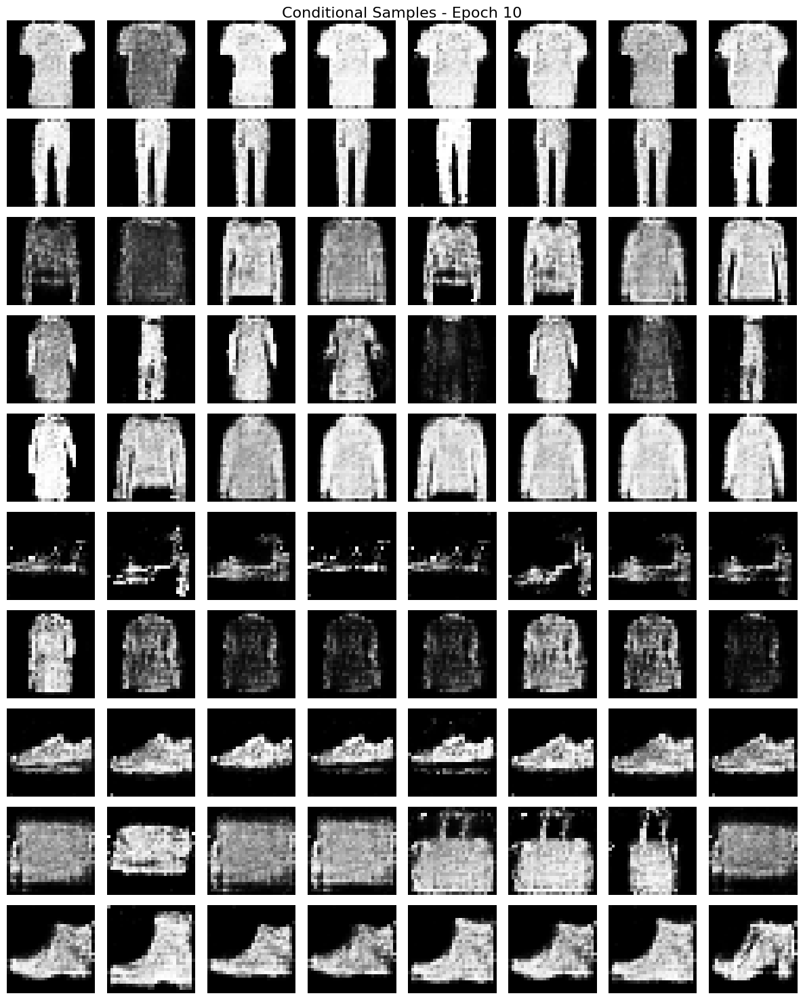

Epoch 11/50 | G_loss: 1.5574 | D_loss: 0.7548 | D(x): 0.705 | D(G(z)): 0.249
Epoch 12/50 | G_loss: 1.6462 | D_loss: 0.7217 | D(x): 0.716 | D(G(z)): 0.232
Epoch 13/50 | G_loss: 1.8281 | D_loss: 0.6338 | D(x): 0.746 | D(G(z)): 0.202
Epoch 14/50 | G_loss: 1.7757 | D_loss: 0.6626 | D(x): 0.737 | D(G(z)): 0.211
Epoch 15/50 | G_loss: 1.8986 | D_loss: 0.6124 | D(x): 0.752 | D(G(z)): 0.192
Epoch 16/50 | G_loss: 1.9261 | D_loss: 0.5959 | D(x): 0.757 | D(G(z)): 0.188
Epoch 17/50 | G_loss: 1.9656 | D_loss: 0.5636 | D(x): 0.770 | D(G(z)): 0.182
Epoch 18/50 | G_loss: 2.0880 | D_loss: 0.5376 | D(x): 0.783 | D(G(z)): 0.172
Epoch 19/50 | G_loss: 2.0404 | D_loss: 0.5565 | D(x): 0.777 | D(G(z)): 0.175
Epoch 20/50 | G_loss: 2.1308 | D_loss: 0.5133 | D(x): 0.789 | D(G(z)): 0.161


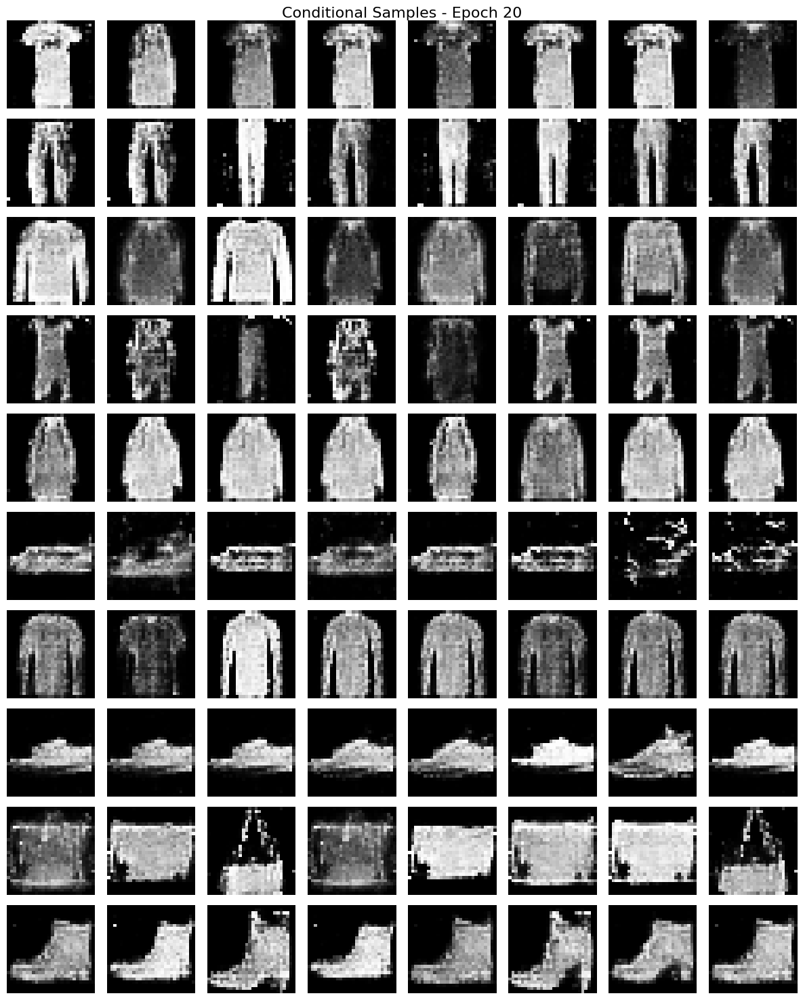

Epoch 21/50 | G_loss: 2.2326 | D_loss: 0.4941 | D(x): 0.796 | D(G(z)): 0.150
Epoch 22/50 | G_loss: 2.3593 | D_loss: 0.4419 | D(x): 0.825 | D(G(z)): 0.142
Epoch 23/50 | G_loss: 2.4622 | D_loss: 0.4225 | D(x): 0.823 | D(G(z)): 0.125
Epoch 24/50 | G_loss: 2.4100 | D_loss: 0.4688 | D(x): 0.805 | D(G(z)): 0.134
Epoch 25/50 | G_loss: 2.3881 | D_loss: 0.4491 | D(x): 0.811 | D(G(z)): 0.132
Epoch 26/50 | G_loss: 2.3812 | D_loss: 0.4523 | D(x): 0.823 | D(G(z)): 0.144
Epoch 27/50 | G_loss: 2.5095 | D_loss: 0.4205 | D(x): 0.823 | D(G(z)): 0.124
Epoch 28/50 | G_loss: 2.6841 | D_loss: 0.3760 | D(x): 0.842 | D(G(z)): 0.106
Epoch 29/50 | G_loss: 3.2324 | D_loss: 0.2399 | D(x): 0.895 | D(G(z)): 0.066
Epoch 30/50 | G_loss: 3.5162 | D_loss: 0.2407 | D(x): 0.899 | D(G(z)): 0.067


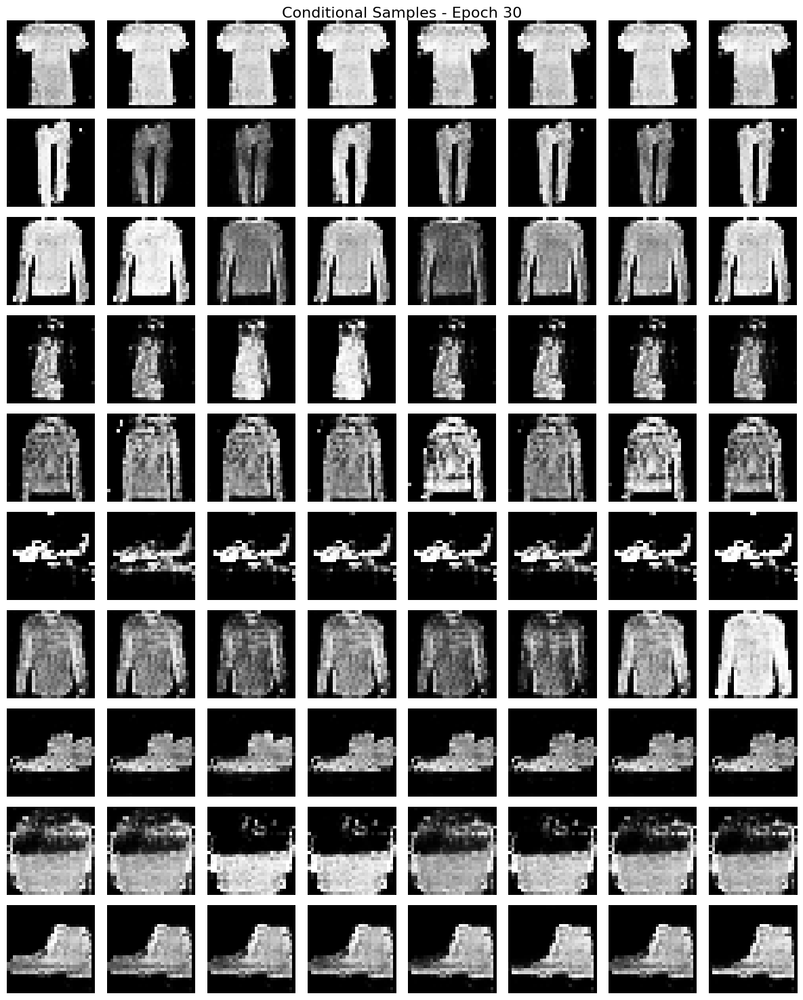

Epoch 31/50 | G_loss: 3.7756 | D_loss: 0.1893 | D(x): 0.915 | D(G(z)): 0.045
Epoch 32/50 | G_loss: 3.7732 | D_loss: 0.2157 | D(x): 0.918 | D(G(z)): 0.063
Epoch 33/50 | G_loss: 4.0068 | D_loss: 0.1641 | D(x): 0.935 | D(G(z)): 0.047
Epoch 34/50 | G_loss: 4.0232 | D_loss: 0.1605 | D(x): 0.932 | D(G(z)): 0.042
Epoch 35/50 | G_loss: 3.9241 | D_loss: 0.2144 | D(x): 0.908 | D(G(z)): 0.051
Epoch 36/50 | G_loss: 3.8271 | D_loss: 0.2087 | D(x): 0.917 | D(G(z)): 0.059
Epoch 37/50 | G_loss: 4.0441 | D_loss: 0.1531 | D(x): 0.942 | D(G(z)): 0.050
Epoch 38/50 | G_loss: 3.1703 | D_loss: 0.3579 | D(x): 0.858 | D(G(z)): 0.095
Epoch 39/50 | G_loss: 2.9221 | D_loss: 0.3614 | D(x): 0.864 | D(G(z)): 0.110
Epoch 40/50 | G_loss: 3.1115 | D_loss: 0.3462 | D(x): 0.857 | D(G(z)): 0.086


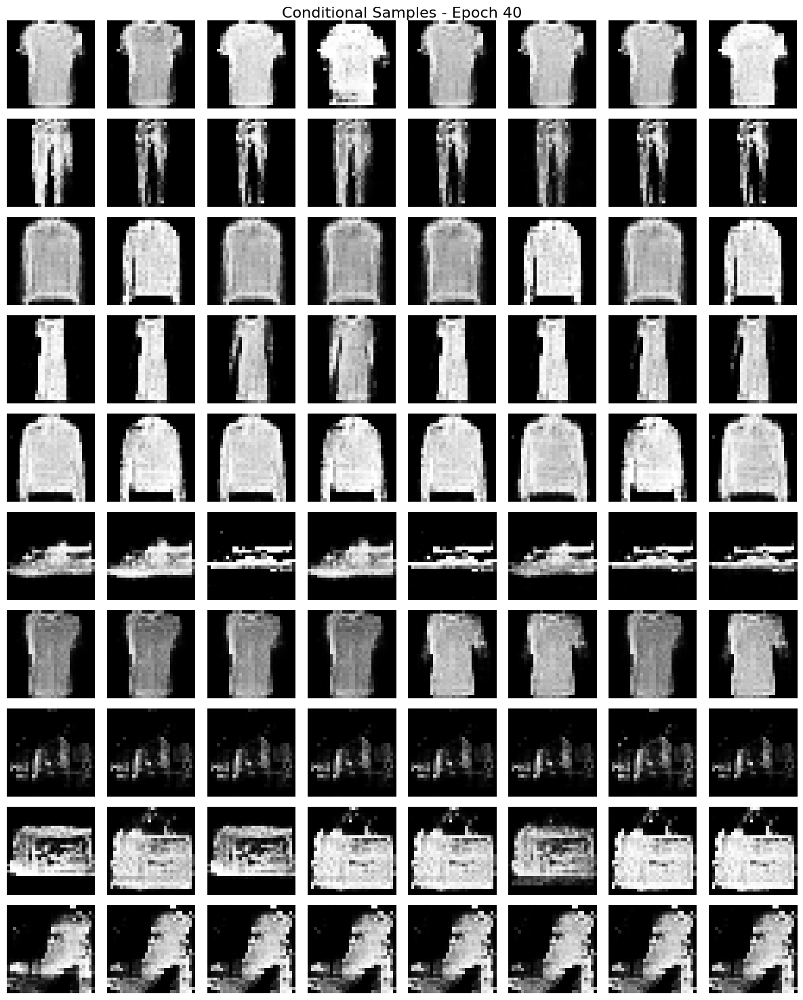

Epoch 41/50 | G_loss: 3.0056 | D_loss: 0.3589 | D(x): 0.845 | D(G(z)): 0.090
Epoch 42/50 | G_loss: 3.0574 | D_loss: 0.3284 | D(x): 0.867 | D(G(z)): 0.091
Epoch 43/50 | G_loss: 3.2772 | D_loss: 0.2920 | D(x): 0.881 | D(G(z)): 0.077
Epoch 44/50 | G_loss: 2.8681 | D_loss: 0.3814 | D(x): 0.839 | D(G(z)): 0.098
Epoch 45/50 | G_loss: 3.0134 | D_loss: 0.3286 | D(x): 0.859 | D(G(z)): 0.083
Epoch 46/50 | G_loss: 3.0767 | D_loss: 0.3158 | D(x): 0.865 | D(G(z)): 0.081
Epoch 47/50 | G_loss: 3.2284 | D_loss: 0.2920 | D(x): 0.875 | D(G(z)): 0.073
Epoch 48/50 | G_loss: 3.8001 | D_loss: 0.1904 | D(x): 0.912 | D(G(z)): 0.049
Epoch 49/50 | G_loss: 3.7052 | D_loss: 0.2155 | D(x): 0.906 | D(G(z)): 0.053
Epoch 50/50 | G_loss: 3.5910 | D_loss: 0.2296 | D(x): 0.905 | D(G(z)): 0.064


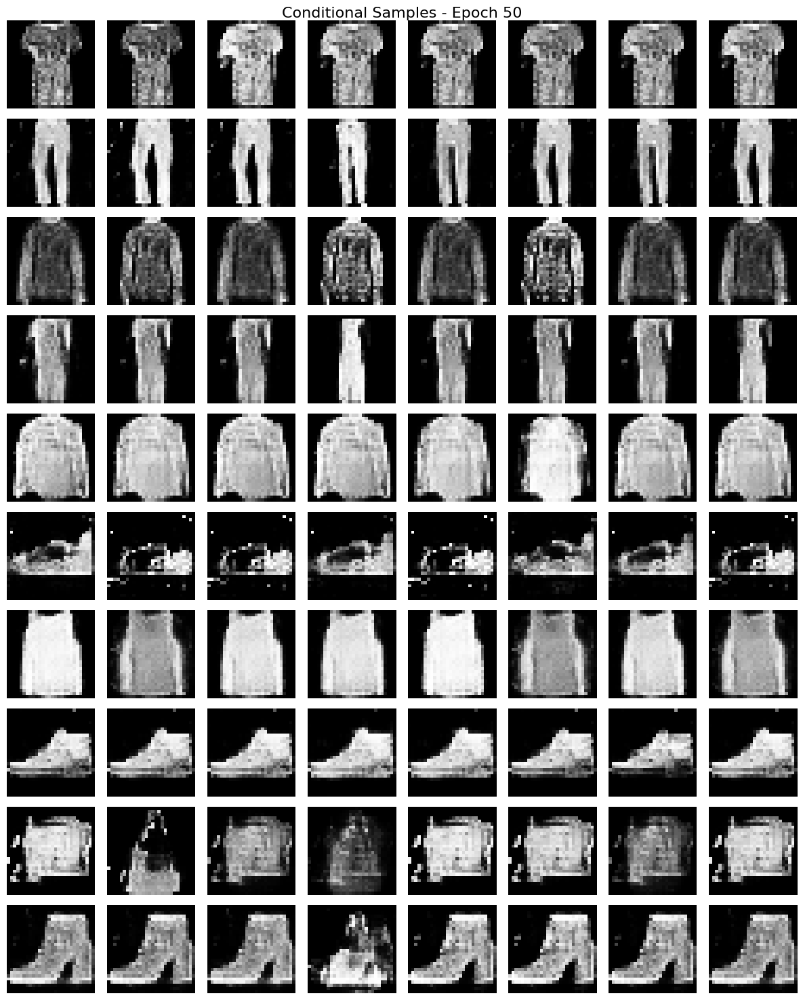


Training completed! Plotting results...



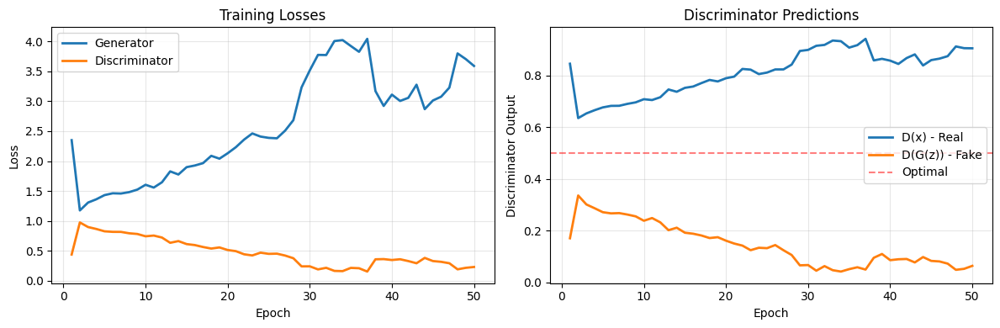

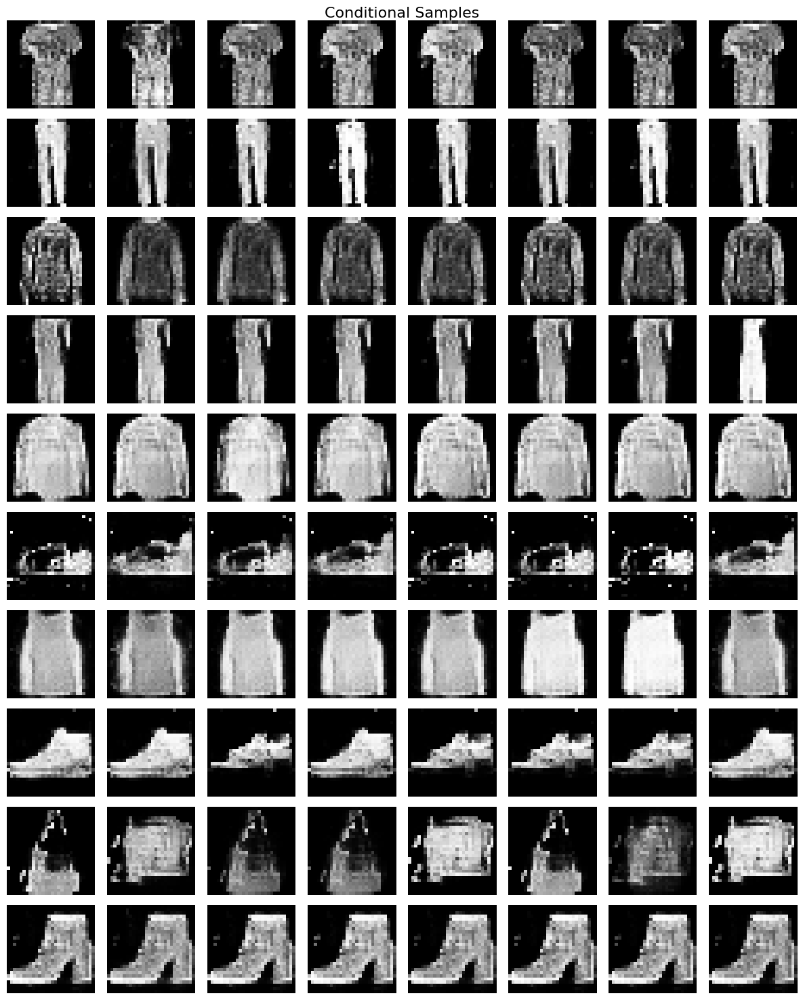

In [41]:
print("EXP 5: PatchGAN - Fashion-MNIST")
print("-"*50)
gen_patch_fashion, disc_patch_fashion, hist_patch_fashion = run_conditional_gan_experiment(
    dataset_name="fashion",
    architecture="patchgan",
    n_epochs=50,
    sample_interval=10)

EXP 6: Feature Matching - Fashion-MNIST
--------------------------------------------------
Conditional GAN - feature_matching - FASHION
--------------------------------------------------


--- FASHION DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000

Generator parameters: 1,492,596
Discriminator parameters: 538,725

Starting training...

Epoch 1/50 | G_loss: 2.6562 | D_loss: 0.7995 | D(x): 0.757 | D(G(z)): 0.201


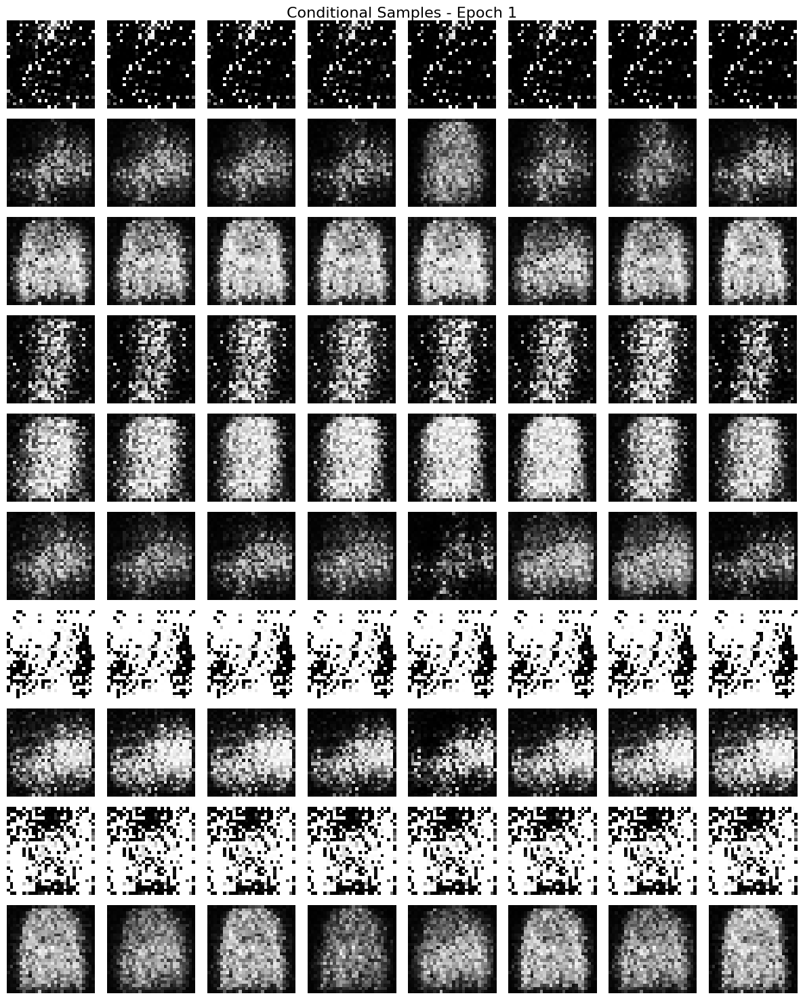

Epoch 2/50 | G_loss: 3.1605 | D_loss: 0.8321 | D(x): 0.716 | D(G(z)): 0.205
Epoch 3/50 | G_loss: 3.5383 | D_loss: 0.7805 | D(x): 0.737 | D(G(z)): 0.191
Epoch 4/50 | G_loss: 3.8505 | D_loss: 0.8586 | D(x): 0.708 | D(G(z)): 0.218
Epoch 5/50 | G_loss: 3.7307 | D_loss: 0.8292 | D(x): 0.721 | D(G(z)): 0.213
Epoch 6/50 | G_loss: 3.6132 | D_loss: 0.8350 | D(x): 0.722 | D(G(z)): 0.212
Epoch 7/50 | G_loss: 2.9414 | D_loss: 0.8835 | D(x): 0.703 | D(G(z)): 0.240
Epoch 8/50 | G_loss: 2.0321 | D_loss: 0.9571 | D(x): 0.678 | D(G(z)): 0.266
Epoch 9/50 | G_loss: 1.7159 | D_loss: 1.0715 | D(x): 0.636 | D(G(z)): 0.306
Epoch 10/50 | G_loss: 1.5469 | D_loss: 1.1182 | D(x): 0.616 | D(G(z)): 0.333


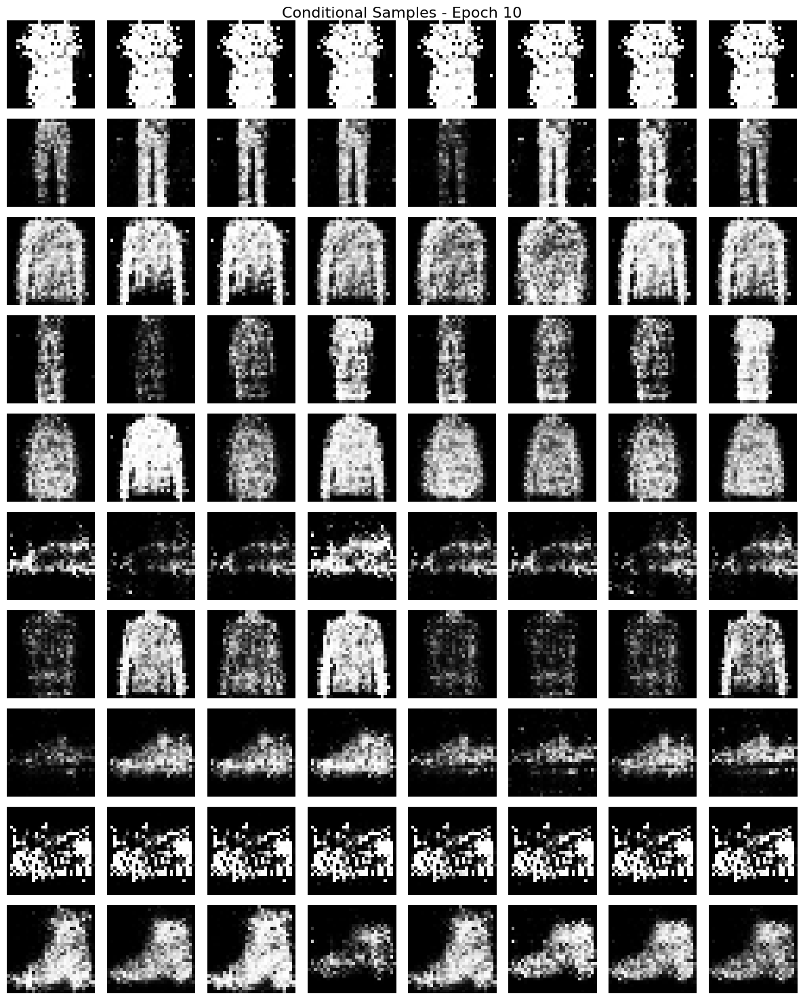

Epoch 11/50 | G_loss: 1.3476 | D_loss: 1.2074 | D(x): 0.583 | D(G(z)): 0.371
Epoch 12/50 | G_loss: 1.0861 | D_loss: 1.3091 | D(x): 0.542 | D(G(z)): 0.427
Epoch 13/50 | G_loss: 1.0101 | D_loss: 1.3235 | D(x): 0.531 | D(G(z)): 0.450
Epoch 14/50 | G_loss: 0.9507 | D_loss: 1.3483 | D(x): 0.520 | D(G(z)): 0.467
Epoch 15/50 | G_loss: 0.9582 | D_loss: 1.3444 | D(x): 0.520 | D(G(z)): 0.464
Epoch 16/50 | G_loss: 0.9242 | D_loss: 1.3590 | D(x): 0.514 | D(G(z)): 0.475
Epoch 17/50 | G_loss: 0.9251 | D_loss: 1.3612 | D(x): 0.514 | D(G(z)): 0.477
Epoch 18/50 | G_loss: 0.9171 | D_loss: 1.3671 | D(x): 0.510 | D(G(z)): 0.478
Epoch 19/50 | G_loss: 0.9177 | D_loss: 1.3657 | D(x): 0.511 | D(G(z)): 0.478
Epoch 20/50 | G_loss: 0.9196 | D_loss: 1.3656 | D(x): 0.510 | D(G(z)): 0.479


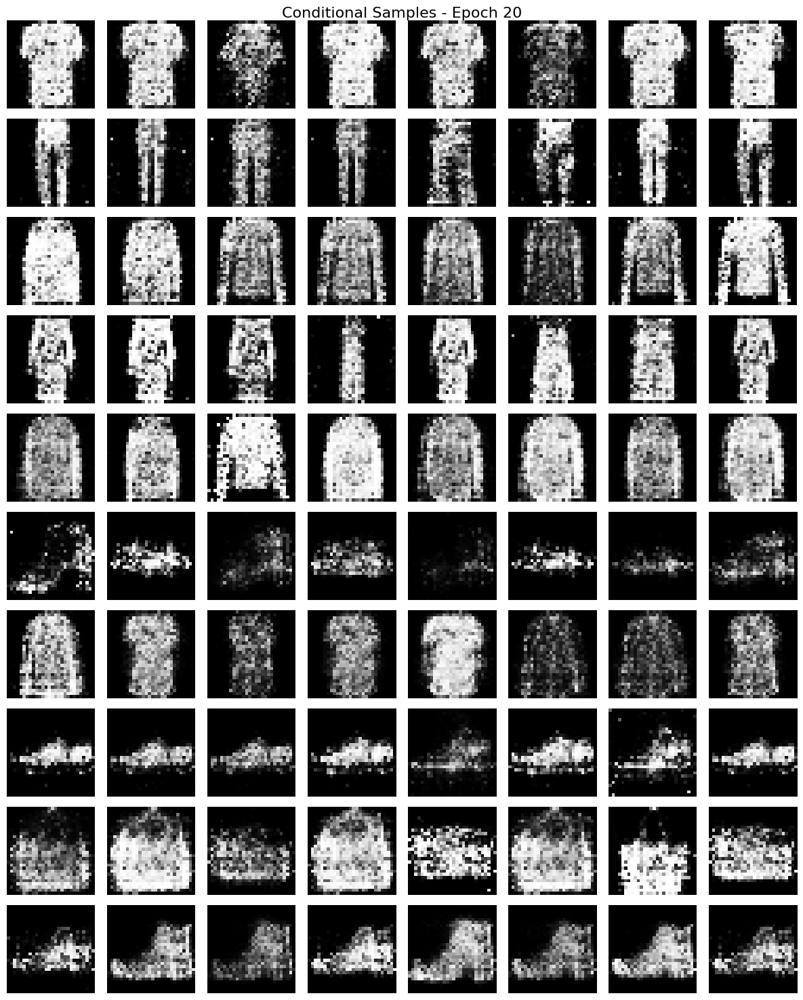

Epoch 21/50 | G_loss: 0.9362 | D_loss: 1.3638 | D(x): 0.512 | D(G(z)): 0.475
Epoch 22/50 | G_loss: 0.9264 | D_loss: 1.3697 | D(x): 0.510 | D(G(z)): 0.477
Epoch 23/50 | G_loss: 0.9413 | D_loss: 1.3637 | D(x): 0.512 | D(G(z)): 0.473
Epoch 24/50 | G_loss: 0.9360 | D_loss: 1.3671 | D(x): 0.511 | D(G(z)): 0.476
Epoch 25/50 | G_loss: 0.9495 | D_loss: 1.3680 | D(x): 0.510 | D(G(z)): 0.474
Epoch 26/50 | G_loss: 0.9484 | D_loss: 1.3669 | D(x): 0.511 | D(G(z)): 0.475
Epoch 27/50 | G_loss: 0.9471 | D_loss: 1.3685 | D(x): 0.510 | D(G(z)): 0.478
Epoch 28/50 | G_loss: 0.9541 | D_loss: 1.3668 | D(x): 0.511 | D(G(z)): 0.477
Epoch 29/50 | G_loss: 0.9612 | D_loss: 1.3653 | D(x): 0.511 | D(G(z)): 0.474
Epoch 30/50 | G_loss: 0.9502 | D_loss: 1.3704 | D(x): 0.509 | D(G(z)): 0.480


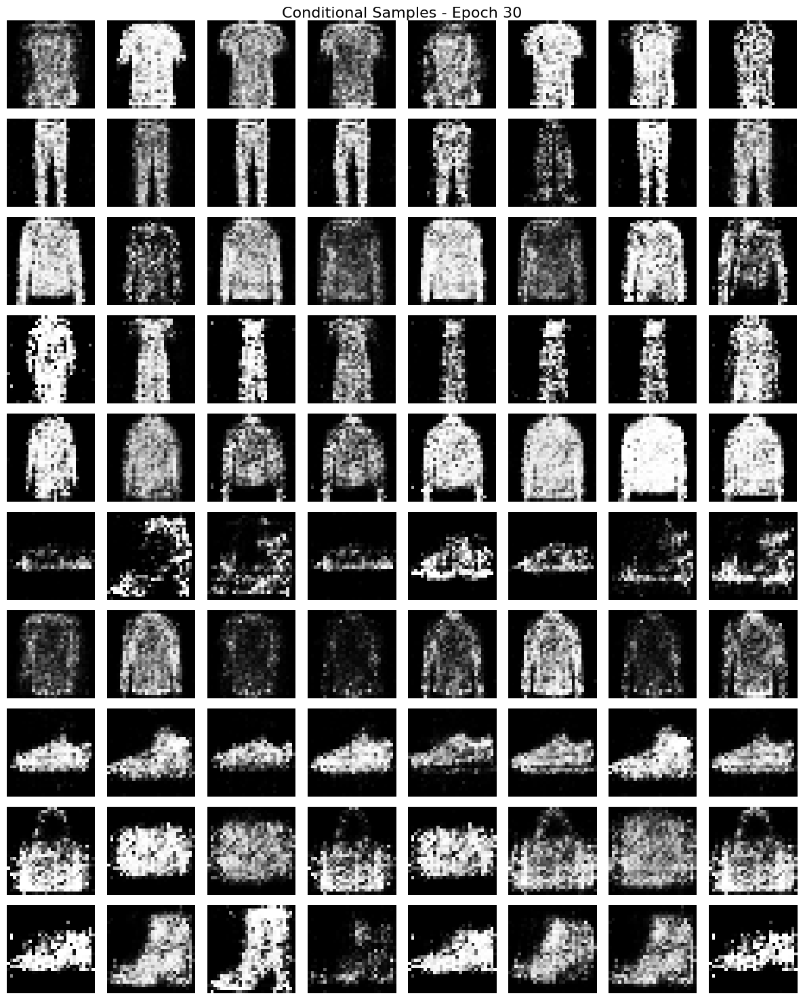

Epoch 31/50 | G_loss: 0.9491 | D_loss: 1.3743 | D(x): 0.508 | D(G(z)): 0.483
Epoch 32/50 | G_loss: 0.9508 | D_loss: 1.3711 | D(x): 0.508 | D(G(z)): 0.482
Epoch 33/50 | G_loss: 0.9532 | D_loss: 1.3722 | D(x): 0.508 | D(G(z)): 0.482
Epoch 34/50 | G_loss: 0.9620 | D_loss: 1.3710 | D(x): 0.509 | D(G(z)): 0.481
Epoch 35/50 | G_loss: 0.9585 | D_loss: 1.3720 | D(x): 0.508 | D(G(z)): 0.483
Epoch 36/50 | G_loss: 0.9604 | D_loss: 1.3727 | D(x): 0.507 | D(G(z)): 0.484
Epoch 37/50 | G_loss: 0.9661 | D_loss: 1.3729 | D(x): 0.508 | D(G(z)): 0.483
Epoch 38/50 | G_loss: 0.9681 | D_loss: 1.3719 | D(x): 0.508 | D(G(z)): 0.483
Epoch 39/50 | G_loss: 0.9730 | D_loss: 1.3725 | D(x): 0.508 | D(G(z)): 0.484
Epoch 40/50 | G_loss: 0.9717 | D_loss: 1.3746 | D(x): 0.507 | D(G(z)): 0.486


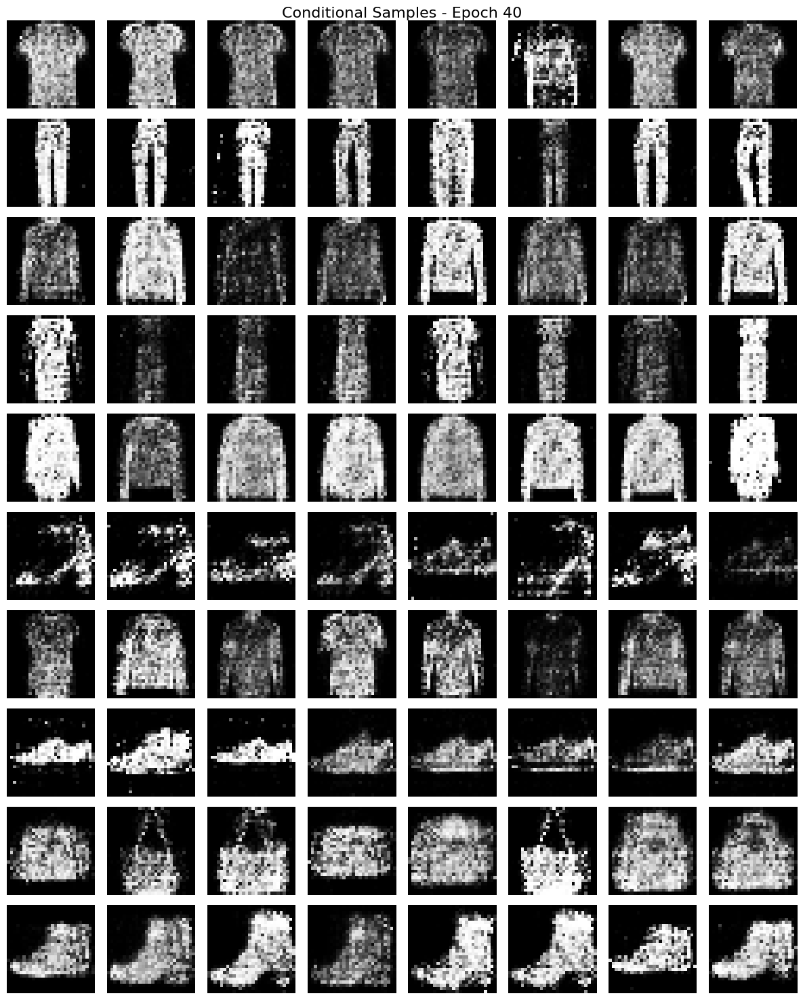

Epoch 41/50 | G_loss: 0.9774 | D_loss: 1.3735 | D(x): 0.507 | D(G(z)): 0.485
Epoch 42/50 | G_loss: 0.9793 | D_loss: 1.3730 | D(x): 0.507 | D(G(z)): 0.485
Epoch 43/50 | G_loss: 0.9865 | D_loss: 1.3710 | D(x): 0.508 | D(G(z)): 0.484
Epoch 44/50 | G_loss: 0.9933 | D_loss: 1.3728 | D(x): 0.507 | D(G(z)): 0.484
Epoch 45/50 | G_loss: 0.9919 | D_loss: 1.3742 | D(x): 0.507 | D(G(z)): 0.486
Epoch 46/50 | G_loss: 1.0013 | D_loss: 1.3696 | D(x): 0.509 | D(G(z)): 0.484
Epoch 47/50 | G_loss: 1.0098 | D_loss: 1.3727 | D(x): 0.507 | D(G(z)): 0.485
Epoch 48/50 | G_loss: 1.0070 | D_loss: 1.3701 | D(x): 0.508 | D(G(z)): 0.484
Epoch 49/50 | G_loss: 1.0157 | D_loss: 1.3696 | D(x): 0.508 | D(G(z)): 0.484
Epoch 50/50 | G_loss: 1.0241 | D_loss: 1.3693 | D(x): 0.509 | D(G(z)): 0.483


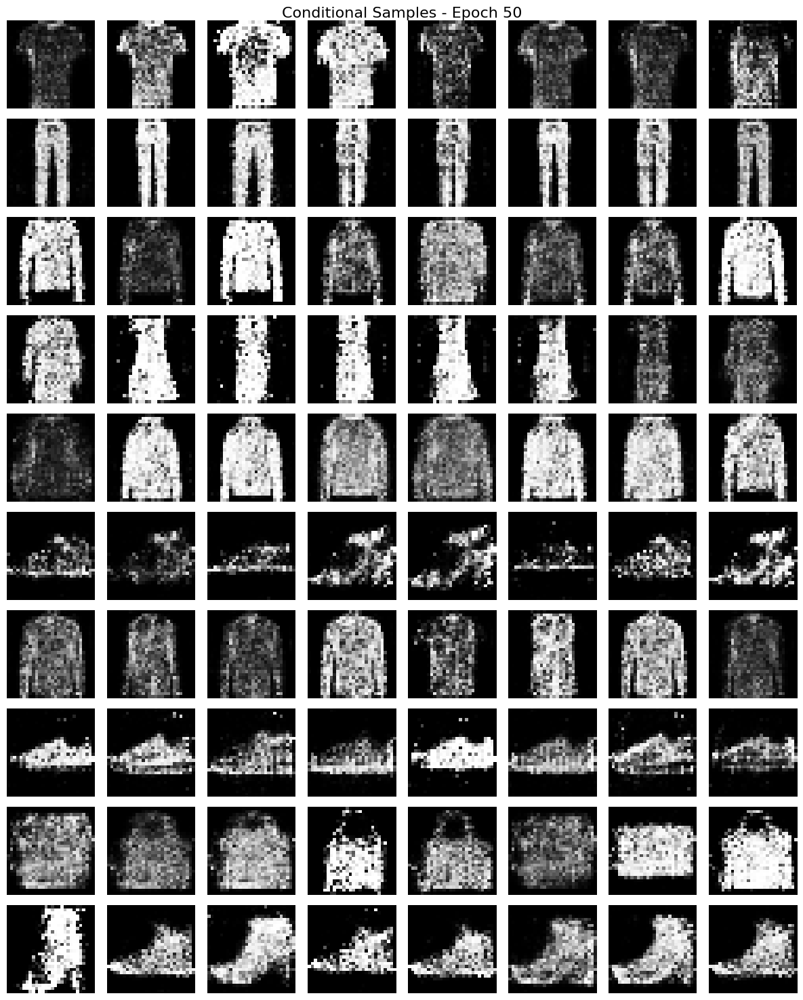


Training completed! Plotting results...



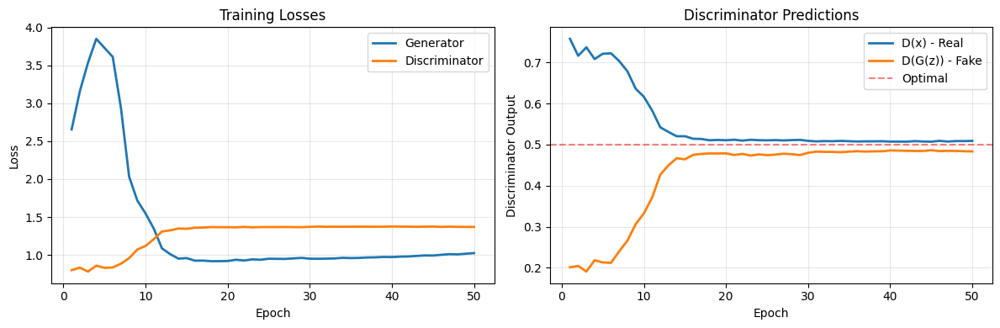

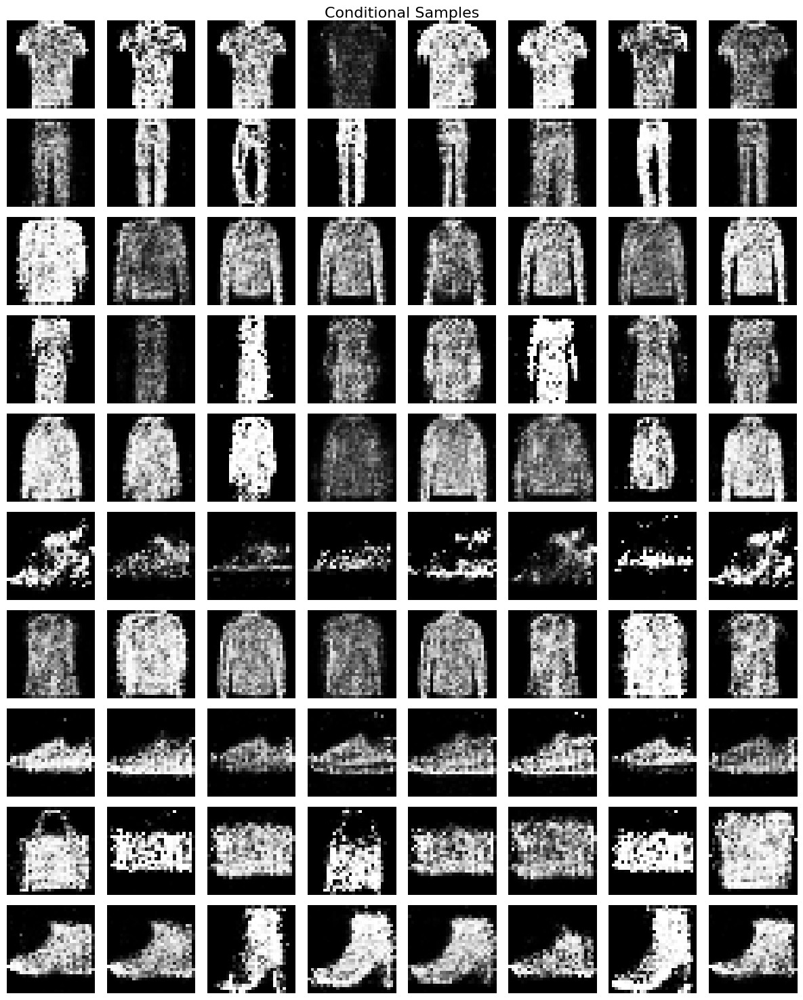

In [42]:
print("EXP 6: Feature Matching - Fashion-MNIST")
print("-"*50)
gen_fm_fashion, disc_fm_fashion, hist_fm_fashion = run_conditional_gan_experiment(
    dataset_name="fashion",
    architecture="feature_matching",
    n_epochs=50,
    sample_interval=10)

Comparison of All Architectures - MNIST
----------------------------------------------------------------------


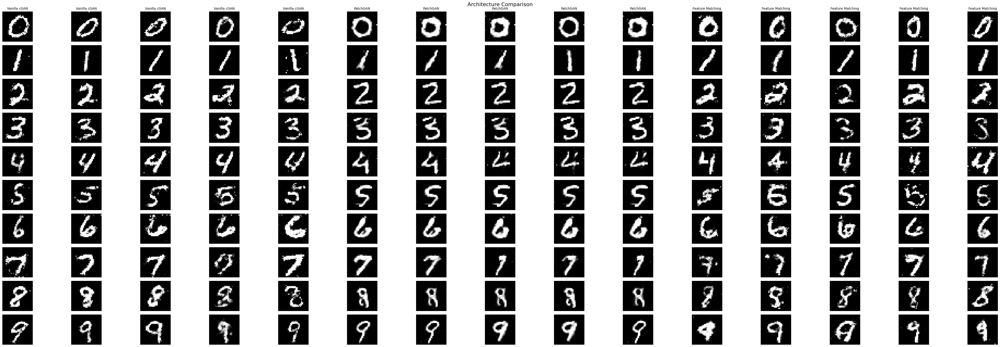

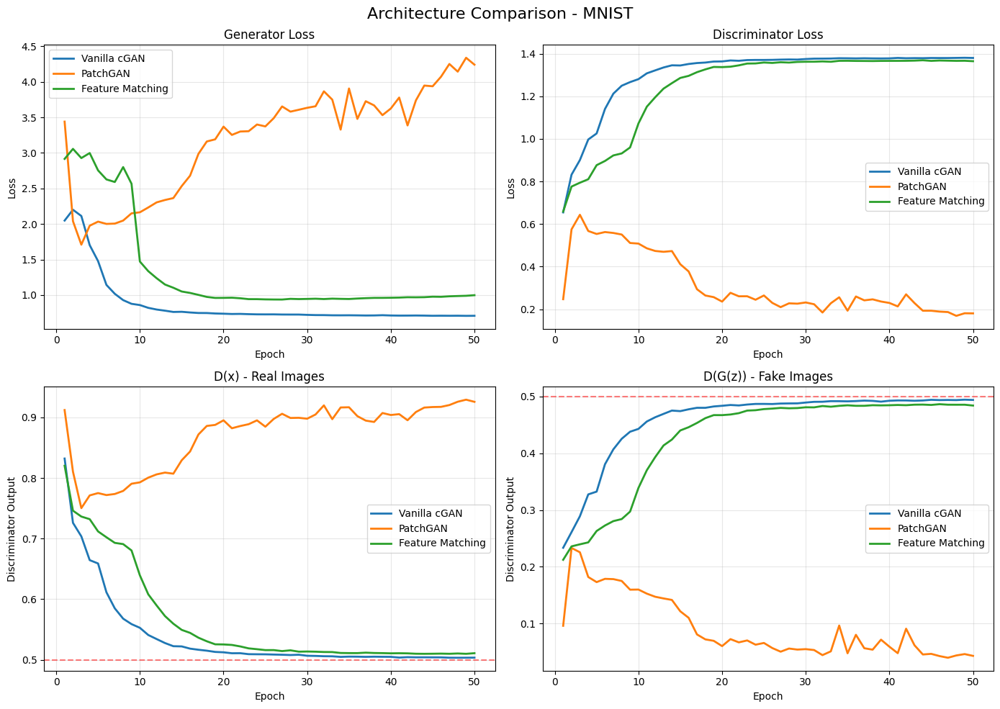

Comparison of All Architectures - Fashion-MNIST
----------------------------------------------------------------------


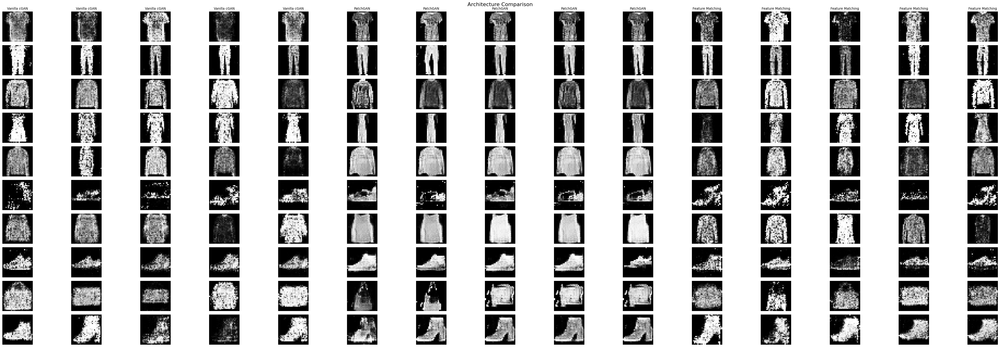

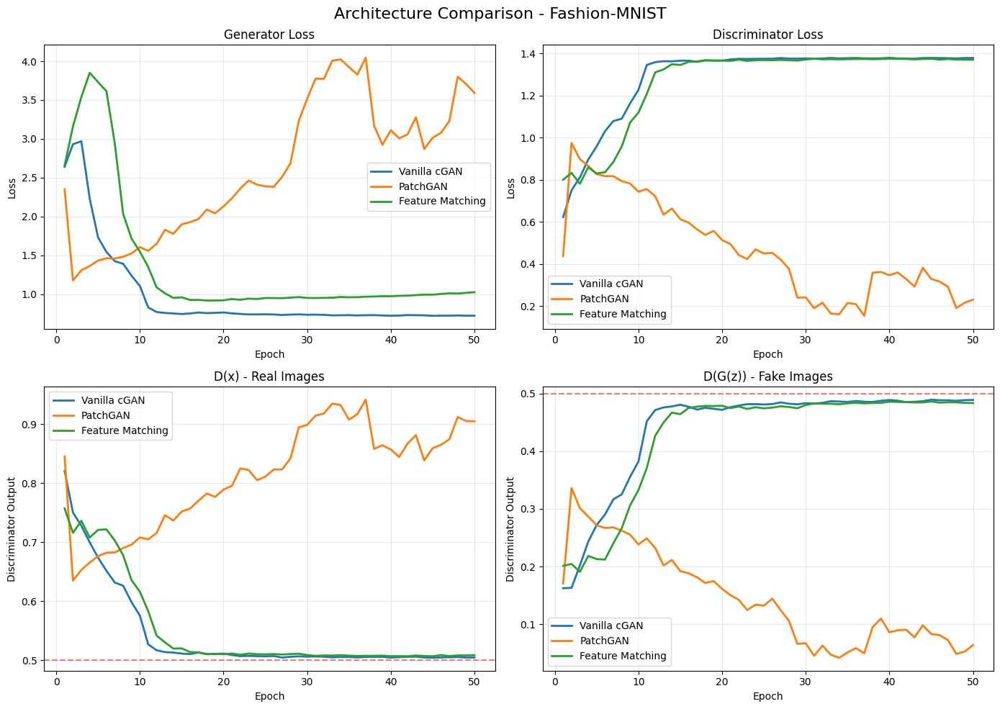

In [43]:
print("Comparison of All Architectures - MNIST")
print("-"*70)

compare_architectures({
    "Vanilla cGAN": gen_vanilla_mnist,
    "PatchGAN": gen_patch_mnist,
    "Feature Matching": gen_fm_mnist
}, n_classes=10, samples_per_class=5, device="cuda")

plot_architecture_comparison({
    "Vanilla cGAN": hist_vanilla_mnist,
    "PatchGAN": hist_patch_mnist,
    "Feature Matching": hist_fm_mnist
}, "Architecture Comparison - MNIST")

print("Comparison of All Architectures - Fashion-MNIST")
print("-"*70)

compare_architectures({
    "Vanilla cGAN": gen_vanilla_fashion,
    "PatchGAN": gen_patch_fashion,
    "Feature Matching": gen_fm_fashion
}, n_classes=10, samples_per_class=5, device="cuda")

plot_architecture_comparison({
    "Vanilla cGAN": hist_vanilla_fashion,
    "PatchGAN": hist_patch_fashion,
    "Feature Matching": hist_fm_fashion
}, "Architecture Comparison - Fashion-MNIST")

# Progressive Growing GAN

## Data Preparing

In [51]:
def get_cifar10_loaders(data_root: str = "./data", batch_size: int = 64, val_split: float = 0.1, resolution: int = 32):
  transform = transforms.Compose([
      transforms.Resize(resolution),
      transforms.ToTensor(),
      transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])  # [-1, 1]

  full_train = datasets.CIFAR10(
      root=data_root,
      train=True,
      download=True,
      transform=transform)

  test_ds = datasets.CIFAR10(
      root=data_root,
      train=False,
      download=True,
      transform=transform)

  n_total = len(full_train)
  n_val = int(n_total * val_split)
  n_train = n_total - n_val

  print(f"\n--- CIFAR-10 DATASET (Resolution: {resolution}x{resolution}) ---")
  print(f"Total train images: {n_total}")
  print(f"  Train split:      {n_train}")
  print(f"  Validation split: {n_val}")
  print(f"Test set size:      {len(test_ds)}\n")

  train_ds, val_ds = torch.utils.data.random_split(
      full_train,
      [n_train, n_val],
      generator=torch.Generator().manual_seed(42))

  train_loader = DataLoader(
      train_ds,
      batch_size=batch_size,
      shuffle=True,
      num_workers=2,
      pin_memory=True)

  val_loader = DataLoader(
      val_ds,
      batch_size=batch_size,
      shuffle=False,
      num_workers=2,
      pin_memory=True)

  test_loader = DataLoader(
      test_ds,
      batch_size=batch_size,
      shuffle=False,
      num_workers=2,
      pin_memory=True)

  return train_loader, val_loader, test_loader


def show_cifar_samples(loader, title: str):
  x, y = next(iter(loader))
  x = x[:8]
  y = y[:8]

  class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
                  'dog', 'frog', 'horse', 'ship', 'truck']

  fig, axes = plt.subplots(2, 4, figsize=(12, 6))
  axes = axes.flatten()
  fig.suptitle(title)

  for i in range(8):
    img = x[i].permute(1, 2, 0).cpu().numpy()
    img = img * 0.5 + 0.5  # Denormalize
    img = np.clip(img, 0, 1)
    axes[i].imshow(img)
    axes[i].set_title(f"{class_names[y[i].item()]}")
    axes[i].axis("off")

  plt.tight_layout()
  plt.show()

## Technical Blocks

In [52]:
class PixelNorm(nn.Module):
  """Pixel-wise feature vector normalization"""
  def __init__(self):
    super().__init__()
    self.eps = 1e-8

  def forward(self, x):
    return x / torch.sqrt(torch.mean(x ** 2, dim=1, keepdim=True) + self.eps)

class MinibatchStdDev(nn.Module):
  """Minibatch standard deviation layer for discriminator"""
  def __init__(self):
    super().__init__()

  def forward(self, x):
    batch_size, _, height, width = x.shape
    # std across batch
    std = torch.sqrt(x.var(dim=0, unbiased=False) + 1e-8)
    # std across all features and spatial locations
    mean_std = std.mean().expand(batch_size, 1, height, width)

    return torch.cat([x, mean_std], dim=1)

class EqualizedConv2d(nn.Module):
  """Convolution with equalized learning rate"""
  def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
    super().__init__()
    self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
    self.scale = (2 / (in_channels * kernel_size ** 2)) ** 0.5
    self.bias = self.conv.bias
    self.conv.bias = None

    nn.init.normal_(self.conv.weight)
    nn.init.zeros_(self.bias)

  def forward(self, x):
    return self.conv(x * self.scale) + self.bias.view(1, -1, 1, 1)

class EqualizedLinear(nn.Module):
  """Linear layer with equalized learning rate"""
  def __init__(self, in_features, out_features):
    super().__init__()
    self.linear = nn.Linear(in_features, out_features)
    self.scale = (2 / in_features) ** 0.5
    self.bias = self.linear.bias
    self.linear.bias = None

    nn.init.normal_(self.linear.weight)
    nn.init.zeros_(self.bias)

  def forward(self, x):
    return self.linear(x * self.scale) + self.bias

## Architecture

In [60]:
# ============================================================================
# COMPLETELY FIXED PROGRESSIVE DISCRIMINATOR
# ============================================================================

class ProgressiveDiscriminator(Discriminator):
    def __init__(self, max_resolution: int = 32):
        super().__init__((3, max_resolution, max_resolution))
        self.max_resolution = max_resolution
        self.current_resolution = 4
        self.alpha = 1.0

        # Channel progression: matches generator
        # 4x4: 512, 8x8: 512, 16x16: 256, 32x32: 128

        # RGB input layers - all take 3 channels (RGB)
        self.from_rgb = nn.ModuleDict({
            '4': EqualizedConv2d(3, 512, 1),
            '8': EqualizedConv2d(3, 512, 1),
            '16': EqualizedConv2d(3, 256, 1),
            '32': EqualizedConv2d(3, 128, 1),
        })

        # Progressive blocks going DOWN in resolution
        # Each block takes input at higher res and outputs at lower res
        self.blocks = nn.ModuleDict({
            '8': self._make_discriminator_block(512, 512),   # 8x8 -> 4x4
            '16': self._make_discriminator_block(256, 512),  # 16x16 -> 8x8
            '32': self._make_discriminator_block(128, 256),  # 32x32 -> 16x16
        })

        # Final 4x4 block with minibatch std
        self.final = nn.Sequential(
            MinibatchStdDev(),
            EqualizedConv2d(512 + 1, 512, 3, padding=1),
            nn.LeakyReLU(0.2),
            nn.Flatten(),
            EqualizedLinear(512 * 4 * 4, 512),
            nn.LeakyReLU(0.2),
            EqualizedLinear(512, 1),
            nn.Sigmoid()
        )

    def _make_discriminator_block(self, in_channels, out_channels):
        return nn.Sequential(
            EqualizedConv2d(in_channels, in_channels, 3, padding=1),
            nn.LeakyReLU(0.2),
            EqualizedConv2d(in_channels, out_channels, 3, padding=1),
            nn.LeakyReLU(0.2),
            nn.AvgPool2d(2)
        )

    def forward(self, img: torch.Tensor) -> torch.Tensor:
        res_str = str(self.current_resolution)

        if self.current_resolution == 4:
            # Base case: 4x4
            x = self.from_rgb['4'](img)
            x = nn.functional.leaky_relu(x, 0.2)
            return self.final(x)

        # Fade-in logic
        # New path: from_rgb at current res -> block down
        x_new = self.from_rgb[res_str](img)
        x_new = nn.functional.leaky_relu(x_new, 0.2)
        x_new = self.blocks[res_str](x_new)

        # Old path: downsample image -> from_rgb at lower res
        img_down = nn.functional.avg_pool2d(img, 2)
        lower_res = self.current_resolution // 2
        x_old = self.from_rgb[str(lower_res)](img_down)
        x_old = nn.functional.leaky_relu(x_old, 0.2)

        # Blend
        x = self.alpha * x_new + (1 - self.alpha) * x_old

        # Continue down the pyramid
        current = lower_res
        while current > 4:
            x = self.blocks[str(current)](x)
            current = current // 2

        return self.final(x)

    def grow(self):
        """Grow to next resolution"""
        if self.current_resolution < self.max_resolution:
            self.current_resolution *= 2
            self.alpha = 0.0
            print(f"Discriminator grew to {self.current_resolution}x{self.current_resolution}")


# ============================================================================
# FIXED PROGRESSIVE GENERATOR TO MATCH
# ============================================================================

class ProgressiveGenerator(Generator):
    def __init__(self, latent_dim: int = 512, max_resolution: int = 32):
        super().__init__(latent_dim, (3, max_resolution, max_resolution))
        self.max_resolution = max_resolution
        self.current_resolution = 4
        self.alpha = 1.0

        # Initial 4x4 block
        self.initial = nn.Sequential(
            PixelNorm(),
            EqualizedLinear(latent_dim, 512 * 4 * 4),
            nn.LeakyReLU(0.2),
            nn.Unflatten(1, (512, 4, 4)),
            PixelNorm(),
            EqualizedConv2d(512, 512, 3, padding=1),
            nn.LeakyReLU(0.2),
            PixelNorm()
        )

        # Progressive blocks going UP in resolution
        # Channel progression: 4x4: 512, 8x8: 512, 16x16: 256, 32x32: 128
        self.blocks = nn.ModuleDict({
            '8': self._make_generator_block(512, 512),   # 4x4 -> 8x8
            '16': self._make_generator_block(512, 256),  # 8x8 -> 16x16
            '32': self._make_generator_block(256, 128),  # 16x16 -> 32x32
        })

        # RGB output layers for each resolution
        self.to_rgb = nn.ModuleDict({
            '4': EqualizedConv2d(512, 3, 1),
            '8': EqualizedConv2d(512, 3, 1),
            '16': EqualizedConv2d(256, 3, 1),
            '32': EqualizedConv2d(128, 3, 1),
        })

    def _make_generator_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            EqualizedConv2d(in_channels, out_channels, 3, padding=1),
            nn.LeakyReLU(0.2),
            PixelNorm(),
            EqualizedConv2d(out_channels, out_channels, 3, padding=1),
            nn.LeakyReLU(0.2),
            PixelNorm()
        )

    def forward(self, z: torch.Tensor) -> torch.Tensor:
        x = self.initial(z)

        if self.current_resolution == 4:
            # Base case: 4x4
            return torch.tanh(self.to_rgb['4'](x))

        # Build up the pyramid
        current = 4
        while current < self.current_resolution // 2:
            next_res = current * 2
            x = self.blocks[str(next_res)](x)
            current = next_res

        # Fade-in for final resolution
        # Old path: to_rgb at lower res -> upsample
        lower_res = self.current_resolution // 2
        x_old = self.to_rgb[str(lower_res)](x)
        x_old = nn.functional.interpolate(x_old, scale_factor=2, mode='nearest')

        # New path: block up -> to_rgb
        x_new = self.blocks[str(self.current_resolution)](x)
        x_new = self.to_rgb[str(self.current_resolution)](x_new)

        # Blend
        out = self.alpha * x_new + (1 - self.alpha) * x_old

        return torch.tanh(out)

    def grow(self):
        """Grow to next resolution"""
        if self.current_resolution < self.max_resolution:
            self.current_resolution *= 2
            self.alpha = 0.0
            print(f"Generator grew to {self.current_resolution}x{self.current_resolution}")

## Helpers

### Training

In [54]:
def progressive_train_step(generator: ProgressiveGenerator, discriminator: ProgressiveDiscriminator, real_imgs: torch.Tensor,
                           g_optimizer: optim.Optimizer, d_optimizer: optim.Optimizer, device: str = "cuda") -> Dict[str, float]:
  batch_size = real_imgs.size(0)
  real_imgs = real_imgs.to(device)

  # resize real images to current resolution
  if real_imgs.size(2) != generator.current_resolution:
    real_imgs = nn.functional.interpolate(
        real_imgs,
        size=generator.current_resolution,
        mode='bilinear',
        align_corners=False)

  # discriminator
  discriminator.zero_grad()

  real_preds = discriminator(real_imgs)
  noise = generator.sample_noise(batch_size, device)
  fake_imgs = generator(noise).detach()
  fake_preds = discriminator(fake_imgs)

  d_loss = discriminator_loss(real_preds, fake_preds)
  d_loss.backward()
  d_optimizer.step()

  # generator
  generator.zero_grad()

  noise = generator.sample_noise(batch_size, device)
  fake_imgs = generator(noise)
  fake_preds = discriminator(fake_imgs)

  g_loss = generator_loss(fake_preds)
  g_loss.backward()
  g_optimizer.step()

  return {
      "g_loss": g_loss.item(),
      "d_loss": d_loss.item(),
      "d_real": real_preds.mean().item(),
      "d_fake": fake_preds.mean().item()}


def train_progressive_gan(generator: ProgressiveGenerator, discriminator: ProgressiveDiscriminator, data_root: str = "./data",
                          device: str = "cuda", batch_sizes: Dict[int, int] = {4: 128, 8: 64, 16: 32, 32: 16},
                          epochs_per_resolution: int = 30, fade_in_epochs: int = 10, lr_g: float = 1e-3, lr_d: float = 1e-3):
  generator = generator.to(device)
  discriminator = discriminator.to(device)

  g_optimizer = optim.Adam(generator.parameters(), lr=lr_g, betas=(0.0, 0.99))
  d_optimizer = optim.Adam(discriminator.parameters(), lr=lr_d, betas=(0.0, 0.99))

  resolutions = [4, 8, 16, 32]
  all_history = []

  for resolution in resolutions:
    print(f"Training ar Resolution {resolution}x{resolution}")
    print(f"{'-'*50}\n")

    generator.current_resolution = resolution
    discriminator.current_resolution = resolution

    batch_size = batch_sizes[resolution]
    train_loader, val_loader, _ = get_cifar10_loaders(
        data_root=data_root,
        batch_size=batch_size,
        resolution=resolution)

    history = {"g_loss": [], "d_loss": [], "d_real": [], "d_fake": [], "resolution": resolution}

    for epoch in range(1, epochs_per_resolution + 1):
      # update alpha for fade-in
      if epoch <= fade_in_epochs:
        generator.alpha = epoch / fade_in_epochs
        discriminator.alpha = epoch / fade_in_epochs
      else:
        generator.alpha = 1.0
        discriminator.alpha = 1.0

      generator.train()
      discriminator.train()

      metrics = {"g_loss": 0, "d_loss": 0, "d_real": 0, "d_fake": 0}

      for real_imgs, _ in train_loader:
        step_metrics = progressive_train_step(generator, discriminator, real_imgs, g_optimizer, d_optimizer, device)
        for k, v in step_metrics.items():
          metrics[k] += v

      n_batches = len(train_loader)
      for k in metrics:
        metrics[k] /= n_batches
        history[k].append(metrics[k])

      print(f"Epoch {epoch}/{epochs_per_resolution} | "
            f"Alpha: {generator.alpha:.2f} | "
            f"G_loss: {metrics['g_loss']:.4f} | "
            f"D_loss: {metrics['d_loss']:.4f} | "
            f"D(x): {metrics['d_real']:.3f} | "
            f"D(G(z)): {metrics['d_fake']:.3f}")

      if epoch % 10 == 0 or epoch == 1:
        visualize_progressive_samples(generator, resolution, device, epoch)

    all_history.append(history)

    # grow networks if not at max resolution
    if resolution < generator.max_resolution:
      generator.grow()
      discriminator.grow()

  return all_history

### Visualization

In [55]:
@torch.no_grad()
def visualize_progressive_samples(generator: ProgressiveGenerator, resolution: int, device: str = "cuda", epoch: int = None):
  """Visualize samples at current resolution"""
  generator.eval()

  noise = generator.sample_noise(16, device)
  fake_imgs = generator(noise).cpu()

  fig, axes = plt.subplots(4, 4, figsize=(10, 10))
  axes = axes.flatten()

  for i in range(16):
    img = fake_imgs[i].permute(1, 2, 0).numpy()
    img = img * 0.5 + 0.5 # denormalize
    img = np.clip(img, 0, 1)
    axes[i].imshow(img)
    axes[i].axis("off")

  title = f"{resolution}x{resolution} - Epoch {epoch}" if epoch else f"{resolution}x{resolution}"
  fig.suptitle(title, fontsize=16)
  plt.tight_layout()
  plt.show()


def visualize_resolution_evolution(generator: ProgressiveGenerator, device: str = "cuda"):
  """Show how samples evolved across resolutions"""
  generator.eval()

  # generate same latent vector at different resolutions
  noise = generator.sample_noise(4, device)

  resolutions = [4, 8, 16, 32]
  fig, axes = plt.subplots(len(resolutions), 4, figsize=(10, 10))

  for row, resolution in enumerate(resolutions):
    generator.current_resolution = resolution
    generator.alpha = 1.0

    with torch.no_grad():
      fake_imgs = generator(noise).cpu()

    for col in range(4):
      img = fake_imgs[col].permute(1, 2, 0).numpy()
      img = img * 0.5 + 0.5
      img = np.clip(img, 0, 1)

      axes[row, col].imshow(img)
      axes[row, col].axis("off")

      if col == 0:
        axes[row, col].set_ylabel(f"{resolution}x{resolution}", fontsize=12)

  plt.suptitle("Progressive Resolution Evolution", fontsize=16)
  plt.tight_layout()
  plt.show()


def plot_progressive_history(all_history: List[Dict]):
  """Plot training curves across all resolutions"""
  fig, axes = plt.subplots(2, 2, figsize=(14, 10))

  colors = ['blue', 'green', 'orange', 'red']

  for idx, history in enumerate(all_history):
    resolution = history['resolution']
    epochs = range(1, len(history['g_loss']) + 1)
    color = colors[idx]

    axes[0, 0].plot(epochs, history['g_loss'], label=f"{resolution}x{resolution}",
                    color=color, linewidth=2)
    axes[0, 1].plot(epochs, history['d_loss'], label=f"{resolution}x{resolution}",
                    color=color, linewidth=2)
    axes[1, 0].plot(epochs, history['d_real'], label=f"{resolution}x{resolution}",
                    color=color, linewidth=2)
    axes[1, 1].plot(epochs, history['d_fake'], label=f"{resolution}x{resolution}",
                    color=color, linewidth=2)

  axes[0, 0].set_title("Generator Loss")
  axes[0, 0].set_xlabel("Epoch")
  axes[0, 0].set_ylabel("Loss")
  axes[0, 0].legend()
  axes[0, 0].grid(alpha=0.3)

  axes[0, 1].set_title("Discriminator Loss")
  axes[0, 1].set_xlabel("Epoch")
  axes[0, 1].set_ylabel("Loss")
  axes[0, 1].legend()
  axes[0, 1].grid(alpha=0.3)

  axes[1, 0].set_title("D(x) - Real Images")
  axes[1, 0].set_xlabel("Epoch")
  axes[1, 0].set_ylabel("Discriminator Output")
  axes[1, 0].axhline(0.5, color="red", linestyle="--", alpha=0.5)
  axes[1, 0].legend()
  axes[1, 0].grid(alpha=0.3)

  axes[1, 1].set_title("D(G(z)) - Fake Images")
  axes[1, 1].set_xlabel("Epoch")
  axes[1, 1].set_ylabel("Discriminator Output")
  axes[1, 1].axhline(0.5, color="red", linestyle="--", alpha=0.5)
  axes[1, 1].legend()
  axes[1, 1].grid(alpha=0.3)

  plt.suptitle("Progressive GAN Training History", fontsize=16)
  plt.tight_layout()
  plt.show()

### Pipeline

In [56]:
def run_progressive_gan_experiment(latent_dim: int = 512, max_resolution: int = 32,
                                   epochs_per_resolution: int = 30, fade_in_epochs: int = 10, device: str = "cuda"):
  print(f"Progressive GAN - CIFAR-10")
  print(f"{'-'*50}\n")

  temp_loader, _, _ = get_cifar10_loaders(batch_size=8)
  show_cifar_samples(temp_loader, "CIFAR-10 Training Samples")

  generator = ProgressiveGenerator(latent_dim=latent_dim, max_resolution=max_resolution)
  discriminator = ProgressiveDiscriminator(max_resolution=max_resolution)

  total_g_params = sum(p.numel() for p in generator.parameters())
  total_d_params = sum(p.numel() for p in discriminator.parameters())

  print(f"Generator parameters: {total_g_params:,}")
  print(f"Discriminator parameters: {total_d_params:,}\n")

  print("Starting progressive training...\n")
  all_history = train_progressive_gan(
      generator=generator,
      discriminator=discriminator,
      device=device,
      epochs_per_resolution=epochs_per_resolution,
      fade_in_epochs=fade_in_epochs)

  print("\nTraining completed! Plotting results...\n")
  plot_progressive_history(all_history)

  print("Visualizing resolution evolution...\n")
  visualize_resolution_evolution(generator, device)

  generator.current_resolution = max_resolution
  generator.alpha = 1.0
  visualize_progressive_samples(generator, max_resolution, device)

  return generator, discriminator, all_history

## Experiments

Progressive GAN - CIFAR-10
--------------------------------------------------


--- CIFAR-10 DATASET (Resolution: 32x32) ---
Total train images: 50000
  Train split:      45000
  Validation split: 5000
Test set size:      10000



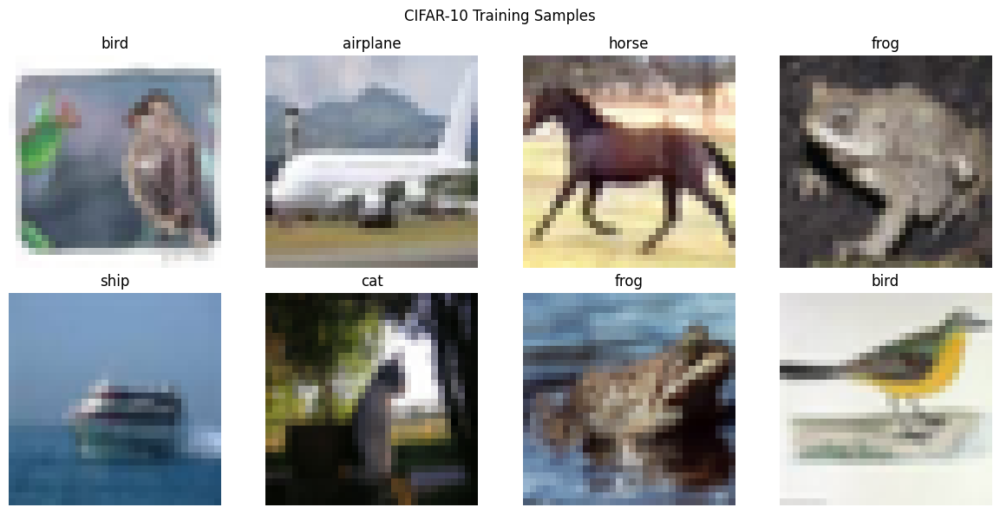

Generator parameters: 13,498,764
Discriminator parameters: 13,497,985

Starting progressive training...

Training ar Resolution 4x4
--------------------------------------------------


--- CIFAR-10 DATASET (Resolution: 4x4) ---
Total train images: 50000
  Train split:      45000
  Validation split: 5000
Test set size:      10000

Epoch 1/30 | Alpha: 0.10 | G_loss: 3.5448 | D_loss: 0.3030 | D(x): 0.874 | D(G(z)): 0.064


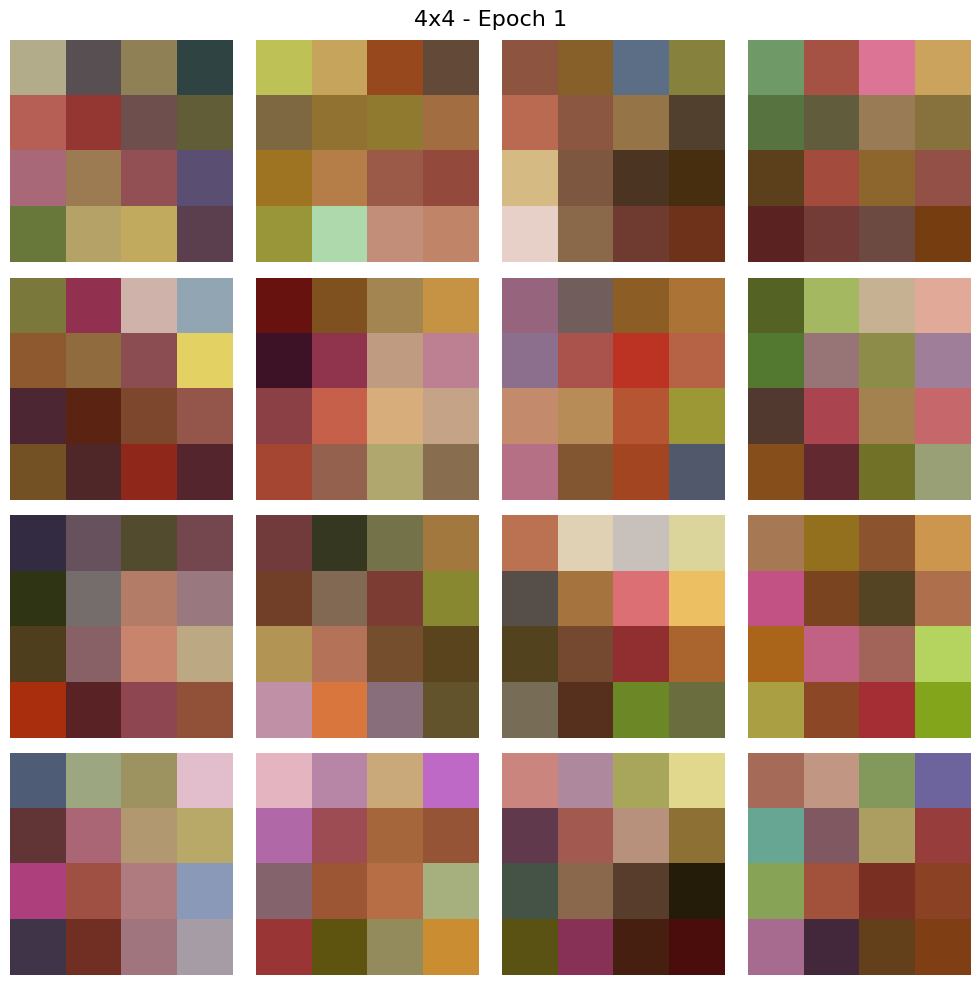

Epoch 2/30 | Alpha: 0.20 | G_loss: 2.3345 | D_loss: 0.6822 | D(x): 0.794 | D(G(z)): 0.173
Epoch 3/30 | Alpha: 0.30 | G_loss: 1.6295 | D_loss: 0.8788 | D(x): 0.697 | D(G(z)): 0.250
Epoch 4/30 | Alpha: 0.40 | G_loss: 1.3656 | D_loss: 1.0630 | D(x): 0.638 | D(G(z)): 0.310
Epoch 5/30 | Alpha: 0.50 | G_loss: 1.1515 | D_loss: 1.1655 | D(x): 0.602 | D(G(z)): 0.358
Epoch 6/30 | Alpha: 0.60 | G_loss: 1.1298 | D_loss: 1.2081 | D(x): 0.588 | D(G(z)): 0.368
Epoch 7/30 | Alpha: 0.70 | G_loss: 1.0947 | D_loss: 1.1927 | D(x): 0.587 | D(G(z)): 0.370
Epoch 8/30 | Alpha: 0.80 | G_loss: 1.1133 | D_loss: 1.1564 | D(x): 0.598 | D(G(z)): 0.365
Epoch 9/30 | Alpha: 0.90 | G_loss: 1.1543 | D_loss: 1.1322 | D(x): 0.607 | D(G(z)): 0.353
Epoch 10/30 | Alpha: 1.00 | G_loss: 1.1638 | D_loss: 1.1130 | D(x): 0.613 | D(G(z)): 0.355


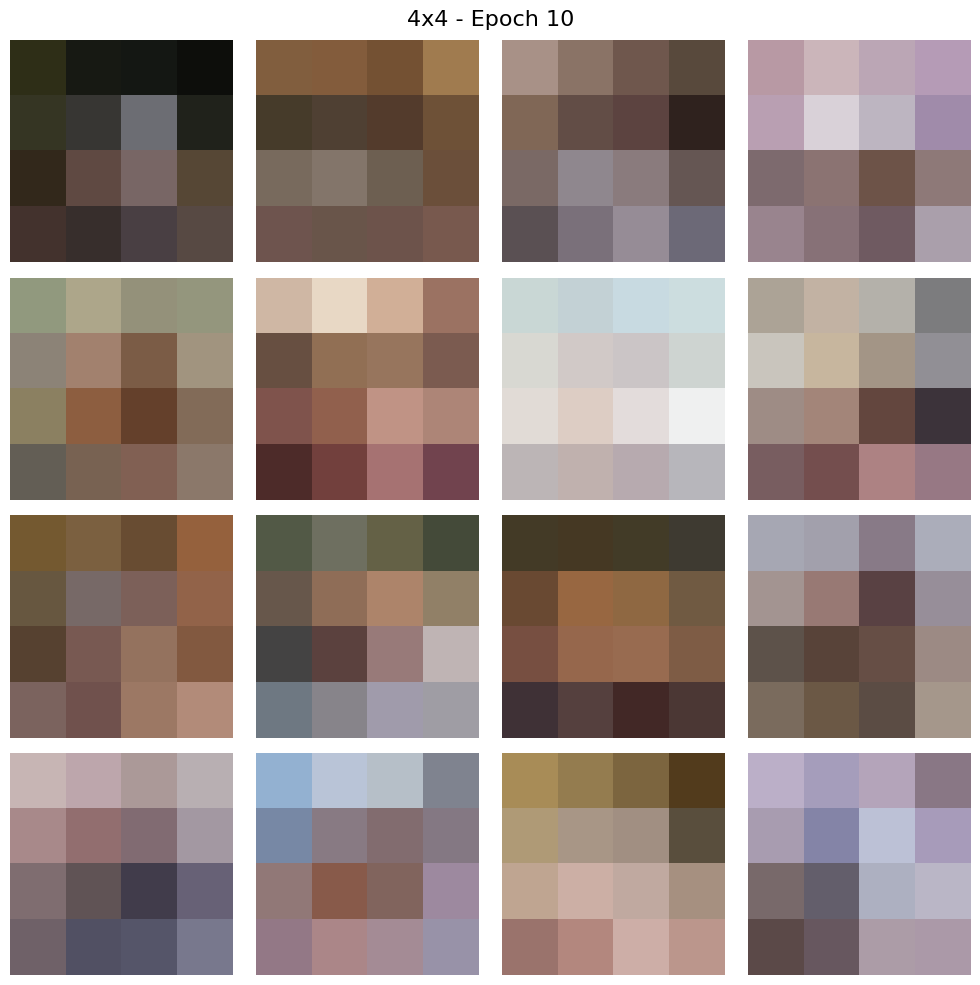

Epoch 11/30 | Alpha: 1.00 | G_loss: 1.2298 | D_loss: 1.0980 | D(x): 0.624 | D(G(z)): 0.342
Epoch 12/30 | Alpha: 1.00 | G_loss: 1.2213 | D_loss: 1.0745 | D(x): 0.629 | D(G(z)): 0.341
Epoch 13/30 | Alpha: 1.00 | G_loss: 1.2775 | D_loss: 1.0690 | D(x): 0.634 | D(G(z)): 0.328
Epoch 14/30 | Alpha: 1.00 | G_loss: 1.2782 | D_loss: 1.0542 | D(x): 0.638 | D(G(z)): 0.328
Epoch 15/30 | Alpha: 1.00 | G_loss: 1.2872 | D_loss: 1.0351 | D(x): 0.642 | D(G(z)): 0.324
Epoch 16/30 | Alpha: 1.00 | G_loss: 1.3079 | D_loss: 1.0159 | D(x): 0.649 | D(G(z)): 0.319
Epoch 17/30 | Alpha: 1.00 | G_loss: 1.3490 | D_loss: 1.0042 | D(x): 0.656 | D(G(z)): 0.312
Epoch 18/30 | Alpha: 1.00 | G_loss: 1.3763 | D_loss: 0.9851 | D(x): 0.662 | D(G(z)): 0.307
Epoch 19/30 | Alpha: 1.00 | G_loss: 1.4095 | D_loss: 0.9717 | D(x): 0.666 | D(G(z)): 0.301
Epoch 20/30 | Alpha: 1.00 | G_loss: 1.4104 | D_loss: 0.9724 | D(x): 0.668 | D(G(z)): 0.301


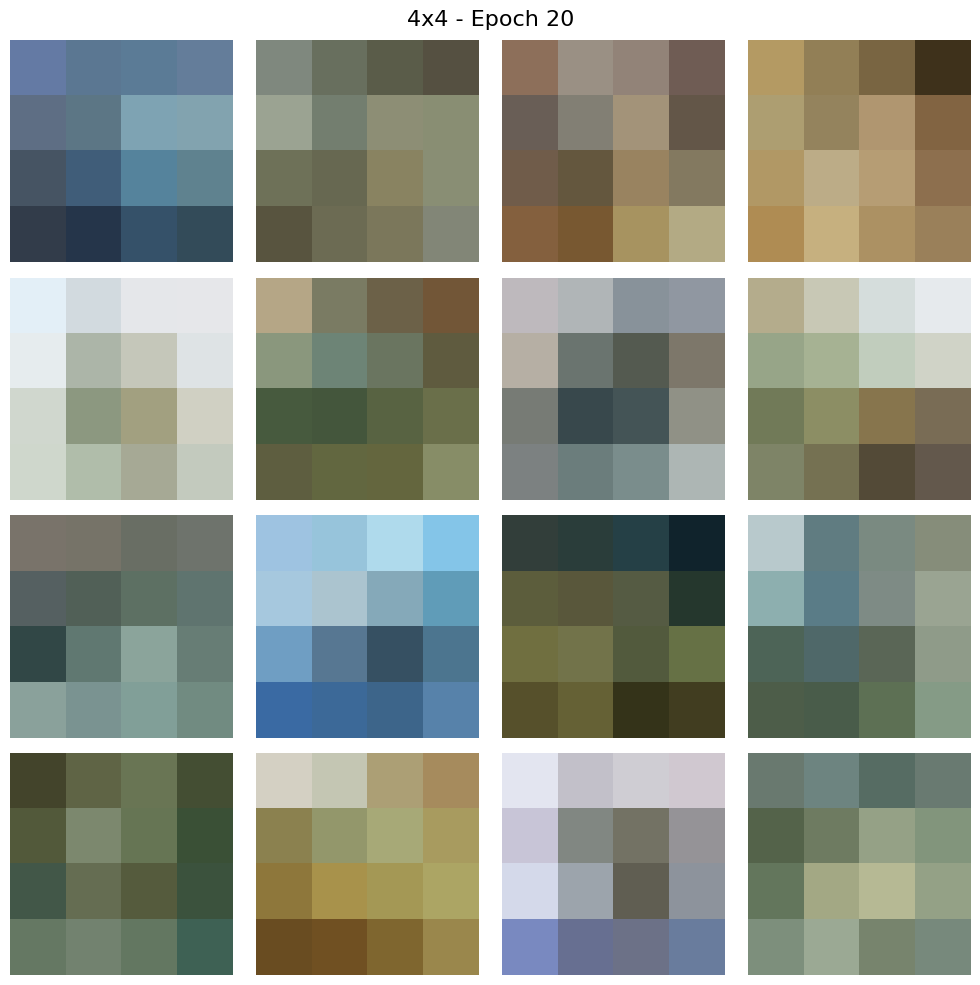

Epoch 21/30 | Alpha: 1.00 | G_loss: 1.4536 | D_loss: 0.9544 | D(x): 0.673 | D(G(z)): 0.290
Epoch 22/30 | Alpha: 1.00 | G_loss: 1.4461 | D_loss: 0.9412 | D(x): 0.677 | D(G(z)): 0.290
Epoch 23/30 | Alpha: 1.00 | G_loss: 1.4530 | D_loss: 0.9305 | D(x): 0.682 | D(G(z)): 0.291
Epoch 24/30 | Alpha: 1.00 | G_loss: 1.4721 | D_loss: 0.9098 | D(x): 0.688 | D(G(z)): 0.286
Epoch 25/30 | Alpha: 1.00 | G_loss: 1.5095 | D_loss: 0.8965 | D(x): 0.694 | D(G(z)): 0.280
Epoch 26/30 | Alpha: 1.00 | G_loss: 1.5323 | D_loss: 0.8996 | D(x): 0.695 | D(G(z)): 0.278
Epoch 27/30 | Alpha: 1.00 | G_loss: 1.5057 | D_loss: 0.8792 | D(x): 0.699 | D(G(z)): 0.280
Epoch 28/30 | Alpha: 1.00 | G_loss: 1.5755 | D_loss: 0.8778 | D(x): 0.703 | D(G(z)): 0.269
Epoch 29/30 | Alpha: 1.00 | G_loss: 1.5355 | D_loss: 0.8659 | D(x): 0.704 | D(G(z)): 0.275
Epoch 30/30 | Alpha: 1.00 | G_loss: 1.6663 | D_loss: 0.8709 | D(x): 0.709 | D(G(z)): 0.260


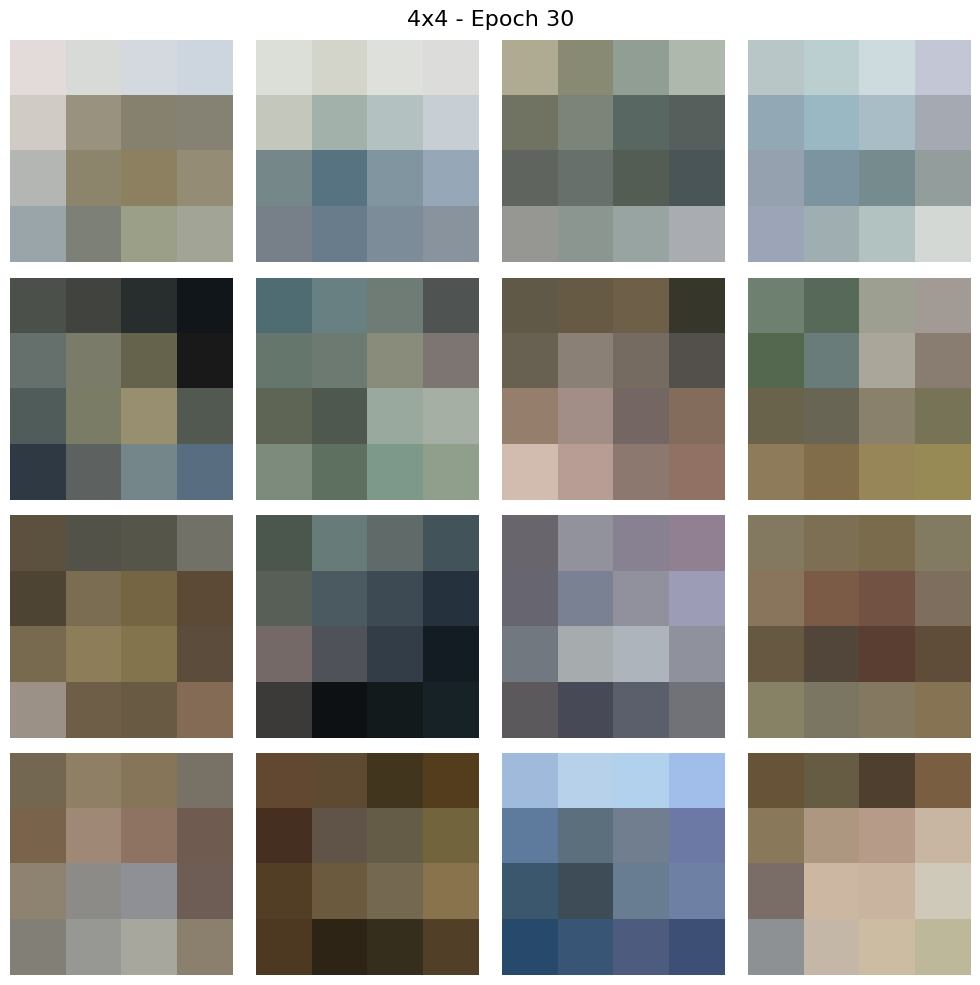

Generator grew to 8x8
Discriminator grew to 8x8
Training ar Resolution 8x8
--------------------------------------------------


--- CIFAR-10 DATASET (Resolution: 8x8) ---
Total train images: 50000
  Train split:      45000
  Validation split: 5000
Test set size:      10000

Epoch 1/30 | Alpha: 0.10 | G_loss: 2.1424 | D_loss: 0.7489 | D(x): 0.760 | D(G(z)): 0.198


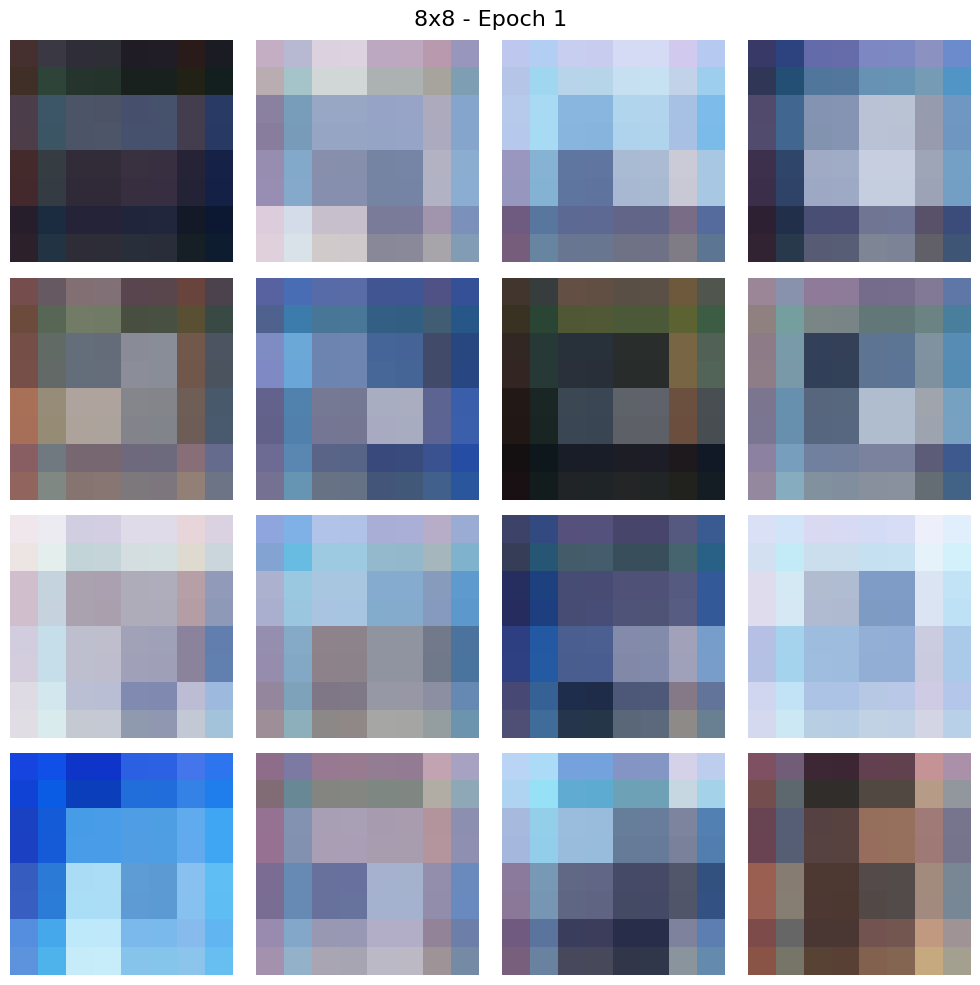

Epoch 2/30 | Alpha: 0.20 | G_loss: 2.4170 | D_loss: 0.7117 | D(x): 0.781 | D(G(z)): 0.161
Epoch 3/30 | Alpha: 0.30 | G_loss: 2.0927 | D_loss: 0.8032 | D(x): 0.737 | D(G(z)): 0.200
Epoch 4/30 | Alpha: 0.40 | G_loss: 1.7996 | D_loss: 0.9014 | D(x): 0.706 | D(G(z)): 0.235
Epoch 5/30 | Alpha: 0.50 | G_loss: 1.6602 | D_loss: 0.9324 | D(x): 0.688 | D(G(z)): 0.251
Epoch 6/30 | Alpha: 0.60 | G_loss: 1.5148 | D_loss: 0.9828 | D(x): 0.664 | D(G(z)): 0.279
Epoch 7/30 | Alpha: 0.70 | G_loss: 1.4931 | D_loss: 0.9755 | D(x): 0.666 | D(G(z)): 0.284
Epoch 8/30 | Alpha: 0.80 | G_loss: 1.4845 | D_loss: 1.0137 | D(x): 0.657 | D(G(z)): 0.288
Epoch 9/30 | Alpha: 0.90 | G_loss: 1.4324 | D_loss: 1.0426 | D(x): 0.646 | D(G(z)): 0.297
Epoch 10/30 | Alpha: 1.00 | G_loss: 1.4607 | D_loss: 1.0452 | D(x): 0.647 | D(G(z)): 0.290


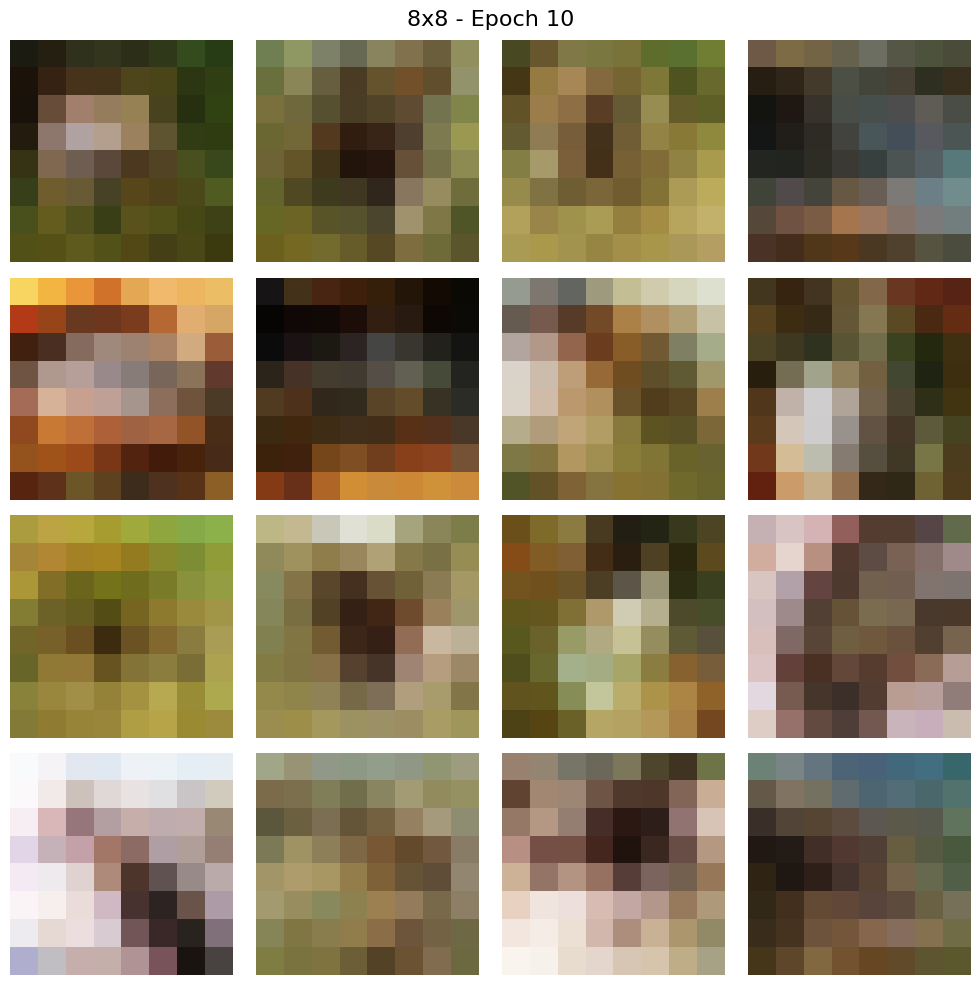

Epoch 11/30 | Alpha: 1.00 | G_loss: 1.4244 | D_loss: 1.0315 | D(x): 0.649 | D(G(z)): 0.298
Epoch 12/30 | Alpha: 1.00 | G_loss: 1.4135 | D_loss: 1.0304 | D(x): 0.649 | D(G(z)): 0.303
Epoch 13/30 | Alpha: 1.00 | G_loss: 1.4008 | D_loss: 1.0374 | D(x): 0.647 | D(G(z)): 0.308
Epoch 14/30 | Alpha: 1.00 | G_loss: 1.4100 | D_loss: 1.0342 | D(x): 0.649 | D(G(z)): 0.307
Epoch 15/30 | Alpha: 1.00 | G_loss: 1.4215 | D_loss: 1.0253 | D(x): 0.651 | D(G(z)): 0.305
Epoch 16/30 | Alpha: 1.00 | G_loss: 1.4144 | D_loss: 1.0261 | D(x): 0.652 | D(G(z)): 0.308
Epoch 17/30 | Alpha: 1.00 | G_loss: 1.4162 | D_loss: 1.0267 | D(x): 0.652 | D(G(z)): 0.308
Epoch 18/30 | Alpha: 1.00 | G_loss: 1.4051 | D_loss: 1.0332 | D(x): 0.649 | D(G(z)): 0.311
Epoch 19/30 | Alpha: 1.00 | G_loss: 1.3959 | D_loss: 1.0317 | D(x): 0.649 | D(G(z)): 0.313
Epoch 20/30 | Alpha: 1.00 | G_loss: 1.3829 | D_loss: 1.0354 | D(x): 0.647 | D(G(z)): 0.318


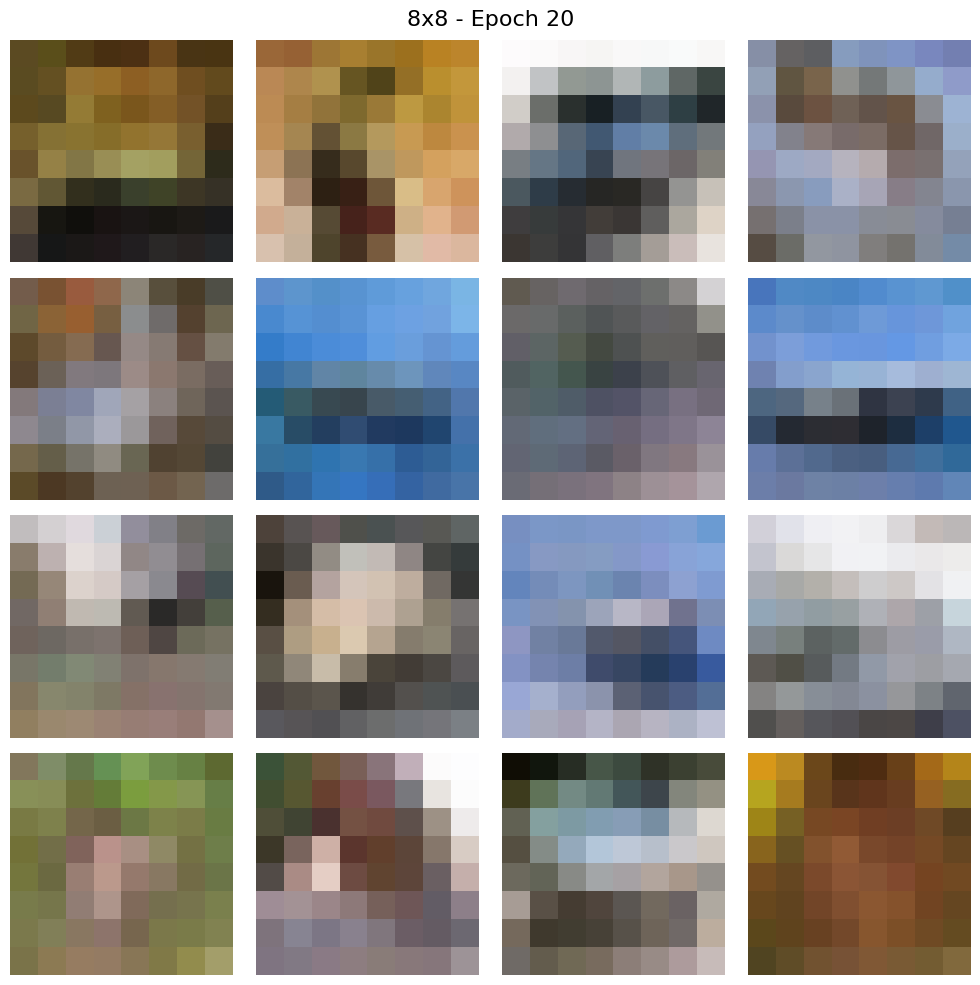

Epoch 21/30 | Alpha: 1.00 | G_loss: 1.3896 | D_loss: 1.0304 | D(x): 0.648 | D(G(z)): 0.318
Epoch 22/30 | Alpha: 1.00 | G_loss: 1.3985 | D_loss: 1.0233 | D(x): 0.651 | D(G(z)): 0.317
Epoch 23/30 | Alpha: 1.00 | G_loss: 1.4088 | D_loss: 1.0192 | D(x): 0.653 | D(G(z)): 0.316
Epoch 24/30 | Alpha: 1.00 | G_loss: 1.4273 | D_loss: 1.0169 | D(x): 0.653 | D(G(z)): 0.313
Epoch 25/30 | Alpha: 1.00 | G_loss: 1.4311 | D_loss: 1.0133 | D(x): 0.654 | D(G(z)): 0.313
Epoch 26/30 | Alpha: 1.00 | G_loss: 1.4376 | D_loss: 1.0045 | D(x): 0.658 | D(G(z)): 0.314
Epoch 27/30 | Alpha: 1.00 | G_loss: 1.4515 | D_loss: 0.9997 | D(x): 0.659 | D(G(z)): 0.313
Epoch 28/30 | Alpha: 1.00 | G_loss: 1.4464 | D_loss: 1.0004 | D(x): 0.658 | D(G(z)): 0.314
Epoch 29/30 | Alpha: 1.00 | G_loss: 1.4771 | D_loss: 0.9913 | D(x): 0.662 | D(G(z)): 0.309
Epoch 30/30 | Alpha: 1.00 | G_loss: 1.4803 | D_loss: 0.9845 | D(x): 0.664 | D(G(z)): 0.309


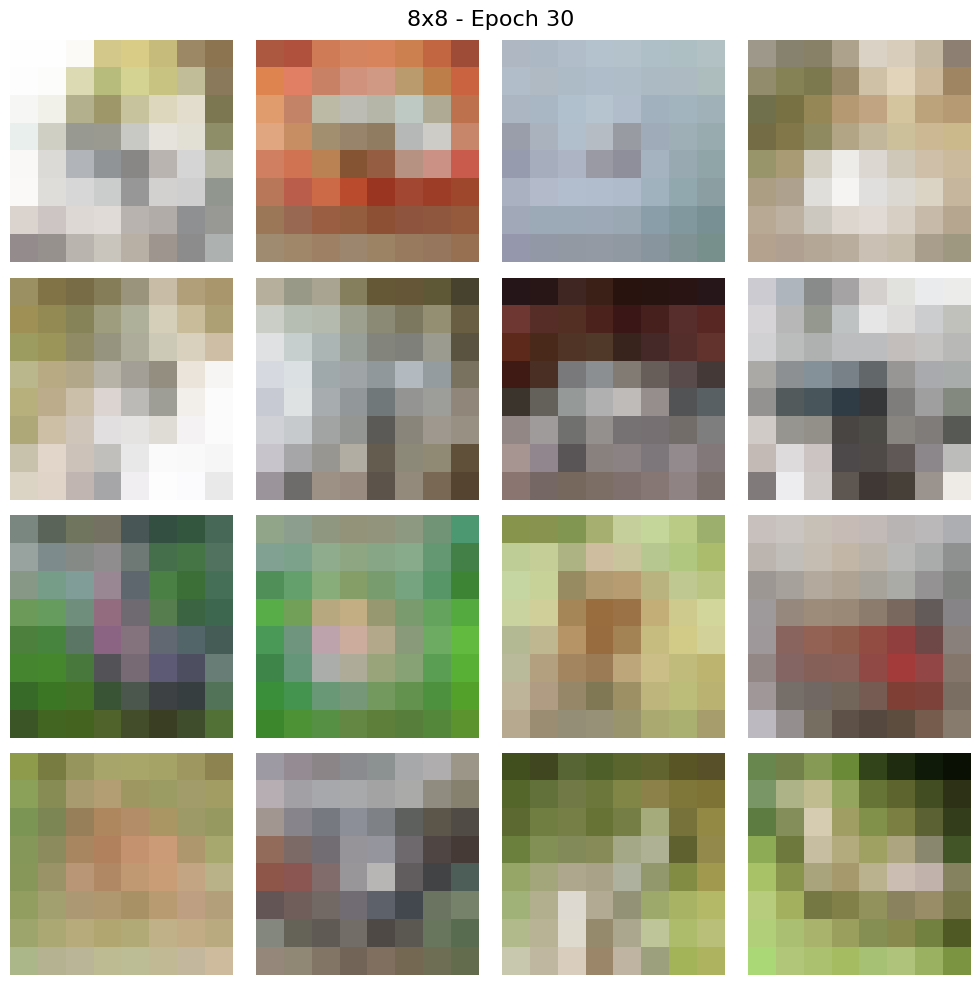

Generator grew to 16x16
Discriminator grew to 16x16
Training ar Resolution 16x16
--------------------------------------------------


--- CIFAR-10 DATASET (Resolution: 16x16) ---
Total train images: 50000
  Train split:      45000
  Validation split: 5000
Test set size:      10000

Epoch 1/30 | Alpha: 0.10 | G_loss: 1.7664 | D_loss: 0.8897 | D(x): 0.705 | D(G(z)): 0.263


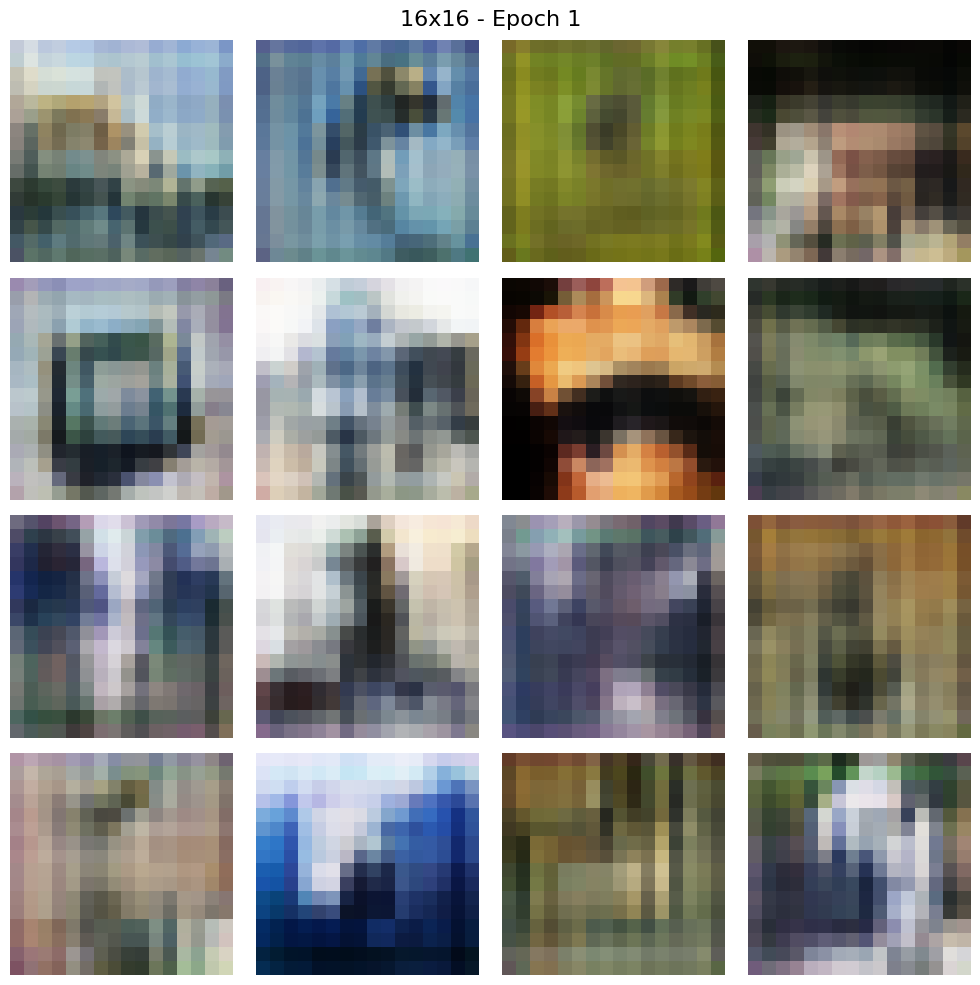

Epoch 2/30 | Alpha: 0.20 | G_loss: 1.7251 | D_loss: 0.9303 | D(x): 0.695 | D(G(z)): 0.266
Epoch 3/30 | Alpha: 0.30 | G_loss: 1.5432 | D_loss: 0.9778 | D(x): 0.671 | D(G(z)): 0.295
Epoch 4/30 | Alpha: 0.40 | G_loss: 1.5188 | D_loss: 0.9749 | D(x): 0.669 | D(G(z)): 0.299
Epoch 5/30 | Alpha: 0.50 | G_loss: 1.5094 | D_loss: 0.9715 | D(x): 0.670 | D(G(z)): 0.301
Epoch 6/30 | Alpha: 0.60 | G_loss: 1.5229 | D_loss: 0.9645 | D(x): 0.672 | D(G(z)): 0.301
Epoch 7/30 | Alpha: 0.70 | G_loss: 1.5546 | D_loss: 0.9568 | D(x): 0.676 | D(G(z)): 0.294
Epoch 8/30 | Alpha: 0.80 | G_loss: 1.5949 | D_loss: 0.9465 | D(x): 0.682 | D(G(z)): 0.291
Epoch 9/30 | Alpha: 0.90 | G_loss: 1.6838 | D_loss: 0.9178 | D(x): 0.693 | D(G(z)): 0.282
Epoch 10/30 | Alpha: 1.00 | G_loss: 1.7561 | D_loss: 0.9007 | D(x): 0.702 | D(G(z)): 0.273


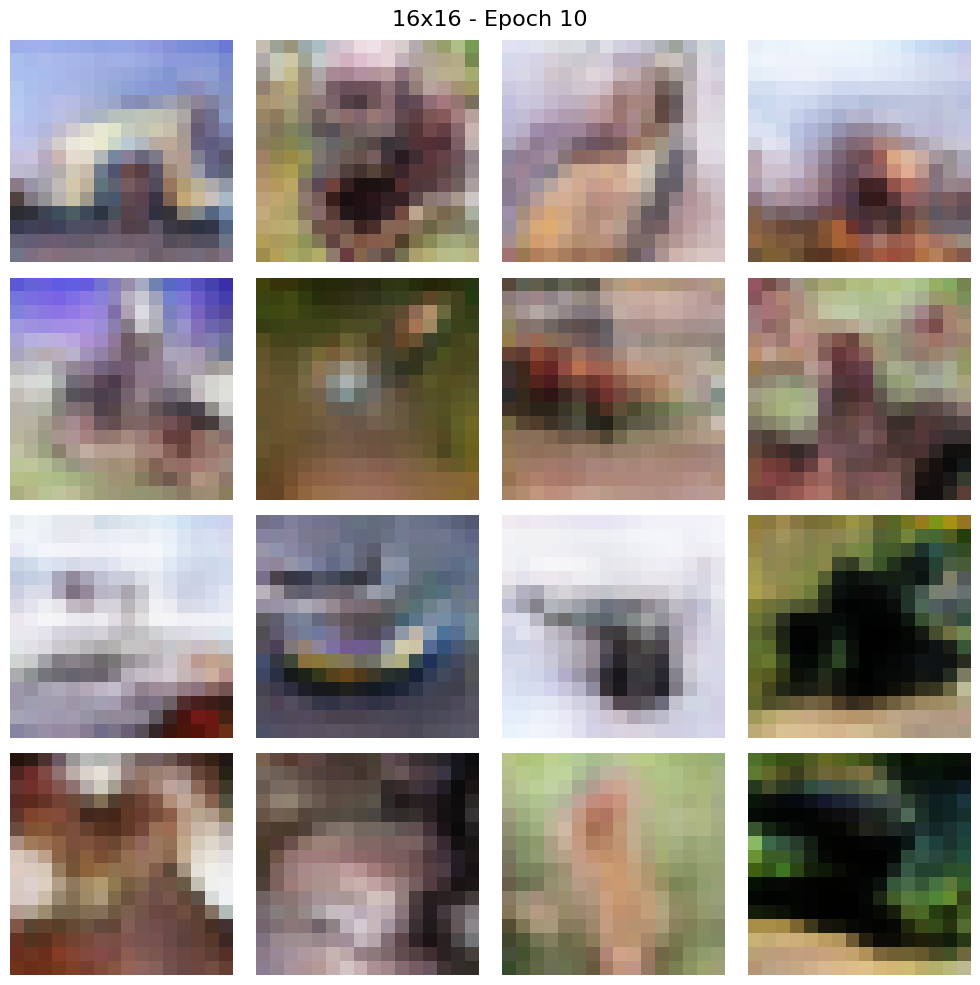

Epoch 11/30 | Alpha: 1.00 | G_loss: 1.8056 | D_loss: 0.8906 | D(x): 0.706 | D(G(z)): 0.270
Epoch 12/30 | Alpha: 1.00 | G_loss: 1.8773 | D_loss: 0.8656 | D(x): 0.714 | D(G(z)): 0.260
Epoch 13/30 | Alpha: 1.00 | G_loss: 1.9244 | D_loss: 0.8471 | D(x): 0.721 | D(G(z)): 0.257
Epoch 14/30 | Alpha: 1.00 | G_loss: 1.9986 | D_loss: 0.8256 | D(x): 0.729 | D(G(z)): 0.250
Epoch 15/30 | Alpha: 1.00 | G_loss: 2.0952 | D_loss: 0.7969 | D(x): 0.739 | D(G(z)): 0.240
Epoch 16/30 | Alpha: 1.00 | G_loss: 2.1823 | D_loss: 0.7734 | D(x): 0.747 | D(G(z)): 0.231
Epoch 17/30 | Alpha: 1.00 | G_loss: 2.2713 | D_loss: 0.7451 | D(x): 0.757 | D(G(z)): 0.224
Epoch 18/30 | Alpha: 1.00 | G_loss: 2.3664 | D_loss: 0.7242 | D(x): 0.765 | D(G(z)): 0.217
Epoch 19/30 | Alpha: 1.00 | G_loss: 2.4594 | D_loss: 0.6997 | D(x): 0.773 | D(G(z)): 0.212
Epoch 20/30 | Alpha: 1.00 | G_loss: 2.5582 | D_loss: 0.6760 | D(x): 0.781 | D(G(z)): 0.202


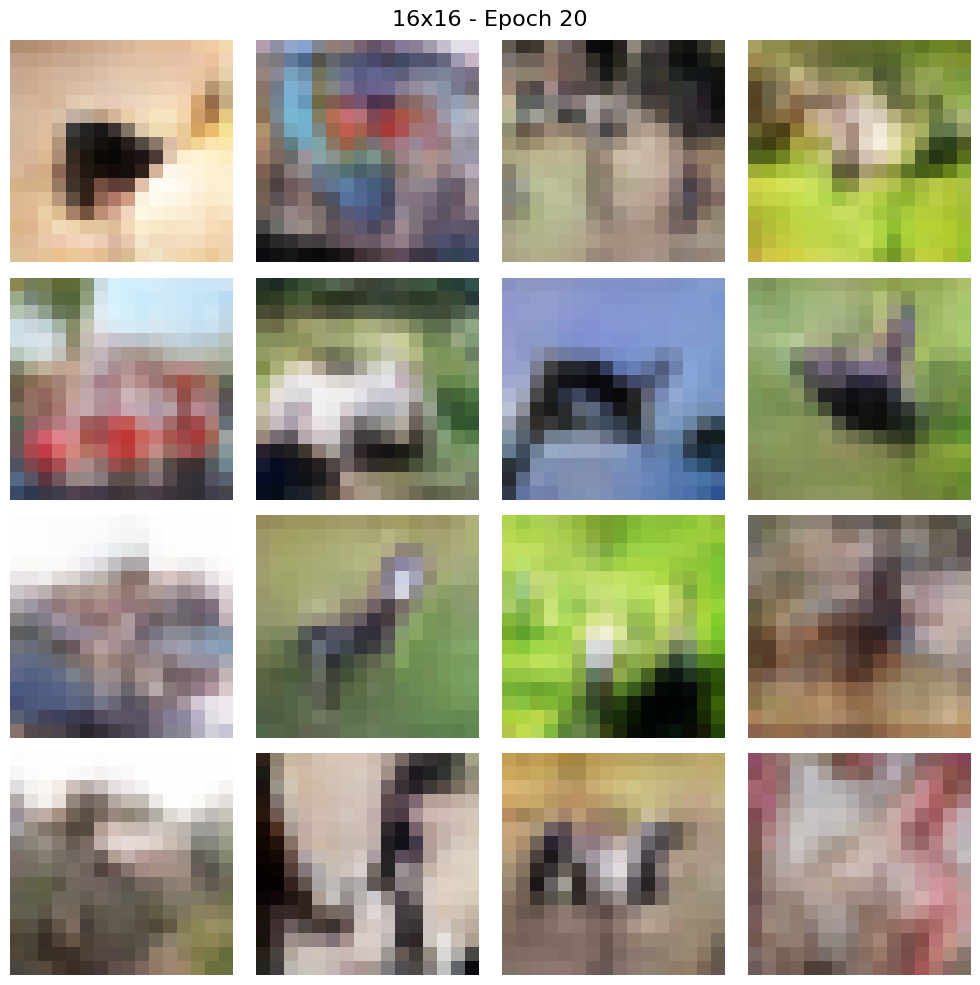

Epoch 21/30 | Alpha: 1.00 | G_loss: 2.6666 | D_loss: 0.6512 | D(x): 0.790 | D(G(z)): 0.196
Epoch 22/30 | Alpha: 1.00 | G_loss: 2.7964 | D_loss: 0.6355 | D(x): 0.796 | D(G(z)): 0.187
Epoch 23/30 | Alpha: 1.00 | G_loss: 2.8993 | D_loss: 0.6106 | D(x): 0.804 | D(G(z)): 0.183
Epoch 24/30 | Alpha: 1.00 | G_loss: 3.0175 | D_loss: 0.5933 | D(x): 0.811 | D(G(z)): 0.172
Epoch 25/30 | Alpha: 1.00 | G_loss: 3.1190 | D_loss: 0.5732 | D(x): 0.817 | D(G(z)): 0.168
Epoch 26/30 | Alpha: 1.00 | G_loss: 3.1900 | D_loss: 0.5678 | D(x): 0.820 | D(G(z)): 0.168
Epoch 27/30 | Alpha: 1.00 | G_loss: 3.3210 | D_loss: 0.5426 | D(x): 0.829 | D(G(z)): 0.159
Epoch 28/30 | Alpha: 1.00 | G_loss: 3.4444 | D_loss: 0.5213 | D(x): 0.835 | D(G(z)): 0.149
Epoch 29/30 | Alpha: 1.00 | G_loss: 3.5011 | D_loss: 0.5116 | D(x): 0.839 | D(G(z)): 0.150
Epoch 30/30 | Alpha: 1.00 | G_loss: 3.5929 | D_loss: 0.4942 | D(x): 0.844 | D(G(z)): 0.145


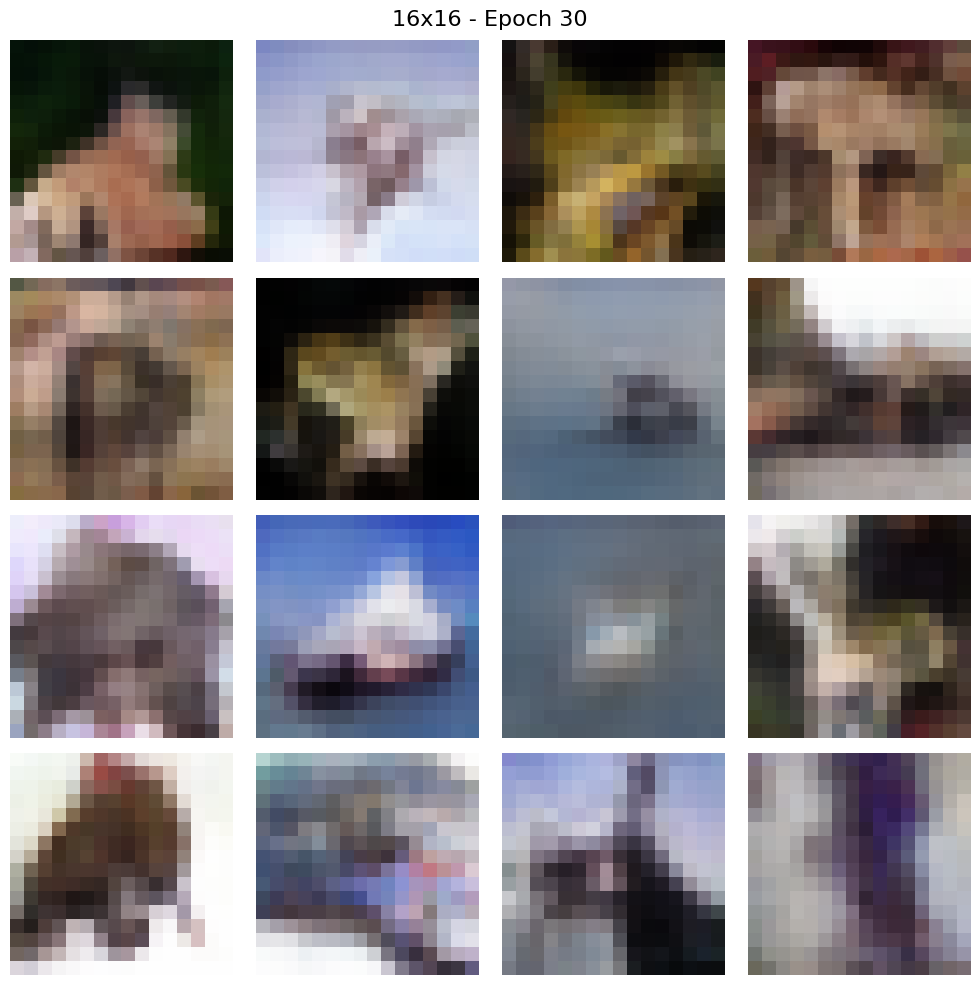

Generator grew to 32x32
Discriminator grew to 32x32
Training ar Resolution 32x32
--------------------------------------------------


--- CIFAR-10 DATASET (Resolution: 32x32) ---
Total train images: 50000
  Train split:      45000
  Validation split: 5000
Test set size:      10000

Epoch 1/30 | Alpha: 0.10 | G_loss: 3.6242 | D_loss: 0.5384 | D(x): 0.840 | D(G(z)): 0.145


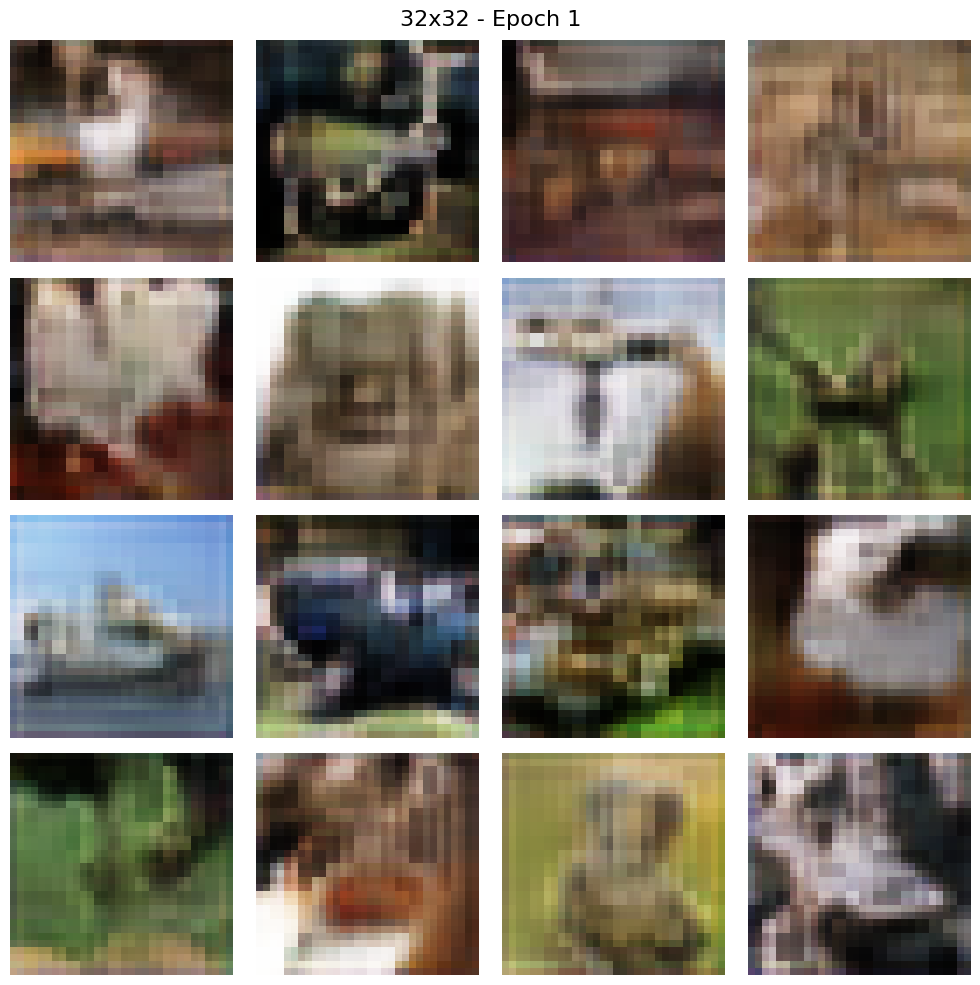

Epoch 2/30 | Alpha: 0.20 | G_loss: 3.4687 | D_loss: 0.5373 | D(x): 0.836 | D(G(z)): 0.147
Epoch 3/30 | Alpha: 0.30 | G_loss: 3.3824 | D_loss: 0.5263 | D(x): 0.837 | D(G(z)): 0.150
Epoch 4/30 | Alpha: 0.40 | G_loss: 3.3637 | D_loss: 0.5308 | D(x): 0.834 | D(G(z)): 0.149
Epoch 5/30 | Alpha: 0.50 | G_loss: 3.3748 | D_loss: 0.5233 | D(x): 0.837 | D(G(z)): 0.149
Epoch 6/30 | Alpha: 0.60 | G_loss: 3.4174 | D_loss: 0.5145 | D(x): 0.839 | D(G(z)): 0.148
Epoch 7/30 | Alpha: 0.70 | G_loss: 3.5148 | D_loss: 0.4983 | D(x): 0.845 | D(G(z)): 0.145
Epoch 8/30 | Alpha: 0.80 | G_loss: 3.5992 | D_loss: 0.4880 | D(x): 0.849 | D(G(z)): 0.141
Epoch 9/30 | Alpha: 0.90 | G_loss: 3.7326 | D_loss: 0.4811 | D(x): 0.853 | D(G(z)): 0.134
Epoch 10/30 | Alpha: 1.00 | G_loss: 3.9754 | D_loss: 0.4594 | D(x): 0.862 | D(G(z)): 0.127


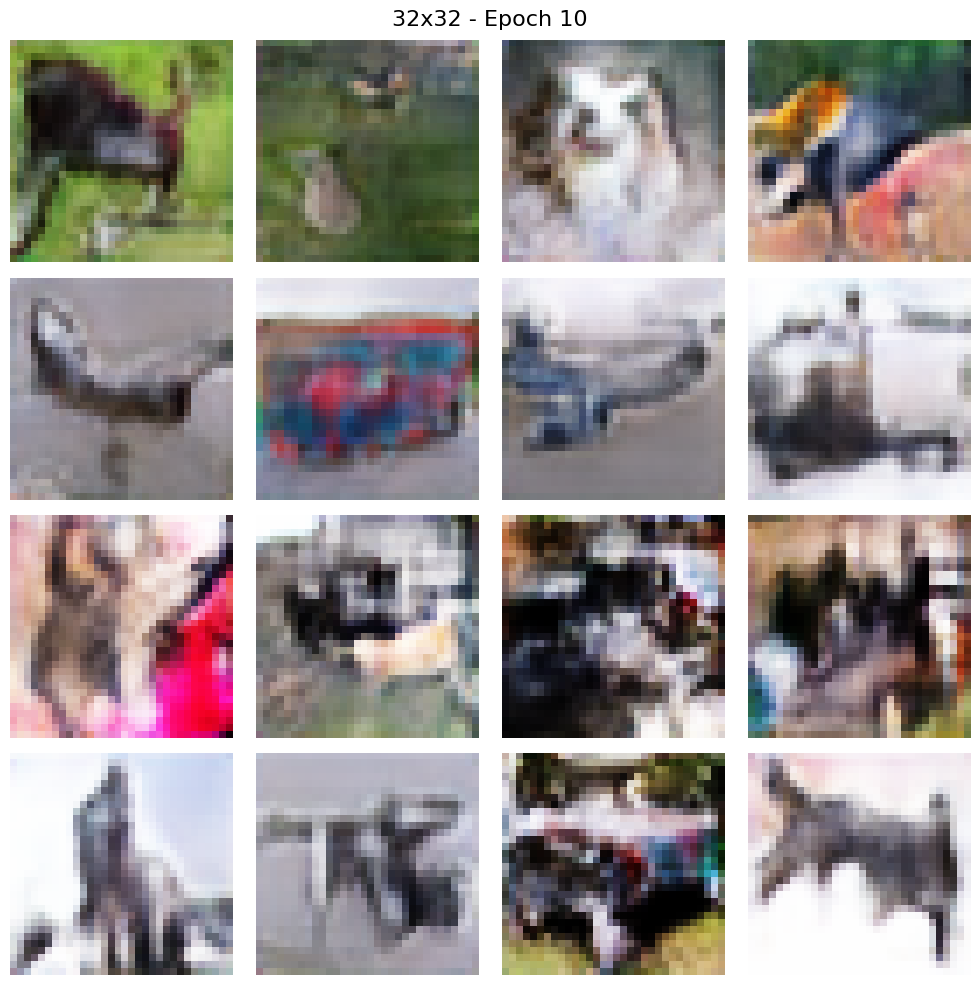

Epoch 11/30 | Alpha: 1.00 | G_loss: 4.0934 | D_loss: 0.4514 | D(x): 0.865 | D(G(z)): 0.123
Epoch 12/30 | Alpha: 1.00 | G_loss: 4.1570 | D_loss: 0.4398 | D(x): 0.869 | D(G(z)): 0.121
Epoch 13/30 | Alpha: 1.00 | G_loss: 4.2578 | D_loss: 0.4310 | D(x): 0.872 | D(G(z)): 0.117
Epoch 14/30 | Alpha: 1.00 | G_loss: 4.3123 | D_loss: 0.4215 | D(x): 0.875 | D(G(z)): 0.116
Epoch 15/30 | Alpha: 1.00 | G_loss: 4.4536 | D_loss: 0.4117 | D(x): 0.878 | D(G(z)): 0.113
Epoch 16/30 | Alpha: 1.00 | G_loss: 4.5237 | D_loss: 0.3940 | D(x): 0.883 | D(G(z)): 0.109
Epoch 17/30 | Alpha: 1.00 | G_loss: 4.5822 | D_loss: 0.3906 | D(x): 0.885 | D(G(z)): 0.108
Epoch 18/30 | Alpha: 1.00 | G_loss: 4.6816 | D_loss: 0.3763 | D(x): 0.889 | D(G(z)): 0.104
Epoch 19/30 | Alpha: 1.00 | G_loss: 4.7714 | D_loss: 0.3728 | D(x): 0.891 | D(G(z)): 0.102
Epoch 20/30 | Alpha: 1.00 | G_loss: 4.8379 | D_loss: 0.3595 | D(x): 0.895 | D(G(z)): 0.100


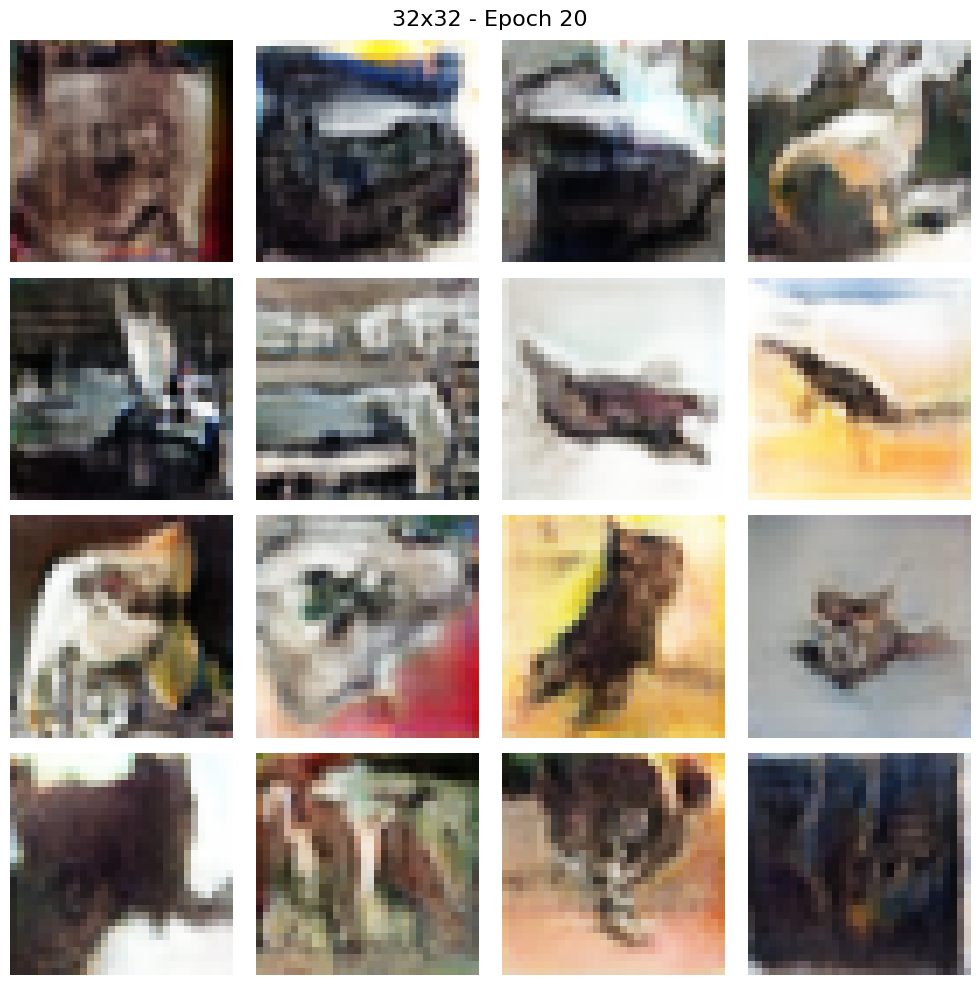

Epoch 21/30 | Alpha: 1.00 | G_loss: 4.9212 | D_loss: 0.3561 | D(x): 0.896 | D(G(z)): 0.096
Epoch 22/30 | Alpha: 1.00 | G_loss: 5.0332 | D_loss: 0.3502 | D(x): 0.898 | D(G(z)): 0.094
Epoch 23/30 | Alpha: 1.00 | G_loss: 5.0487 | D_loss: 0.3430 | D(x): 0.900 | D(G(z)): 0.095
Epoch 24/30 | Alpha: 1.00 | G_loss: 5.1626 | D_loss: 0.3329 | D(x): 0.903 | D(G(z)): 0.091
Epoch 25/30 | Alpha: 1.00 | G_loss: 5.2087 | D_loss: 0.3287 | D(x): 0.905 | D(G(z)): 0.089
Epoch 26/30 | Alpha: 1.00 | G_loss: 5.2598 | D_loss: 0.3222 | D(x): 0.906 | D(G(z)): 0.086
Epoch 27/30 | Alpha: 1.00 | G_loss: 5.3971 | D_loss: 0.3107 | D(x): 0.910 | D(G(z)): 0.084
Epoch 28/30 | Alpha: 1.00 | G_loss: 5.5571 | D_loss: 0.2961 | D(x): 0.914 | D(G(z)): 0.082
Epoch 29/30 | Alpha: 1.00 | G_loss: 5.5880 | D_loss: 0.3024 | D(x): 0.913 | D(G(z)): 0.080
Epoch 30/30 | Alpha: 1.00 | G_loss: 5.7153 | D_loss: 0.2863 | D(x): 0.917 | D(G(z)): 0.078


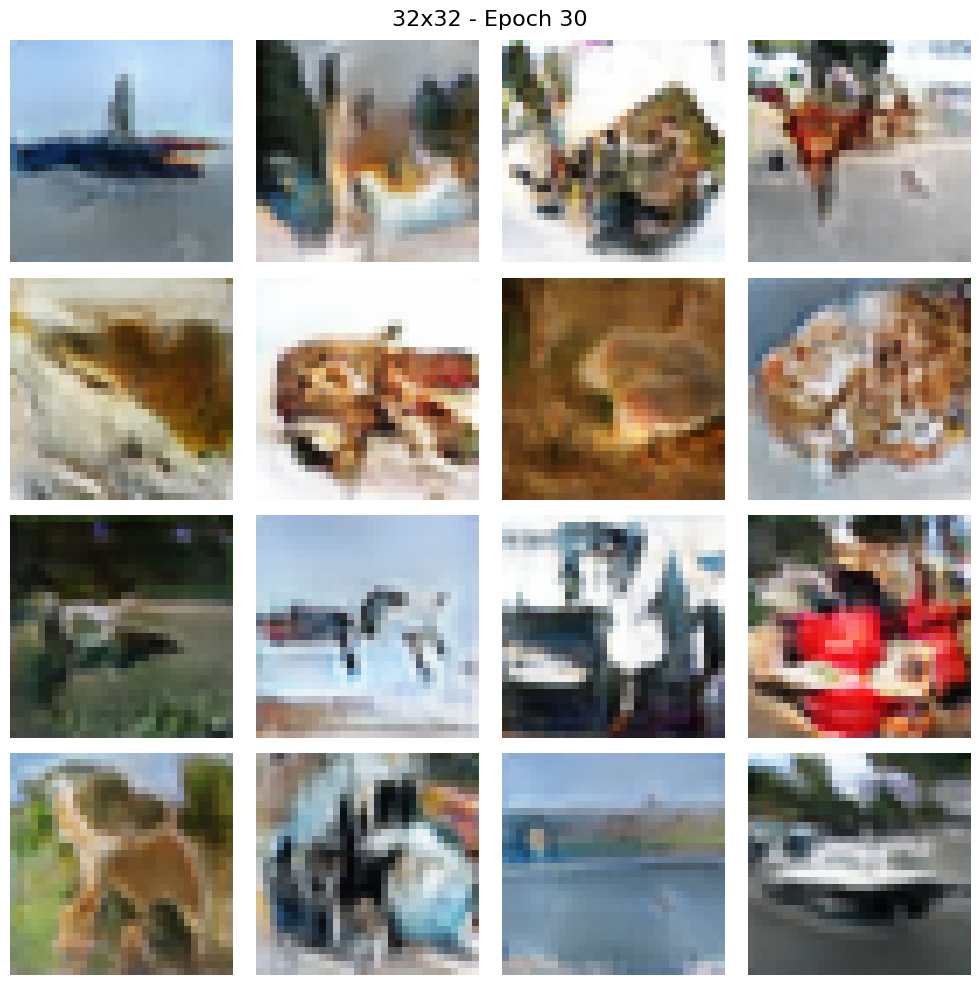


Training completed! Plotting results...



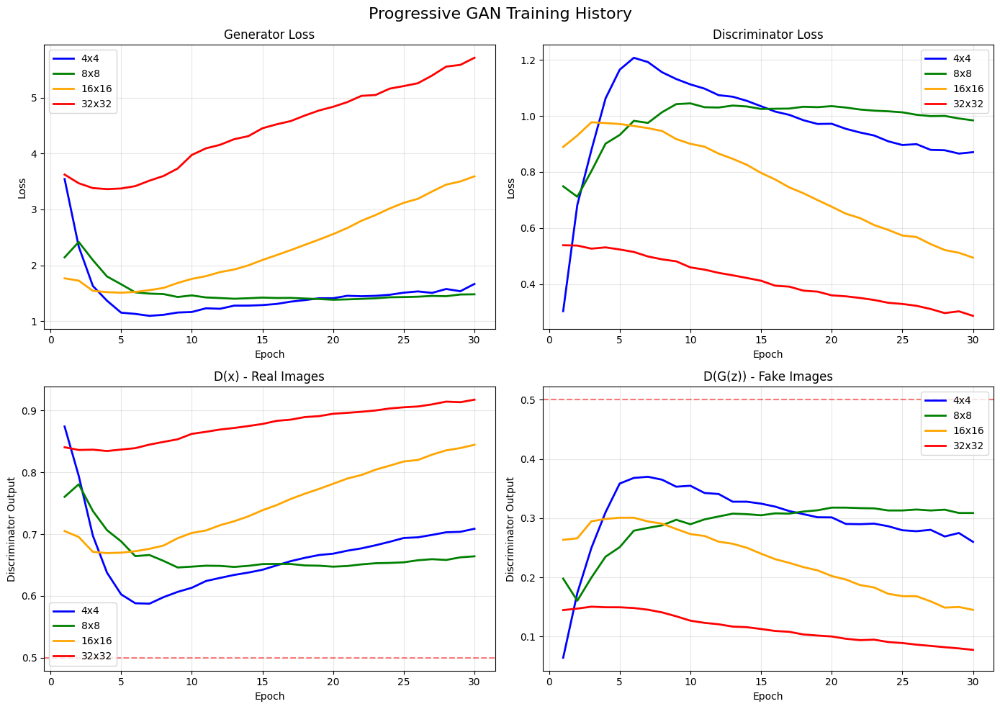

Visualizing resolution evolution...



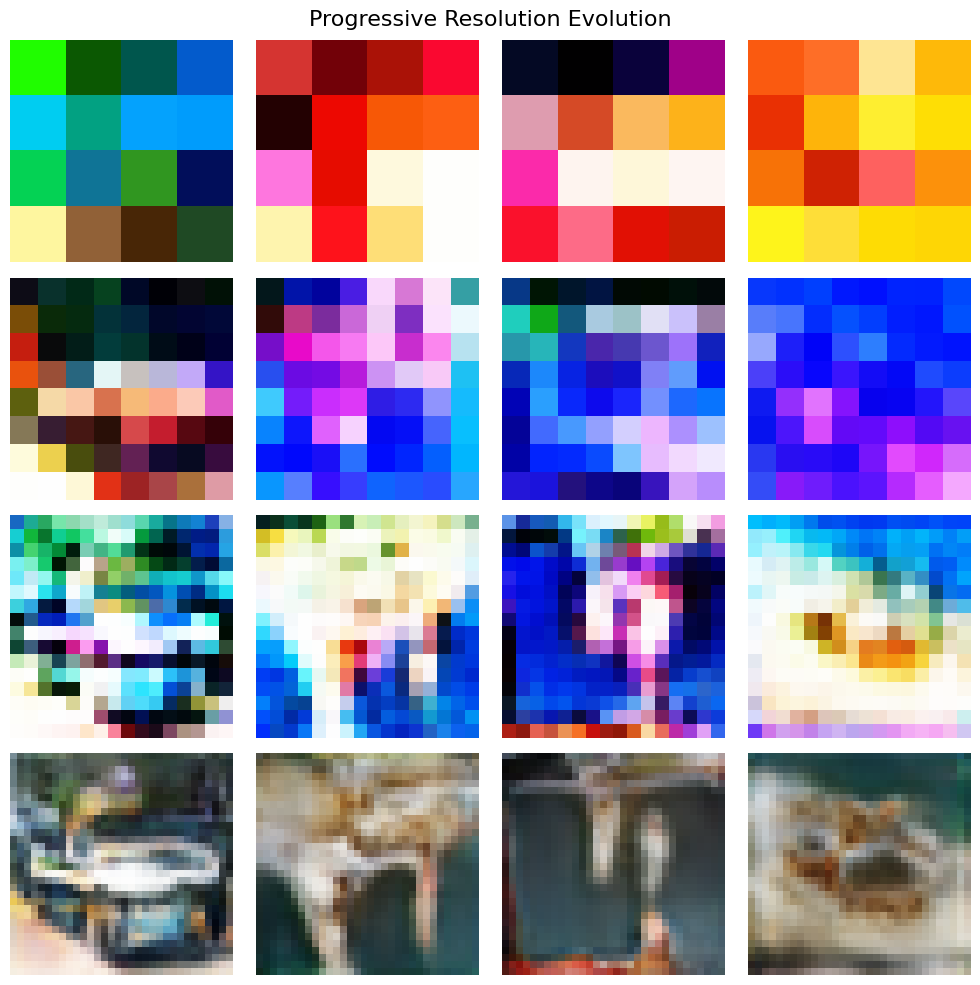

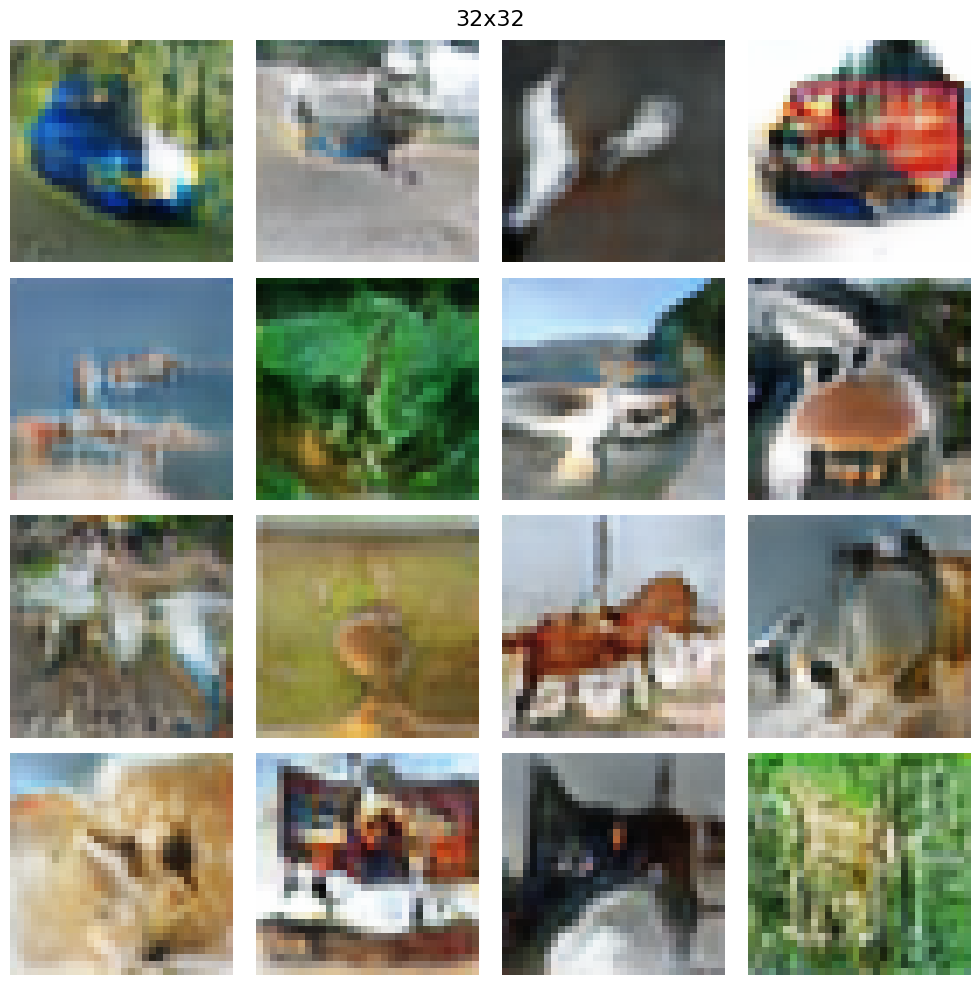

In [61]:
generator_prog, discriminator_prog, history_prog = run_progressive_gan_experiment(
    latent_dim=512,
    max_resolution=32,
    epochs_per_resolution=30,
    fade_in_epochs=10,
    device="cuda")